# 1.PCoA and blank removal

In [1]:
# Install libraries that are not preinstalled
!pip install pandas==2.0.0 numpy plotly scikit-learn scikit-posthocs pingouin kaleido nbformat session_info PyComplexHeatmap==1.6 yellowbrick matplotlib

In [2]:
# importing necessary modules
import pandas as pd
import numpy as np

import glob
import os
import re
import itertools
import io
import session_info
import shutil
import warnings
import matplotlib.pyplot as plt
import platform
import math
import scipy.stats as stats

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.io as pio

In [3]:
# Get the operating system information
os_info = platform.system()

# Print the operating system
print(f"The operating system is: {os_info}")

The operating system is: Linux


In [4]:
if os != "Windows":
    !pip install scikit-bio
    import skbio
    from skbio.stats.distance import permdisp
    print('You can compute PCoA and PERMANOVA')

You can compute PCoA and PERMANOVA


In [5]:
# Disable warnings for cleaner output, comment out for debugging
warnings.filterwarnings('ignore')

In [6]:
import os

# Automatically select the current working directory
current_dir = os.getcwd()
os.chdir(current_dir)

print(f"Current working directory: {current_dir}")

Current working directory: /home/jarmo/Ocean_ASMS/AbsolutelyFinal/FBMN_1.7min/Clean_1blnkrem/notebook


---
## Data import
<a name='load_ip'></a>

### Step 4.1: Loading files from a local folder

Please make sure to include all the necessary input files in the folder you have set as input directory

In [7]:
import os
import pandas as pd

# List all the files in the current working directory
file_names = os.listdir('.')

# Specify the filenames directly
feature_table_file = 'featuretable_reformated.csv'
metadata_file = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'

# Read the files
ft = pd.read_csv(feature_table_file)
md = pd.read_csv(metadata_file, sep='\t', encoding='ISO-8859-1')

---
<font color="red" size=4> In the cell below, provide the index number of the annotation files. Be careful to input the numbers without any spaces. </font>

In [8]:

# Specify the filenames directly
feature_table_file = 'featuretable_reformated.csv'
metadata_file = 'merged_metadata_AbsolutelyFinal_FBMN_20241110.txt'

# Read the files
ft = pd.read_csv(feature_table_file)
md = pd.read_csv(metadata_file, sep='\t', encoding='ISO-8859-1')

# Automatically set annotation choice to 'n' and select the file
annotation_choice = 'n'
gnps_file = 'Updated_merged_results_with_gnps.tsv'

if annotation_choice.lower() == 'y':
    input_str = input('Enter the index number of the GNPS library annotation file and the analog annotation files separated by commas: ')
    input_list = input_str.strip().split(',')
    an_gnps = pd.read_csv(file_names[int(input_list[0])], sep='\t')
    an_analog = pd.read_csv(file_names[int(input_list[1])], sep='\t')
elif annotation_choice.lower() == 'n':
    an_gnps = pd.read_csv(gnps_file, sep='\t')
    an_analog = an_gnps.copy()  # If only GNPS is provided, analog will be the same
else:
    print('Invalid input. Please rerun the cell and enter y or n.')

### <font color ='darkblue'>  Step 5: Exploring the Imported Files </font>
<a id='view_ip'></a>

Lets check how the data looks, the below lines of code show the first 5 rows of the feature and metadata tables, and the first 2 rows of the annotation tables, as well as the dimensions of all tables (numbers of rows and columns)

In [9]:
print('Dimension: ', ft.shape) #gets the dimension (number of rows and columns) of ft
ft.head() # gets the first 5 rows of ft

Dimension:  (11487, 2453)


,row ID,row m/z,row retention time,intensity_measure,ion_mobility,ion_mobility_unit,ccs,correlation group ID,annotation network number,best ion,...,Tray_4_P_204.mzML Peak area,Mo22_0123.mzML Peak area,Tray1_P_27.mzML Peak area,2019_5_17_SIO_DOM_2.mzXML Peak area,Tray2_P_91.mzML Peak area,XA_DOM_34.mzXML Peak area,XA_DOM_39.mzXML Peak area,VIEQ123_pos_1.mzML Peak area,VIEQ150_pos_1.mzML Peak area,VIEQ52_pos_1.mzML Peak area
0,26059,150.026794,7.973622,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5999,150.127875,3.418822,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,48418,150.127900,16.542446,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,35,150.950914,0.488913,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,692,151.035268,0.646204,area,NaN,NaN,NaN,NaN,NaN,NaN,...,958926.5,0.0,817632.6,3199014.0,1752592.0,2265344.0,1135432.6,4153443.2,2875966.2,3179928.5


In [10]:
print('Dimension: ', md.shape)
md.head()

Dimension:  (2439, 20)


,filename,Owner,Submitter,Sample Collector,MassIVE ID,ATTRIBUTE_batch,ATTRIBUTE_region,ATTRIBUTE_type,ATTRIBUTE_descriptorNEW,ATTRIBUTE_descriptor2,ATTRIBUTE_descriptor,ATTRIBUTE_ecosystem,ATTRIBUTE_type2,ATTRIBUTE_Year,ATTRIBUTE_Latitude,ATTRIBUTE_Longitude,ATTRIBUTE_Depth,ATTRIBUTE_Volume,ATTRIBUTE_SPEcartridge,ATTRIBUTE_Filtration
0,Aruba_16.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,Aruba 2019,Coral Reef,SAMPLE,2019,12.53514,-70.0643,10,0.4,PPL,notthere
1,Aruba_20.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,Aruba 2019,Coral Reef,SAMPLE,2019,12.51725,-70.0476,10,0.4,PPL,notthere
2,Aruba_24.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,Aruba 2019,Coral Reef,SAMPLE,2019,12.50068,-70.0315,10,0.4,PPL,notthere
3,Aruba_3.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,Aruba 2019,Coral Reef,SAMPLE,2019,12.61096,-70.0603,10,0.4,PPL,notthere
4,Aruba_36.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,Aruba 2019,Coral Reef,SAMPLE,2019,12.45957,-69.9656,10,0.4,PPL,notthere


In [11]:
an_gnps.head(n=2)

,SpectrumID,#Scan#,SpectrumFile,LibraryName,MQScore,TIC_Query,RT_Query,MZErrorPPM,SharedPeaks,MassDiff,...,molecular_formula,InChIKey,InChIKey-Planar,superclass,class,subclass,npclassifier_superclass,npclassifier_class,npclassifier_pathway,library_usi
0,CCMSLIB00010114581,36657,spectra_filtered.mgf,BERKELEY-LAB.mgf,0.978053,1.736800e+09,0,2.11165,6,0.000412,...,C11H14O3,AQERSWBBCICMMF-UHFFFAOYSA-N,AQERSWBBCICMMF,NaN,NaN,NaN,NaN,NaN,NaN,mzspec:GNPS:GNPS-LIBRARY:CCMSLIB00010114581
1,CCMSLIB00010104036,26250,spectra_filtered.mgf,BERKELEY-LAB.mgf,0.832605,2.136000e+07,0,1.28697,10,0.000305,...,C17H16O,NUUDDTFQVVMRLG-UHFFFAOYSA-N,NUUDDTFQVVMRLG,Phenylpropanoids and polyketides,"Linear 1,3-diarylpropanoids",Chalcones and dihydrochalcones,Flavonoids,Chalcones,Shikimates and Phenylpropanoids,mzspec:GNPS:GNPS-LIBRARY:CCMSLIB00010104036


In [12]:
print('Dimension: ', an_gnps.shape)
print('Dimension: ', an_analog.shape)

Dimension:  (884, 46)
Dimension:  (884, 46)


---
#### Summarizing the metadata
<a id='explore_md'></a>

In [13]:
def InsideLevels(df):
    # get all the columns (equals all attributes) -> will be number of rows
    levels = []
    types = []
    count = []
    for col in df.columns:
        types.append(type(df[col][0]))
        levels.append(sorted(set(df[col].dropna())))
        tmp = df[col].value_counts()
        count.append([tmp[levels[-1][i]] for i in range(len(levels[-1]))])
    return pd.DataFrame({"ATTRIBUTES": df.columns, "LEVELS": levels, "COUNT":count, "TYPES": types}, index=range(1, len(levels)+1))

In [14]:
len(md.columns) #number of columnns of metadata

20

In [15]:
InsideLevels(md)

,ATTRIBUTES,LEVELS,COUNT,TYPES
1,filename,[100mg_Blank_pos_washed_in_Haweii_Box1_BLNKKB....,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",<class 'str'>
2,Owner,"[BLANK, aaron.hartmann@gmail.com, andi.haas@ni...","[5, 77, 161, 39, 32, 27, 42, 362, 1207, 70, 58...",<class 'str'>
3,Submitter,"[BLANK, dpetras@ucr.edu, ikoester@ucsd.edu, li...","[5, 1261, 190, 109, 254, 368, 251]",<class 'str'>
4,Sample Collector,"[BLANK, bstephens@ucsb.edu, dpetras@ucr.edu, i...","[5, 32, 232, 104, 39, 30, 52, 1073, 450, 251, ...",<class 'str'>
5,MassIVE ID,"[BLANK, MSV000082082, MSV000082083, MSV0000820...","[5, 232, 42, 62, 124, 32, 19, 52, 58, 153, 163...",<class 'str'>
6,ATTRIBUTE_batch,"[ARCS, ARUBA, Algoa, BALTIC, BLANK, CCE-2017, ...","[77, 27, 60, 71, 3, 232, 363, 87, 281, 52, 32,...",<class 'str'>
7,ATTRIBUTE_region,"[BLANK, Baltic, Caribbean, Chile Fjord, Indian...","[5, 70, 265, 19, 58, 211, 251, 401, 1158]",<class 'str'>
8,ATTRIBUTE_type,"[BLANK, SAMPLE]","[118, 2321]",<class 'str'>
9,ATTRIBUTE_descriptorNEW,"[Aruba 2019, BLANK, Baltic Sea 2020, Californi...","[25, 118, 70, 228, 359, 84, 275, 69, 50, 20, 2...",<class 'str'>
10,ATTRIBUTE_descriptor2,"[Aruba 2019, BLANK, Baltic Sea 2020, Californi...","[25, 118, 70, 228, 359, 84, 275, 69, 50, 20, 2...",<class 'str'>


---
## Merging annotations with feature table

### <font color ='darkblue'> Step 7: Ensuring Data Compatibility </font>

In [16]:
#checking if both columns are of similar class
ft["row ID"].dtype== an_gnps["#Scan#"].dtype # for feature table and the GNPS result table

True

In [17]:
ft["row ID"].dtype== an_analog["#Scan#"].dtype # for feature table and the GNPS analog result table

True

### <font color ='darkblue'>  Step 8: Merging Annotations </font>

<b> Merge the annotations from GNPS: Actual library hits and analogs.</b> This is given in <b>'an_final'</b> dataframe. The compound names of 'an_gnps' and 'an_analog' are combined by a separator ';'. As a result, for each #Scan#, we have a single associated compound name. This result is given in <b>'an_final_single' dataframe.</b>

In [18]:
# Rename the columns of 'an_analog' with a prefix 'Analog' (excluding the '#Scan#' column)
an_analog.columns = ['Analog_' + col if col != '#Scan#' else col for col in an_analog.columns]

# Merge 'an_analog' with 'an_gnps' using a full join on the '#Scan#' column
an_final = pd.merge(an_gnps, an_analog, on='#Scan#', how='outer')

# Consolidate multiple annotations for a single '#Scan#' into one combined name
def combine_names(row):
    if row['Compound_Name'] == row['Analog_Compound_Name']:
        return row['Compound_Name']
    return ';'.join([str(row['Compound_Name']), str(row['Analog_Compound_Name'])])

an_final_single = an_final.groupby('#Scan#').apply(lambda group: pd.Series({
    'Combined_Name': combine_names(group.iloc[0])
})).reset_index()

# To get the DataFrame with that exact column name (without automatic renaming)
an_final_single.columns = an_final_single.columns.str.replace('.', '_')

In [19]:
print('Dimension: ', an_final.shape)
an_final.head(n=2)

Dimension:  (884, 91)


,SpectrumID,#Scan#,SpectrumFile,LibraryName,MQScore,TIC_Query,RT_Query,MZErrorPPM,SharedPeaks,MassDiff,...,Analog_molecular_formula,Analog_InChIKey,Analog_InChIKey-Planar,Analog_superclass,Analog_class,Analog_subclass,Analog_npclassifier_superclass,Analog_npclassifier_class,Analog_npclassifier_pathway,Analog_library_usi
0,CCMSLIB00010114581,36657,spectra_filtered.mgf,BERKELEY-LAB.mgf,0.978053,1.736800e+09,0,2.11165,6,0.000412,...,C11H14O3,AQERSWBBCICMMF-UHFFFAOYSA-N,AQERSWBBCICMMF,NaN,NaN,NaN,NaN,NaN,NaN,mzspec:GNPS:GNPS-LIBRARY:CCMSLIB00010114581
1,CCMSLIB00010104036,26250,spectra_filtered.mgf,BERKELEY-LAB.mgf,0.832605,2.136000e+07,0,1.28697,10,0.000305,...,C17H16O,NUUDDTFQVVMRLG-UHFFFAOYSA-N,NUUDDTFQVVMRLG,Phenylpropanoids and polyketides,"Linear 1,3-diarylpropanoids",Chalcones and dihydrochalcones,Flavonoids,Chalcones,Shikimates and Phenylpropanoids,mzspec:GNPS:GNPS-LIBRARY:CCMSLIB00010104036


This annotation information is then merged with the feature table.

In [20]:
ft_an = ft.merge(an_final_single, left_on= "row ID",  how='left', right_on= "#Scan#", sort=True)
print('Dimension: ', ft_an.shape)
ft_an.head()

Dimension:  (11487, 2455)


,row ID,row m/z,row retention time,intensity_measure,ion_mobility,ion_mobility_unit,ccs,correlation group ID,annotation network number,best ion,...,Tray1_P_27.mzML Peak area,2019_5_17_SIO_DOM_2.mzXML Peak area,Tray2_P_91.mzML Peak area,XA_DOM_34.mzXML Peak area,XA_DOM_39.mzXML Peak area,VIEQ123_pos_1.mzML Peak area,VIEQ150_pos_1.mzML Peak area,VIEQ52_pos_1.mzML Peak area,#Scan#,Combined_Name
0,4,281.050758,0.131312,area,NaN,NaN,NaN,NaN,NaN,NaN,...,805264.06,0.0,731866.3,0.0,0.0,0.0,0.0,0.0,4.0,"Spectral Match to Cyclotetrasiloxane, octameth..."
1,5,299.061289,0.199840,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2,8,391.284658,0.272925,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,Spectral Match to Bis(2-ethylhexyl) phthalate ...
3,10,297.082529,0.292609,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,Octamethylcyclotetrasiloxane
4,14,161.082038,0.309535,area,NaN,NaN,NaN,NaN,NaN,NaN,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,M50367


---
## Arranging metadata and feature table in the same order

<p style='text-align: justify;'> In the next cells, we bring feature table and metadata in the correct format such that the rownames of the metadata and column names of the feature table are the same. Filenames and the order of files need to correspond in both tables, as we will match metadata attributes to the feature table. In that way, both metadata and feature table, can easily be filtered. </p>

### <font color ='darkblue'>  Step 9: Creating Backup Files </font>

In [21]:
new_md = md.copy() #storing the files under different names to preserve the original files
new_ft = ft.copy()

### <font color ='darkblue'> Step 10: Cleaning the files </font>

In [22]:
new_ft.columns = new_ft.columns.str.replace(' Peak area', '') # Removing " Peak area" extensions from the column names of new_ft
new_ft = new_ft.sort_values(by='row ID') # Arranging the rows of new_ft by ascending order of "row ID"

new_ft = new_ft.loc[:, new_ft.notna().sum() > 0] # Removing columns in new_ft where all values are NaN
new_md = new_md.loc[:, new_md.notna().sum() > 0] # Removing columns in new_md where all values are NaN

new_md = new_md[new_md.apply(lambda row: all(item != "" for item in row), axis=1)] # Remove rows where all the elements are empty strings
new_md = new_md.applymap(lambda x: x.strip() if isinstance(x, str) else x) # Remove leading and trailing spaces from each column of new_md

### <font color ='darkblue'> Step 11: Update the row names of feature table </font>

In [23]:
# Check if "ft_an" exists and compare "row ID" columns if it does
if 'ft_an' in globals():
    comparison_result = (ft_an['row ID'].values == new_ft['row ID'].values).all()
    print(comparison_result)  # Should print True if you have an annotation file

# Changing the index (row names) of new_ft into the combined name as "XID_mz_RT":
new_name = 'X' + new_ft['row ID'].astype(str) + '_' + new_ft['row m/z'].round(3).astype(str) + '_' + new_ft['row retention time'].round(3).astype(str)
new_name_values = new_name.values

if 'ft_an' in globals():
    combined_name_ft = ft_an['Combined_Name'].astype(str).values
    underscore_added = ['_' + x for x in combined_name_ft] #add a underscore prefix
    new_name_values = np.core.defchararray.add(new_name_values.astype(str), underscore_added)

# Set the new index and remove trailing underscore if present
new_ft.index = new_name_values

True


In [24]:
new_ft.head(n=2)

,row ID,row m/z,row retention time,intensity_measure,CCE_P1706_15_MSMS.mzXML,CCE_P1706_56_MSMS.mzXML,SD_12-2017_14_b.mzXML,Cast82_N17.mzXML,CCE2019_68.mzXML,2019_3_04_SIO_DOM_1.mzXML,...,Tray_4_P_204.mzML,Mo22_0123.mzML,Tray1_P_27.mzML,2019_5_17_SIO_DOM_2.mzXML,Tray2_P_91.mzML,XA_DOM_34.mzXML,XA_DOM_39.mzXML,VIEQ123_pos_1.mzML,VIEQ150_pos_1.mzML,VIEQ52_pos_1.mzML
"X4_281.051_0.131_Spectral Match to Cyclotetrasiloxane, octamethyl- from NIST14",4,281.050758,0.131312,area,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,805264.06,0.0,731866.3,0.0,0.0,0.0,0.0,0.0
X5_299.061_0.2_nan,5,299.061289,0.199840,area,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
new_md.head(n=2)

,filename,Owner,Submitter,Sample Collector,MassIVE ID,ATTRIBUTE_batch,ATTRIBUTE_region,ATTRIBUTE_type,ATTRIBUTE_descriptorNEW,ATTRIBUTE_descriptor2,ATTRIBUTE_descriptor,ATTRIBUTE_ecosystem,ATTRIBUTE_type2,ATTRIBUTE_Year,ATTRIBUTE_Latitude,ATTRIBUTE_Longitude,ATTRIBUTE_Depth,ATTRIBUTE_Volume,ATTRIBUTE_SPEcartridge,ATTRIBUTE_Filtration
0,Aruba_16.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,Aruba 2019,Coral Reef,SAMPLE,2019,12.53514,-70.0643,10,0.4,PPL,notthere
1,Aruba_20.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,Aruba 2019,Coral Reef,SAMPLE,2019,12.51725,-70.0476,10,0.4,PPL,notthere


### <font color ='darkblue'> Step 12: Selecting Relevant Columns </font>

In [26]:
# Selecting only the columns with names containing 'mzXML' or 'mzML'
new_ft = new_ft.loc[:, new_ft.columns.str.contains('\\.mzXML$|\\.mzML$')]

# If either .mzXML or .mzML files are present, print a message
if new_ft.columns.str.contains('\\.mzXML$').any() and new_ft.columns.str.contains('\\.mzML$').any():
    print("Both .mzXML and .mzML file types are present in the data")

Both .mzXML and .mzML file types are present in the data


In [27]:
# Checking the files again to see if the above changes have been made:
print('Dimension: ', new_ft.shape)
new_ft.head(n=2)

Dimension:  (11487, 2439)


,CCE_P1706_15_MSMS.mzXML,CCE_P1706_56_MSMS.mzXML,SD_12-2017_14_b.mzXML,Cast82_N17.mzXML,CCE2019_68.mzXML,2019_3_04_SIO_DOM_1.mzXML,Mo_2017_DOM_222_MSMS.mzML,SD_12-2017_12_a.mzXML,CCE2019_259.mzXML,SD_CU18_095.mzXML,...,Tray_4_P_204.mzML,Mo22_0123.mzML,Tray1_P_27.mzML,2019_5_17_SIO_DOM_2.mzXML,Tray2_P_91.mzML,XA_DOM_34.mzXML,XA_DOM_39.mzXML,VIEQ123_pos_1.mzML,VIEQ150_pos_1.mzML,VIEQ52_pos_1.mzML
"X4_281.051_0.131_Spectral Match to Cyclotetrasiloxane, octamethyl- from NIST14",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,805264.06,0.0,731866.3,0.0,0.0,0.0,0.0,0.0
X5_299.061_0.2_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
print('Dimension: ', new_md.shape)
new_md.head(n=2)

Dimension:  (2439, 20)


,filename,Owner,Submitter,Sample Collector,MassIVE ID,ATTRIBUTE_batch,ATTRIBUTE_region,ATTRIBUTE_type,ATTRIBUTE_descriptorNEW,ATTRIBUTE_descriptor2,ATTRIBUTE_descriptor,ATTRIBUTE_ecosystem,ATTRIBUTE_type2,ATTRIBUTE_Year,ATTRIBUTE_Latitude,ATTRIBUTE_Longitude,ATTRIBUTE_Depth,ATTRIBUTE_Volume,ATTRIBUTE_SPEcartridge,ATTRIBUTE_Filtration
0,Aruba_16.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,Aruba 2019,Coral Reef,SAMPLE,2019,12.53514,-70.0643,10,0.4,PPL,notthere
1,Aruba_20.mzML,carmabilog@gmail.com,ikoester@ucsd.edu,zquinlan@ucsd.edu,MSV000085891,ARUBA,Caribbean,SAMPLE,Aruba 2019,Aruba 2019,Aruba 2019,Coral Reef,SAMPLE,2019,12.51725,-70.0476,10,0.4,PPL,notthere


### <font color ='darkblue'> Step 13: Verifying File Consistency </font>

In [29]:
new_ft = new_ft.reindex(columns=sorted(new_ft.columns)) # Ordering the columns of 'new_ft' by their names
new_md = new_md.sort_values(by='filename').reset_index(drop=True) #ordering the md by the 1st column filename

In [30]:
# how many files in the metadata are also present in the feature table
new_md['filename'].isin(new_ft.columns).value_counts()  #if this returns False it means some files are missing

filename
True    2439
Name: count, dtype: int64

The output says that all 186 files are present in both new_md & new_ft. Furthermore, metadata filenames and feature table column names are identical, indicating that they are in the same order. If the above lines returns FALSE, it means some files are missing. To check names of the files that are missing we can run the next cell. If everything went well, the next cell should return the statement that all files are present in both new_md & new_ft.

In [31]:
# check if new_ft column names and md row names are the same
if sorted(new_ft.columns) == sorted(new_md['filename']):
    print(f"All {len(new_ft.columns)} files are present in both new_md & new_ft.")
else:
    print("Not all files are present in both new_md & new_ft.\n")
    # print the md rows / ft column which are not in ft columns / md rows and remove them
    ft_cols_not_in_md = [col for col in new_ft.columns if col not in new_md['filename']]
    print(f"These {len(ft_cols_not_in_md)} columns of feature table are not present in metadata table and will be removed:\n{', '.join(ft_cols_not_in_md)}\n")
    new_ft.drop(columns=ft_cols_not_in_md, inplace=True)
    md_rows_not_in_ft = [row for row in new_md['filename'] if row not in new_ft.columns]
    print(f"These {len(md_rows_not_in_ft)} rows of metadata table are not present in feature table and will be removed:\n{', '.join(md_rows_not_in_ft)}\n")
    new_md.drop(md_rows_not_in_ft, inplace=True)

All 2439 files are present in both new_md & new_ft.


When the above cell returns some filenames, check the corresponding column names in the feature table for spelling mistakes, case-sensitive errors. Reupload the files with correct metadata and rerun the above steps.

In [32]:
#checking the dimensions of our new ft and md:
print("The number of rows and columns in our original ft is:", ft.shape,"\n")
print("The number of rows and columns in our new ft is:", new_ft.shape,"\n")
print("The number of rows and columns in our new md is:", new_md.shape)

The number of rows and columns in our original ft is: (11487, 2453) 

The number of rows and columns in our new ft is: (11487, 2439) 

The number of rows and columns in our new md is: (2439, 20)


Notice that the number of columns of the new feature table is the same as the number of rows in our new metadata. Now, we have both our feature table and metadata in the same order.

---

# <font color ='blue'> 3. Data-cleanup </font>

### <font color ='darkblue'> Step 14: Transposing the feature table </font>
As a first step of data-cleanup step, lets merge the metadata and feature table (transposed) together. This can be used later for other purposes such as batch correction.

In [33]:
ft_t = pd.DataFrame(new_ft).T #transposing the ft
ft_t = ft_t.apply(pd.to_numeric) #converting all values to numeric
np.array_equal(new_md['filename'],ft_t.index) #should return True now

True

In [34]:
ft_t.head(n=3)

,"X4_281.051_0.131_Spectral Match to Cyclotetrasiloxane, octamethyl- from NIST14",X5_299.061_0.2_nan,X8_391.285_0.273_Spectral Match to Bis(2-ethylhexyl) phthalate from NIST14,X10_297.083_0.293_Octamethylcyclotetrasiloxane,X14_161.082_0.31_M50367,X15_186.956_0.333_nan,X19_371.101_0.403_PD160134,X20_273.962_0.405_nan,X22_288.29_0.414_nan,X23_301.957_0.416_nan,...,X48416_610.185_16.37_Contaminants septum vial Thermo C4000-53 and C4000-54 serie,X48418_150.128_16.542_nan,X48419_338.342_16.407_Erucamide,X48425_406.329_16.579_nan,X48427_164.144_16.565_nan,X48433_212.143_16.572_nan,X48437_228.196_16.574_Vitamin E acetate,X48452_378.298_16.71_nan,X48466_350.342_16.802_nan,X48471_663.454_16.919_L-phenylalanine_dodecanoic acid
100mg_Blank_pos_washed_in_Haweii_Box1_BLNKKB.mzXML,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100mg_PPL_Blank_pos_Haweii_Box2_BLNKKB.mzXML,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1g_Blank_pos_Haweii_BLNKKB.mzXML,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
#merging metadata (new_md) and transposed feature table based on the sample names
ft_merged_with_md = pd.merge(new_md, ft_t.reset_index(), left_on='filename', right_on='index', how='left')
ft_merged_with_md.head(n=2)

,filename,Owner,Submitter,Sample Collector,MassIVE ID,ATTRIBUTE_batch,ATTRIBUTE_region,ATTRIBUTE_type,ATTRIBUTE_descriptorNEW,ATTRIBUTE_descriptor2,...,X48416_610.185_16.37_Contaminants septum vial Thermo C4000-53 and C4000-54 serie,X48418_150.128_16.542_nan,X48419_338.342_16.407_Erucamide,X48425_406.329_16.579_nan,X48427_164.144_16.565_nan,X48433_212.143_16.572_nan,X48437_228.196_16.574_Vitamin E acetate,X48452_378.298_16.71_nan,X48466_350.342_16.802_nan,X48471_663.454_16.919_L-phenylalanine_dodecanoic acid
0,100mg_Blank_pos_washed_in_Haweii_Box1_BLNKKB.m...,laluwihare@ucsd.edu,dpetras@ucr.edu,ikoester@ucsd.edu,MSV000082085,Kbay,Pacific,BLANK,BLANK,BLANK,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,100mg_PPL_Blank_pos_Haweii_Box2_BLNKKB.mzXML,laluwihare@ucsd.edu,dpetras@ucr.edu,ikoester@ucsd.edu,MSV000082085,Kbay,Pacific,BLANK,BLANK,BLANK,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### <font color ='darkblue'>  Step 15: Examine Metadata Attributes </font>

In order to remove blank features from our samples, we first split our feature table into blanks and samples using the metadata and our InsideLevels function created in [step 5](#explore_md).

In [36]:
InsideLevels(new_md.iloc[:, 1:]) #skipping the 0th column (filename) and looking at the summary table

,ATTRIBUTES,LEVELS,COUNT,TYPES
1,Owner,"[BLANK, aaron.hartmann@gmail.com, andi.haas@ni...","[5, 77, 161, 39, 32, 27, 42, 362, 1207, 70, 58...",<class 'str'>
2,Submitter,"[BLANK, dpetras@ucr.edu, ikoester@ucsd.edu, li...","[5, 1261, 190, 109, 254, 368, 251]",<class 'str'>
3,Sample Collector,"[BLANK, bstephens@ucsb.edu, dpetras@ucr.edu, i...","[5, 32, 232, 104, 39, 30, 52, 1073, 450, 251, ...",<class 'str'>
4,MassIVE ID,"[BLANK, MSV000082082, MSV000082083, MSV0000820...","[5, 232, 42, 62, 124, 32, 19, 52, 58, 153, 163...",<class 'str'>
5,ATTRIBUTE_batch,"[ARCS, ARUBA, Algoa, BALTIC, BLANK, CCE-2017, ...","[77, 27, 60, 71, 3, 232, 363, 87, 281, 52, 32,...",<class 'str'>
6,ATTRIBUTE_region,"[BLANK, Baltic, Caribbean, Chile Fjord, Indian...","[5, 70, 265, 19, 58, 211, 251, 401, 1158]",<class 'str'>
7,ATTRIBUTE_type,"[BLANK, SAMPLE]","[118, 2321]",<class 'str'>
8,ATTRIBUTE_descriptorNEW,"[Aruba 2019, BLANK, Baltic Sea 2020, Californi...","[25, 118, 70, 228, 359, 84, 275, 69, 50, 20, 2...",<class 'str'>
9,ATTRIBUTE_descriptor2,"[Aruba 2019, BLANK, Baltic Sea 2020, Californi...","[25, 118, 70, 228, 359, 84, 275, 69, 50, 20, 2...",<class 'str'>
10,ATTRIBUTE_descriptor,"[Aruba 2019, BLANK, Baltic Sea 2020, Californi...","[25, 107, 70, 232, 359, 84, 278, 69, 50, 20, 2...",<class 'str'>


### <font color ='darkblue'>  Step 16: Separate Sample and Blank Files </font>
<font color="red" size=4> For your metadata summary above, enter the index number for your 'sample-type' column as well as the index numbers for the blank and sample. </font>

In [37]:
# Directly set the sample index to 7
sample_index = 7
sample_attribute = new_md.columns[sample_index]

df = pd.DataFrame({"LEVELS": InsideLevels(new_md.iloc[:, 1:]).iloc[sample_index-1]["LEVELS"]})
df.index = [*range(1, len(df)+1)]
display(df)

# Directly set the blank indices to [1]
blank_indices = [0]  # Adjusted for zero-based indexing
blank_nums = [InsideLevels(new_md.iloc[:,1:]).iloc[sample_index-1]['LEVELS'][index] for index in blank_indices]

# Directly set the sample indices to [2]
sample_indices = [1]  # Adjusted for zero-based indexing
sample_nums = [InsideLevels(new_md.iloc[:,1:]).iloc[sample_index-1]['LEVELS'][index] for index in sample_indices]

,LEVELS
1,BLANK
2,SAMPLE


In [38]:
# Filter for blanks
md_Blank = new_md[new_md[sample_attribute].isin(blank_nums)]
Blank = ft_t[ft_t.index.isin(md_Blank['filename'])]

# Filter for samples
md_Samples = new_md[new_md[sample_attribute].isin(sample_nums)]
Samples = ft_t[ft_t.index.isin(md_Samples['filename'])]

In [39]:
# Display the chosen blanks
print('Dimension: ',Blank.shape)
Blank.head(2)

Dimension:  (118, 11487)


,"X4_281.051_0.131_Spectral Match to Cyclotetrasiloxane, octamethyl- from NIST14",X5_299.061_0.2_nan,X8_391.285_0.273_Spectral Match to Bis(2-ethylhexyl) phthalate from NIST14,X10_297.083_0.293_Octamethylcyclotetrasiloxane,X14_161.082_0.31_M50367,X15_186.956_0.333_nan,X19_371.101_0.403_PD160134,X20_273.962_0.405_nan,X22_288.29_0.414_nan,X23_301.957_0.416_nan,...,X48416_610.185_16.37_Contaminants septum vial Thermo C4000-53 and C4000-54 serie,X48418_150.128_16.542_nan,X48419_338.342_16.407_Erucamide,X48425_406.329_16.579_nan,X48427_164.144_16.565_nan,X48433_212.143_16.572_nan,X48437_228.196_16.574_Vitamin E acetate,X48452_378.298_16.71_nan,X48466_350.342_16.802_nan,X48471_663.454_16.919_L-phenylalanine_dodecanoic acid
100mg_Blank_pos_washed_in_Haweii_Box1_BLNKKB.mzXML,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100mg_PPL_Blank_pos_Haweii_Box2_BLNKKB.mzXML,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:
# Display the chosen samples
print('Dimension: ',Samples.shape)
Samples.head(2)

Dimension:  (2321, 11487)


,"X4_281.051_0.131_Spectral Match to Cyclotetrasiloxane, octamethyl- from NIST14",X5_299.061_0.2_nan,X8_391.285_0.273_Spectral Match to Bis(2-ethylhexyl) phthalate from NIST14,X10_297.083_0.293_Octamethylcyclotetrasiloxane,X14_161.082_0.31_M50367,X15_186.956_0.333_nan,X19_371.101_0.403_PD160134,X20_273.962_0.405_nan,X22_288.29_0.414_nan,X23_301.957_0.416_nan,...,X48416_610.185_16.37_Contaminants septum vial Thermo C4000-53 and C4000-54 serie,X48418_150.128_16.542_nan,X48419_338.342_16.407_Erucamide,X48425_406.329_16.579_nan,X48427_164.144_16.565_nan,X48433_212.143_16.572_nan,X48437_228.196_16.574_Vitamin E acetate,X48452_378.298_16.71_nan,X48466_350.342_16.802_nan,X48471_663.454_16.919_L-phenylalanine_dodecanoic acid
2019_1_19_IB_DOM_1.mzXML,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2019_1_19_IB_DOM_2.mzXML,0.0,0.0,0.0,0.0,111194.14,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### <font color ='darkblue'> Step 17: Define Cutoff for Blank Features Removal </font>

Now that we have our feature table split into blanks and samples, we can start removing blank features. **<font color='red'> We use a cutoff of 0.3 </font>**, meaning that in order for a feature to be considered of interest, it needs to have a ratio of average_feature_blanks vs average_feature_sample <30%. </font> </br>
<font color='red' size = 4> When you run the cell below, you can interactively change the threshold to any value between 0.1 and 1. </font>

In [41]:
# Directly set the cutoff value to 0.5
Cutoff = 1.0

### <font color ='darkblue'> Step 18: Perform Blank Removal </font>

In [42]:
# Getting mean for every feature in blank and Samples in a DataFrame named 'Avg_ft'
Avg_ft = pd.DataFrame({'Avg_blank': Blank.mean(axis=0, skipna=False)}) # Set skipna=False to check if there are NA values
Avg_ft['Avg_samples'] = Samples.mean(axis=0, skipna=False) # Adding another column 'Avg_samples' for feature means of samples

# Getting the ratio of blank vs Sample
Avg_ft['Ratio_blank_Sample'] = (Avg_ft['Avg_blank'] + 1) / (Avg_ft['Avg_samples'] + 1)

# Creating a bin with 1s when the ratio > Cutoff, else put 0s
Avg_ft['Bg_bin'] = (Avg_ft['Ratio_blank_Sample'] > Cutoff).astype(int)

# Calculating the number of background features and features present
print("Total no.of features:", Avg_ft.shape[0])
print("No.of Background or noise features:", Avg_ft['Bg_bin'].sum())
print("No.of features after excluding noise:", (Samples.shape[1] - Avg_ft['Bg_bin'].sum()))

# Merging Samples with Avg_ft and selecting only the required rows and columns
blk_rem = pd.concat([Samples.T, Avg_ft], axis=1, join='inner')
blk_rem = blk_rem[blk_rem['Bg_bin'] == 0]  # Picking only the features
blk_rem = blk_rem.drop(columns=['Avg_blank', 'Avg_samples', 'Ratio_blank_Sample', 'Bg_bin'])  # Removing the last 4 columns
blk_rem = blk_rem.T

Total no.of features: 11487
No.of Background or noise features: 1980
No.of features after excluding noise: 9507



**Review the blank removed table**:

In [43]:
print('Dimension: ',blk_rem.shape)
blk_rem.head(n=3)

Dimension:  (2321, 9507)


,X5_299.061_0.2_nan,X8_391.285_0.273_Spectral Match to Bis(2-ethylhexyl) phthalate from NIST14,X10_297.083_0.293_Octamethylcyclotetrasiloxane,X19_371.101_0.403_PD160134,X22_288.29_0.414_nan,X32_401.294_0.473_nan,X33_167.154_0.474_nan,X49_182.985_0.504_nan,X61_252.98_0.517_nan,X67_168.05_0.522_nan,...,X48168_167.013_13.18_nan,X48189_154.99_13.314_nan,X48195_236.113_13.93_nan,X48197_194.118_14.44_nan,X48244_456.42_14.755_nan,X48267_255.138_14.896_nan,X48273_361.08_14.801_nan,X48379_174.09_15.95_CINTAZONE,X48416_610.185_16.37_Contaminants septum vial Thermo C4000-53 and C4000-54 serie,X48452_378.298_16.71_nan
2019_1_19_IB_DOM_1.mzXML,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5137945.5,17957046.0,0.0,1027117.70,0.0,0.0,0.0,0.0,0.0,0.0
2019_1_19_IB_DOM_2.mzXML,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5242734.0,18573162.0,0.0,797348.94,0.0,0.0,0.0,0.0,0.0,0.0
2019_1_19_SIO_DOM_1.mzXML,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4035057.5,17250412.0,0.0,925854.60,0.0,0.0,0.0,0.0,0.0,0.0


In [44]:
# metadata without the blanks info:
print('Dimension: ', md_Samples.shape)
md_Samples.head(n=3)

Dimension:  (2321, 20)


,filename,Owner,Submitter,Sample Collector,MassIVE ID,ATTRIBUTE_batch,ATTRIBUTE_region,ATTRIBUTE_type,ATTRIBUTE_descriptorNEW,ATTRIBUTE_descriptor2,ATTRIBUTE_descriptor,ATTRIBUTE_ecosystem,ATTRIBUTE_type2,ATTRIBUTE_Year,ATTRIBUTE_Latitude,ATTRIBUTE_Longitude,ATTRIBUTE_Depth,ATTRIBUTE_Volume,ATTRIBUTE_SPEcartridge,ATTRIBUTE_Filtration
3,2019_1_19_IB_DOM_1.mzXML,dpetras@ucr.edu,dpetras@ucr.edu,notthere,MSV000083889,IB2019,US Pacific coast,SAMPLE,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Coastal,SAMPLE,2019,notthere,notthere,0,1,"PPL, 200mg acidified",none
4,2019_1_19_IB_DOM_2.mzXML,dpetras@ucr.edu,dpetras@ucr.edu,notthere,MSV000083889,IB2019,US Pacific coast,SAMPLE,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Coastal,SAMPLE,2019,notthere,notthere,0,1,"PPL, 200mg acidified",none
5,2019_1_19_SIO_DOM_1.mzXML,dpetras@ucr.edu,dpetras@ucr.edu,notthere,MSV000083889,IB2019,US Pacific coast,SAMPLE,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Coastal,SAMPLE,2019,notthere,notthere,0,1,"PPL, 200mg acidified",none


In [45]:
blk_rem.to_csv(os.path.join(current_dir, "Blanks_Removed_with_cutoff_"+ str(Cutoff) + ".csv"))

---
## Imputation
<a name = 'imp'></a>

<p style='text-align: justify;'> For several reasons, real world datasets might have some missing values in it, in the form of NA, NANs or 0s. Eventhough the gapfilling step of MZmine fills the missing values, we still end up with some missing values or 0s in our feature table. This could be problematic for statistical analysis. We cannot simply discard those rows or columns with missing values as we will lose valuable data. Instead we can try imputing or replacing the missing values in the data with a meaningful, reasonable guess. Here, first, we use the blank-removed feature table to assess frequencies across relative intensities. The plot from the below cell shows us how many features have which relative intensities. We then create random values between 0 and the minimum value in our blank-removed table and randomly replace all 0s with these random values. </p>

### <font color ='darkblue'> Step 19: Analyzing the frequency distribution of relative intensities </font>
<a name="imp_freq"></a>

In [46]:
#frequencyplotraw
bins, bins_label, a = [-1, 0, 1, 10], ["-1","0", "1", "10"], 2

while a<=10:
    bins_label.append(np.format_float_scientific(10**a))
    bins.append(10**a)
    a+=1

freq_table = pd.DataFrame(bins_label)
frequency = pd.DataFrame(np.array(np.unique(np.digitize(ft_t.T.to_numpy(), bins, right=True), return_counts=True)).T).set_index(0)
freq_table = pd.concat([freq_table,frequency], axis=1).fillna(0).drop(0)
freq_table.columns = ["intensity", "Frequency"]
freq_table["Log(Frequency)"] = np.log(freq_table["Frequency"]+1)

# get the lowest intensity (that is not zero) as a cutoff LOD value
cutoff_LOD = round(ft_t.replace(0, np.nan).min(numeric_only=True).min())

fig = px.bar(freq_table, x="intensity", y="Log(Frequency)", template="plotly_white",  width=600, height=400)

fig.update_traces(marker_color="#696880")
fig.update_layout(font={"color":"grey", "size":12, "family":"Sans"},
                  title={"text":"Frequency plot - Gap Filled", "x":0.5, "font_color":"#3E3D53"},
                  xaxis_title= "Range")

fig.write_image(os.path.join(current_dir, "frequency_plot.svg"))

fig.show()

fig.write_html("frequencyplotraw.html")

The above histogram shows that, in our, blank-removed feature table, there are many zeros present. And no values in the range between 0 to 1E2. The minimum value greater than 0 in our dataframe is in between 1E2 & 1E3 (and that value is 892).

### <font color ='darkblue'> Step 20: Random Value Generation & Zero Replacement </font>

In [47]:
# Set the seed for random number generation
np.random.seed(141222)

imp = blk_rem.copy()
imp = imp.applymap(lambda x: np.random.randint(1, ((cutoff_LOD)/5)) if x == 0 else x)

In [48]:
print('Dimension: ', imp.shape)
imp.head(n=3)

Dimension:  (2321, 9507)


,X5_299.061_0.2_nan,X8_391.285_0.273_Spectral Match to Bis(2-ethylhexyl) phthalate from NIST14,X10_297.083_0.293_Octamethylcyclotetrasiloxane,X19_371.101_0.403_PD160134,X22_288.29_0.414_nan,X32_401.294_0.473_nan,X33_167.154_0.474_nan,X49_182.985_0.504_nan,X61_252.98_0.517_nan,X67_168.05_0.522_nan,...,X48168_167.013_13.18_nan,X48189_154.99_13.314_nan,X48195_236.113_13.93_nan,X48197_194.118_14.44_nan,X48244_456.42_14.755_nan,X48267_255.138_14.896_nan,X48273_361.08_14.801_nan,X48379_174.09_15.95_CINTAZONE,X48416_610.185_16.37_Contaminants septum vial Thermo C4000-53 and C4000-54 serie,X48452_378.298_16.71_nan
2019_1_19_IB_DOM_1.mzXML,3273.0,968.0,2532.0,3172.0,5727.0,1850.0,1139.0,417.0,3908.0,2198.0,...,5137945.5,17957046.0,3412.0,1027117.70,974.0,487.0,3335.0,1188.0,2565.0,4347.0
2019_1_19_IB_DOM_2.mzXML,1477.0,5895.0,3088.0,1489.0,4964.0,352.0,5865.0,2168.0,4576.0,3172.0,...,5242734.0,18573162.0,5119.0,797348.94,379.0,4637.0,2597.0,2575.0,190.0,5024.0
2019_1_19_SIO_DOM_1.mzXML,5791.0,5789.0,2620.0,156.0,5823.0,5740.0,3656.0,5003.0,2340.0,2190.0,...,4035057.5,17250412.0,1880.0,925854.60,274.0,4209.0,4475.0,4851.0,3065.0,1726.0


In [49]:
(imp == 0).sum().sum() # checking if there are any zeros in our imputed table

0

In [50]:
imp.to_csv(os.path.join(current_dir, 'Imputed_QuantTable05.csv')) # save to file

## Normalization
<a id="norm"></a>

Normalization is performed to compensate for differences in total metabolite concentrations among samples (Y. Wu & Li,2016). Many normalization techniques can also correct the batch effects, such as those caused by sample pipetting or extraction. Here, we present 2 types of normalization: Total Ion Current (TIC) or (Probabilistic Quotient Normalization) PQN.

### <font color ='darkblue'> Step 21: Total Ion Current (TIC) or sample-centric normalization </font>
<a name="tic"></a>

<p style='text-align: justify;'> TIC is a simple normalization technique that is commonly used as it is easy to implement and computationally inexpensive. It scales the intensities of all features in a sample by the total ion current (or sum) of the sample. TIC normalization is appropriate when the volume of sample injected into the instrument is consistent across all samples, and when the differences in the total ion count among samples are mainly due to differences in the concentration of sample injected. However, TIC has its limitation such as few features with high ion observation can heavily influence the calculation. Also it assumes most metabolites are stable and equally up/down-regulated among samples, which does not hold true in cases like normal vs cancerous tissues comparison. </p>

In [51]:
normalized = imp.copy()

# Dividing each element of a particular row (as each row is the sample) with its row sum
norm_TIC = normalized.apply(lambda x: x/np.sum(x), axis=1)

print('No NA values in Normalized data:',norm_TIC.isnull().values.any() == False)
print('Dimension: ', norm_TIC.shape)
norm_TIC.head(n=3)

No NA values in Normalized data: True
Dimension:  (2321, 9507)


,X5_299.061_0.2_nan,X8_391.285_0.273_Spectral Match to Bis(2-ethylhexyl) phthalate from NIST14,X10_297.083_0.293_Octamethylcyclotetrasiloxane,X19_371.101_0.403_PD160134,X22_288.29_0.414_nan,X32_401.294_0.473_nan,X33_167.154_0.474_nan,X49_182.985_0.504_nan,X61_252.98_0.517_nan,X67_168.05_0.522_nan,...,X48168_167.013_13.18_nan,X48189_154.99_13.314_nan,X48195_236.113_13.93_nan,X48197_194.118_14.44_nan,X48244_456.42_14.755_nan,X48267_255.138_14.896_nan,X48273_361.08_14.801_nan,X48379_174.09_15.95_CINTAZONE,X48416_610.185_16.37_Contaminants septum vial Thermo C4000-53 and C4000-54 serie,X48452_378.298_16.71_nan
2019_1_19_IB_DOM_1.mzXML,1.240369e-06,3.668430e-07,9.595521e-07,1.202093e-06,0.000002,7.010945e-07,4.316469e-07,1.580305e-07,1.481015e-06,8.329761e-07,...,0.001947,0.006805,1.293046e-06,0.000389,3.691168e-07,1.845584e-07,1.263865e-06,4.502164e-07,9.720581e-07,1.647383e-06
2019_1_19_IB_DOM_2.mzXML,5.657786e-07,2.258134e-06,1.182887e-06,5.703753e-07,0.000002,1.348369e-07,2.246643e-06,8.304725e-07,1.752879e-06,1.215064e-06,...,0.002008,0.007115,1.960880e-06,0.000305,1.451795e-07,1.776246e-06,9.948050e-07,9.863777e-07,7.278126e-08,1.924490e-06
2019_1_19_SIO_DOM_1.mzXML,2.347758e-06,2.346947e-06,1.062187e-06,6.324474e-08,0.000002,2.327082e-06,1.482197e-06,2.028291e-06,9.486711e-07,8.878588e-07,...,0.001636,0.006994,7.621802e-07,0.000375,1.110837e-07,1.706392e-06,1.814232e-06,1.966668e-06,1.242597e-06,6.997463e-07


In [52]:
norm_TIC.to_csv(os.path.join(current_dir, "Normalised_TIC_Quant_table05.csv")) # save to file

---
## Scaling
<a name='scaling'></a>

One can also perform center-scaling after imputation. Scaling is typically done to make sure that the data is centered around 0 and has a consistent spread to adjust for differences in offset between high and low-abundant metabolites, thus leaving only relevant variation for analysis.

In [53]:
#Setting 'filename' column as 'index' for md_Samples
md_Samples.set_index('filename', inplace=True)
md_Samples.index.name = None

# put the rows in the feature table and metadata in the same order
imp.sort_index(inplace=True)
md_Samples.sort_index(inplace=True)

if (md_Samples.index == imp.index).all():
    pass
else:
    print("WARNING: Sample names in feature and metadata table are NOT the same!")

### <font color ='darkblue'> Step 23: Center-Scaling </font>

In [54]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Assuming 'imp' is your DataFrame
Imp_scaled = pd.DataFrame(StandardScaler().fit_transform(imp),
                          index=imp.index,
                          columns=imp.columns)
print(Imp_scaled.head(n=2))

                          X5_299.061_0.2_nan   
2019_1_19_IB_DOM_1.mzXML           -0.117492  \
2019_1_19_IB_DOM_2.mzXML           -0.131782   

                          X8_391.285_0.273_Spectral Match to Bis(2-ethylhexyl) phthalate from NIST14   
2019_1_19_IB_DOM_1.mzXML                                          -0.116087                           \
2019_1_19_IB_DOM_2.mzXML                                          -0.108891                            

                          X10_297.083_0.293_Octamethylcyclotetrasiloxane   
2019_1_19_IB_DOM_1.mzXML                                       -0.103971  \
2019_1_19_IB_DOM_2.mzXML                                       -0.086109   

                          X19_371.101_0.403_PD160134  X22_288.29_0.414_nan   
2019_1_19_IB_DOM_1.mzXML                   -0.049318             -0.025069  \
2019_1_19_IB_DOM_2.mzXML                   -0.059730             -0.036924   

                          X32_401.294_0.473_nan  X33_167.154_0.474_nan   
2019

In [55]:
Imp_scaled.to_csv(os.path.join(current_dir, "Imputed_Scaled_QuantTable05.csv")) #save the file

### <font color ='darkblue'> Step 24: Choose data for further analysis </font>

In [56]:
# Define the dataframe of data choices
cleaned_data_choice = pd.DataFrame({
    'INDEX': range(1, 6),
    'Description': ["Raw data", "Blank removed data", "Imputed data", "TIC Normalized", "Scaled"],
    'Variable_name': ["ft_t", "blk_rem", "imp", "norm_TIC", "Imp_scaled"],
    'metadata_name': ["new_md"] + ["md_Samples"] * 4
})

cleaned_data_choice # Display the data choices to the user

,INDEX,Description,Variable_name,metadata_name
0,1,Raw data,ft_t,new_md
1,2,Blank removed data,blk_rem,md_Samples
2,3,Imputed data,imp,md_Samples
3,4,TIC Normalized,norm_TIC,md_Samples
4,5,Scaled,Imp_scaled,md_Samples


<font color="red" size=4> Enter the index number of the table you want to use for further analysis.</font>

In [57]:
# Directly set the index number to 4
cleaned_data_str = 4

# Retrieve the selected variable and metadata directly
selected_variable = cleaned_data_choice.loc[cleaned_data_str - 1, 'Variable_name']
cleaned_data = globals()[selected_variable]

selected_md = cleaned_data_choice.loc[cleaned_data_str - 1, 'metadata_name']
metadata = globals()[selected_md]

In [58]:
cleaned_data.head(n=2)

,X5_299.061_0.2_nan,X8_391.285_0.273_Spectral Match to Bis(2-ethylhexyl) phthalate from NIST14,X10_297.083_0.293_Octamethylcyclotetrasiloxane,X19_371.101_0.403_PD160134,X22_288.29_0.414_nan,X32_401.294_0.473_nan,X33_167.154_0.474_nan,X49_182.985_0.504_nan,X61_252.98_0.517_nan,X67_168.05_0.522_nan,...,X48168_167.013_13.18_nan,X48189_154.99_13.314_nan,X48195_236.113_13.93_nan,X48197_194.118_14.44_nan,X48244_456.42_14.755_nan,X48267_255.138_14.896_nan,X48273_361.08_14.801_nan,X48379_174.09_15.95_CINTAZONE,X48416_610.185_16.37_Contaminants septum vial Thermo C4000-53 and C4000-54 serie,X48452_378.298_16.71_nan
2019_1_19_IB_DOM_1.mzXML,1.240369e-06,3.668430e-07,9.595521e-07,1.202093e-06,0.000002,7.010945e-07,4.316469e-07,1.580305e-07,0.000001,8.329761e-07,...,0.001947,0.006805,0.000001,0.000389,3.691168e-07,1.845584e-07,1.263865e-06,4.502164e-07,9.720581e-07,0.000002
2019_1_19_IB_DOM_2.mzXML,5.657786e-07,2.258134e-06,1.182887e-06,5.703753e-07,0.000002,1.348369e-07,2.246643e-06,8.304725e-07,0.000002,1.215064e-06,...,0.002008,0.007115,0.000002,0.000305,1.451795e-07,1.776246e-06,9.948050e-07,9.863777e-07,7.278126e-08,0.000002


In [59]:
metadata.head(n = 2)

,Owner,Submitter,Sample Collector,MassIVE ID,ATTRIBUTE_batch,ATTRIBUTE_region,ATTRIBUTE_type,ATTRIBUTE_descriptorNEW,ATTRIBUTE_descriptor2,ATTRIBUTE_descriptor,ATTRIBUTE_ecosystem,ATTRIBUTE_type2,ATTRIBUTE_Year,ATTRIBUTE_Latitude,ATTRIBUTE_Longitude,ATTRIBUTE_Depth,ATTRIBUTE_Volume,ATTRIBUTE_SPEcartridge,ATTRIBUTE_Filtration
2019_1_19_IB_DOM_1.mzXML,dpetras@ucr.edu,dpetras@ucr.edu,notthere,MSV000083889,IB2019,US Pacific coast,SAMPLE,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Coastal,SAMPLE,2019,notthere,notthere,0,1,"PPL, 200mg acidified",none
2019_1_19_IB_DOM_2.mzXML,dpetras@ucr.edu,dpetras@ucr.edu,notthere,MSV000083889,IB2019,US Pacific coast,SAMPLE,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Southern San Diego Coast 2019,Coastal,SAMPLE,2019,notthere,notthere,0,1,"PPL, 200mg acidified",none


---
# <font color ='blue'> 4. Multivariate analysis </font>
<a name="multi"></a>

### <font color ='darkblue'> Step 25: Install Packages for Multivariate Analyses </font>

No packages need to be installed here. All packages are installed in the beginning.

## PCoA PERMANOVA
<a name = 'pcoa'></a>

<p style='text-align: justify;'> <b>Principal coordinates analysis (PCoA)</b> is a metric multidimensional scaling (MDS) method that attempts to represent sample dissimilarities in a low-dimensional space. It converts a distance matrix consisting of pair-wise distances (dissimilarities) across samples into a 2- or 3-D graph. <a href="https://onlinelibrary.wiley.com/doi/10.1002/0470011815.b2a13070">(Gower, 2005)</a></p>
    
<p style='text-align: justify;'> Different distance metrics can be used to calculate dissimilarities among samples (e.g. Euclidean, Canberra, Minkowski). Performing a principal coordinates analysis using the Euclidean distance metric is the same as performing a principal components analysis (PCA). The selection of the most appropriate metric depends on the nature of your data and assumptions made by the metric.</p>

<p style='text-align: justify;'> Within the metabolomics field the Euclidean, Bray-Curtis, Jaccard or Canberra distances are most commonly used. The Jaccard distance is an unweighted metric (presence/absence) whereas Euclidean, Bray-Curtis and Canberra distances take into account relative abundances (weighted). Some metrics may be better suited for very sparse data (with many zeroes) than others. For example, the Euclidean distance metric is not recommended to be used for highly sparse data. </p>

This [video tutorial by StatQuest](https://www.youtube.com/watch?v=GEn-_dAyYME) summarizes nicely the basic principles of PCoA.

### <font color ='darkblue'> Step 26: Prepare Data </font>
In order to perform a PCoA as described below, it is important that the filenames in our metadata are identical as well as in the same order as the filenames in our feature table.

<font color= 'red' size=4> Change the attribute in the cell below according to your metadata !!! </font>

In [60]:
custom_palette = [
    "orange", "green", "red", "blue", "black", "slategray", "purple", "cyan",
    "maroon", "yellow", "magenta", "teal", "pink", "lavender", "olive",
    "turquoise", "brown", "navy", "goldenrod", "indigo", "darkorange"
]

<font color= 'green' size= 4>  The code block below is only defining the function `plotPCoA` and will not produce any immediate output. You will need to call this function with the appropriate parameters to execute the analysis and visualize the results. </font>

### <font color ='darkblue'> Step 33: Applying `plotPCoA` function on different dataframes </font>

<font color = "red" size=4> Change the variables accordingly in the next cell. We are looking at the data after cleanup:</font>

In [61]:
import skbio.stats.distance
import numpy as np
import pandas as pd
import plotly.express as px
from scipy.spatial import distance

custom_palette = [
    "orange", "green", "red", "blue", "black", "slategray", "purple", "cyan",
    "maroon", "yellow", "magenta", "teal", "pink", "lavender", "olive",
    "turquoise", "brown", "navy", "goldenrod", "indigo", "darkorange"
]

metrices = ['euclidean','cityblock','canberra','braycurtis','jaccard','minkowski']

# Define your color mapping
color_mapping = {
    "Open Ocean": "purple",
    "Coastal": "orange",
    "Coral Reef": "teal"
}

def plotPCoA(data, meta, distmetric, attribute,
             col_attribute, mdtype='categorical', cols=color_mapping,
             title='Principal coordinates plot', plot=True, print_perm=True):
    if not distmetric in metrices:
      print('Wrong metric. Please choose one out of the following list: ', metrices)

    # Create the distance matrix from the original data
    distance_matrix = skbio.stats.distance.DistanceMatrix(distance.squareform(distance.pdist(data, distmetric)),
                                                         ids=data.index)

    np.random.seed(0)
    # perform PERMDISP test
    permdisp = skbio.stats.distance.permdisp(distance_matrix, meta[attribute])
    if print_perm:
      display('PERMDISP', permdisp)

    # perform PERMANOVA test
    permanova = skbio.stats.distance.permanova(distance_matrix, meta[attribute])

    # SumOfSquares_ratio is the ratio of sum of squares between groups (SSB) and the sum of squares within groups (SSW)
    SumOfSquares_ratio = (permanova['test statistic'] * (permanova['number of groups'] - 1)) / (permanova['sample size'] - permanova['number of groups'])
    permanova['R2'] = SumOfSquares_ratio / (SumOfSquares_ratio + 1)
    if print_perm:
      display('PERMANOVA', permanova)

    # perfom PCoA
    pcoa = skbio.stats.ordination.pcoa(distance_matrix)
    df = pcoa.samples[['PC1', 'PC2']]
    df = df.set_index(meta.index)
    df = pd.merge(df[['PC1', 'PC2']], meta[attribute].apply(str), left_index=True, right_index=True)

    title_text = (
    f'{title}<br>'  # First line with existing title
    f'PERMISP p-value: {permdisp["p-value"]}<br>'  # Second line with PERMISP p-value
    f'PERMANOVA p-value: {permanova["p-value"]}  R2: {permanova["R2"]:.4f}<br>'  # Third line with PERMANOVA p-value and R2
    )

    if mdtype == 'categorical':
      fig = px.scatter(df, x='PC1', y='PC2', template='plotly_white', width=600, height=400, color=col_attribute, color_discrete_map=cols)
    elif mdtype == 'continuous':
      fig = px.scatter(df, x='PC1', y='PC2', template='plotly_white', width=600, height=400, color=col_attribute, color_continuous_scale=cols)
    else:
      print('Wrong mdtype parameter. Please choose from categorical or continuous')
    fig.update_layout(font={"color":"grey", "size":12, "family":"Sans"},
                      title={"text": title_text, 'x':0.18, "font_color":"#3E3D53"},
                      xaxis_title=f'PC1 {round(pcoa.proportion_explained[0]*100, 1)}%',
                      yaxis_title=f'PC2 {round(pcoa.proportion_explained[1]*100, 1)}%')
    if plot:
      display(fig)
    return(fig)

fig = plotPCoA(cleaned_data,
         metadata,
         distmetric = 'braycurtis', #canberra distance is used
         attribute = 'ATTRIBUTE_ecosystem', # now a different group is used
         col_attribute = 'ATTRIBUTE_ecosystem',
         mdtype = 'categorical',
         title = 'Principal coordinates plot')

fig.write_html("TICNORM_blnkrem0.5_braycurtis_ecosystem.html")


'PERMDISP'

method name                PERMDISP
test statistic name         F-value
sample size                    2321
number of groups                  3
test statistic            51.046263
p-value                       0.001
number of permutations          999
Name: PERMDISP results, dtype: object

'PERMANOVA'

method name                PERMANOVA
test statistic name         pseudo-F
sample size                     2321
number of groups                   3
test statistic            224.815419
p-value                        0.001
number of permutations           999
R2                          0.162461
Name: PERMANOVA results, dtype: object

In [62]:
import plotly.io as pio
# Save the figure as an SVG file
pio.write_image(fig, "TICNORM_blnkrem0.5_braycurtis_ecosystem.svg")

In [63]:
import skbio.stats.distance
import numpy as np
import pandas as pd
import plotly.express as px
from scipy.spatial import distance

custom_palette = [
    "orange", "green", "red", "blue", "black", "slategray", "purple", "cyan",
    "maroon", "yellow", "magenta", "teal", "pink", "lavender", "olive",
    "turquoise", "brown", "navy", "goldenrod", "indigo", "darkorange"
]

metrices = ['euclidean','cityblock','canberra','braycurtis','jaccard','minkowski']

def plotPCoA(data, meta, distmetric, attribute,
             col_attribute, mdtype='categorical', cols=color_mapping,
             title='Principal coordinates plot', plot=True, print_perm=True):
    if not distmetric in metrices:
      print('Wrong metric. Please choose one out of the following list: ', metrices)

    # Create the distance matrix from the original data
    distance_matrix = skbio.stats.distance.DistanceMatrix(distance.squareform(distance.pdist(data, distmetric)),
                                                         ids=data.index)

    np.random.seed(0)
    # perform PERMDISP test
    permdisp = skbio.stats.distance.permdisp(distance_matrix, meta[attribute])
    if print_perm:
      display('PERMDISP', permdisp)

    # perform PERMANOVA test
    permanova = skbio.stats.distance.permanova(distance_matrix, meta[attribute])

    # SumOfSquares_ratio is the ratio of sum of squares between groups (SSB) and the sum of squares within groups (SSW)
    SumOfSquares_ratio = (permanova['test statistic'] * (permanova['number of groups'] - 1)) / (permanova['sample size'] - permanova['number of groups'])
    permanova['R2'] = SumOfSquares_ratio / (SumOfSquares_ratio + 1)
    if print_perm:
      display('PERMANOVA', permanova)

    # perfom PCoA
    pcoa = skbio.stats.ordination.pcoa(distance_matrix)
    df = pcoa.samples[['PC1', 'PC2']]
    df = df.set_index(meta.index)
    df = pd.merge(df[['PC1', 'PC2']], meta[attribute].apply(str), left_index=True, right_index=True)

    title_text = (
    f'{title}<br>'  # First line with existing title
    f'PERMISP p-value: {permdisp["p-value"]}<br>'  # Second line with PERMISP p-value
    f'PERMANOVA p-value: {permanova["p-value"]}  R2: {permanova["R2"]:.4f}<br>'  # Third line with PERMANOVA p-value and R2
    )

    if mdtype == 'categorical':
      fig = px.scatter(df, x='PC1', y='PC2', template='plotly_white', width=600, height=400, color=col_attribute, color_discrete_map=cols)
    elif mdtype == 'continuous':
      fig = px.scatter(df, x='PC1', y='PC2', template='plotly_white', width=600, height=400, color=col_attribute, color_continuous_scale=cols)
    else:
      print('Wrong mdtype parameter. Please choose from categorical or continuous')
    fig.update_layout(font={"color":"grey", "size":12, "family":"Sans"},
                      title={"text": title_text, 'x':0.18, "font_color":"#3E3D53"},
                      xaxis_title=f'PC1 {round(pcoa.proportion_explained[0]*100, 1)}%',
                      yaxis_title=f'PC2 {round(pcoa.proportion_explained[1]*100, 1)}%')
    if plot:
      display(fig)
    return(fig)

fig = plotPCoA(cleaned_data,
         metadata,
         distmetric = 'braycurtis', #canberra distance is used
         attribute = 'ATTRIBUTE_batch', # now a different group is used
         col_attribute = 'ATTRIBUTE_batch',
         mdtype = 'categorical',
         title = 'Principal coordinates plot')

fig.write_html("TICNORM_blnkrem0.5_braycurtis_batch.html")


'PERMDISP'

method name                PERMDISP
test statistic name         F-value
sample size                    2321
number of groups                 23
test statistic            95.293179
p-value                       0.001
number of permutations          999
Name: PERMDISP results, dtype: object

'PERMANOVA'

method name                PERMANOVA
test statistic name         pseudo-F
sample size                     2321
number of groups                  23
test statistic            124.939663
p-value                        0.001
number of permutations           999
R2                           0.54465
Name: PERMANOVA results, dtype: object

In [64]:
import plotly.io as pio
# Save the figure as an SVG file
pio.write_image(fig, "TICNORM_blnkrem0.5_braycurtis_batch.svg")

# 2.Feature Table Conversion and Merging with GNPS and Taglist

In [1]:
import pandas as pd
import re

# Load the CSV file into a DataFrame
df = pd.read_csv("Blanks_Removed_with_cutoff_1.0.csv", index_col=0)

# Transpose the DataFrame
df_transposed = df.T

# Save the modified DataFrame to a new CSV file
df_transposed.to_csv('Transposed_Cleaned05.csv', index=True, index_label="row ID")

import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('Transposed_Cleaned05.csv')

# Define a function to clean the 'row ID' column
def clean_row_id(row_id):
    # Remove all instances of 'X'
    row_id = row_id.replace('X', '')
    # Remove everything including and after '_'
    row_id = row_id.split('_')[0]
    return row_id

# Apply the function to the 'row ID' column
df['row ID'] = df['row ID'].apply(clean_row_id)

# Save the cleaned DataFrame back to a CSV file
df.to_csv('Transposed_Cleaned05_go.csv', index=False)


In [2]:
import pandas as pd

# Read clustersummary_with_groups.tsv into df1 and merged_results_with_gnps.tsv into df2
df1 = pd.read_csv("Transposed_Cleaned05_go.csv")
df2 = pd.read_csv("Updated_merged_results_with_gnps.tsv", encoding='ISO-8859-1', sep="\t")

# Ensure that the columns being merged have the same data type
df1['row ID'] = df1['row ID'].astype(str)
df2['#Scan#'] = df2['#Scan#'].astype(str)

# Merge dataframes based on the columns "row ID" in df1 and "#Scan#" in df2
merged_df = pd.merge(df1, df2, left_on="row ID", right_on="#Scan#", how="inner")

# Save the output as gnpsmergedtable05.csv
merged_df.to_csv("gnpsmergedtable05.csv", index=False)

print("Filtered dataframe saved as gnpsmergedtable05.csv")

Filtered dataframe saved as gnpsmergedtable05.csv


In [3]:
import pandas as pd

# Read clustersummary_with_groups.tsv into df1 and merged_results_with_gnps.tsv into df2
df1 = pd.read_csv("gnpsmergedtable05.csv")
df2 = pd.read_csv("taglist.csv", encoding='ISO-8859-1')

# Merge dataframes based on the columns "row ID" in df1 and "#Scan#" in df2
merged_df = pd.merge(df1, df2, left_on="Compound_Name", right_on="Compound_Name_GNPS", how="left")

# Save the output as gnpsmergedtable05.csv
merged_df.to_csv("gnpsmergedtable05_tagged.csv", index=False)

print("Filtered dataframe saved as gnpsmergedtable05.csv")

Filtered dataframe saved as gnpsmergedtable05.csv


In [4]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('gnpsmergedtable05_tagged.csv')

# Filter columns with '.mz' in the header and the specified columns
columns_to_keep = [col for col in df.columns if '.mz' in col] + ['row ID', 'Assigned name', 'Compound_Name_GNPS', 'SpecMZ_y', 'Use', 'Type', 'Ref', 'Class']
filtered_df = df[columns_to_keep]

# Rename columns
filtered_df = filtered_df.rename(columns={'Assigned name': 'name', 'SpecMZ_y': 'SpecMZ'})

# Keep only rows that have an entry in 'Compound_Name_GNPS'
filtered_df = filtered_df[filtered_df['Compound_Name_GNPS'].notna()]

# Remove rows with the entry 'NP' in column 'Type'
filtered_df = filtered_df[filtered_df['Type'] != 'NP']

# Save the output with the suffix '_filtered'
filtered_df.to_csv('gnpsmergedtable05_tagged_filtered.csv', index=False)

print("Filtered data has been saved to 'gnpsmergedtable05_tagged_filtered.csv'.")

Filtered data has been saved to 'gnpsmergedtable05_tagged_filtered.csv'.


In [5]:
import pandas as pd

# Load the filtered CSV file
df = pd.read_csv('gnpsmergedtable05_tagged_filtered.csv')

# Identify columns with '.mz' in their headers
mz_columns = [col for col in df.columns if '.mz' in col]

# Group by 'name' and aggregate the required columns
grouped_df = df.groupby('name').agg({
    'row ID': lambda x: '_'.join(x.astype(str)),
    'SpecMZ': 'mean',
    'Compound_Name_GNPS': lambda x: '_'.join(x.astype(str)),
    'Use': lambda x: '_'.join(x.astype(str)) if len(set(x)) > 1 else x.iloc[0],
    'Type': lambda x: '_'.join(x.astype(str)) if len(set(x)) > 1 else x.iloc[0],
    'Class': lambda x: '_'.join(x.astype(str)) if len(set(x)) > 1 else x.iloc[0],
    'Ref': lambda x: '_'.join(x.astype(str)) if len(set(x)) > 1 else x.iloc[0],
    **{col: 'sum' for col in mz_columns}
}).reset_index()

# Save the output to a new CSV file
grouped_df.to_csv('gnpsmergedtable05_tagged_filtered_merged.csv', index=False)

print("Merged data has been saved to 'gnpsmergedtable05_tagged_filtered_merged.csv'.")

Merged data has been saved to 'gnpsmergedtable05_tagged_filtered_merged.csv'.


# 3.Presence/Absence calculations

In [6]:
import pandas as pd
import numpy as np

# Load your data
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Set 'name' as index
df.set_index('name', inplace=True)

# Remove rows where 'Type' is 'unknown'
df = df[df['Type'] != 'unknown']

# Drop the specified columns
columns_to_drop = ['row ID', 'SpecMZ', 'Compound_Name_GNPS', 'Use', 'Ref', 'Class']
df.drop(columns=columns_to_drop, inplace=True)

# Drop the 'Type' column before presence/absence calculation
df.drop(columns=['Type'], inplace=True)

# Load the metadata
metadata = pd.read_csv('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep="\t", encoding='ISO-8859-1')

# Create a dictionary mapping column names to groups
col_to_group = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Transpose the dataframe so that columns become rows, then group by 'col_to_group' and sum the values
df = df.T.groupby(col_to_group).sum().T

# Convert the dataframe to presence/absence
df = (df > 0).astype(int)

# Save the output to a new CSV file
df.to_csv('preabs_Cleaned05_xenobiotics_grouped.csv')

print("Presence/absence data saved to 'presence_absence_output.csv'")


Presence/absence data saved to 'presence_absence_output.csv'


In [7]:
import pandas as pd
import numpy as np

# Load your data
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Set 'name' as index
df.set_index('name', inplace=True)

# Remove rows where 'Type' is 'unknown'
df = df[df['Type'] != 'unknown']

# Drop the specified columns
columns_to_drop = ['row ID', 'SpecMZ', 'Compound_Name_GNPS', 'Use', 'Ref', 'Class']
df.drop(columns=columns_to_drop, inplace=True)

# Separate the 'Type' column
type_column = df['Type']

# Perform presence/absence calculation on the remaining columns
presence_absence_df = (df.drop(columns=['Type']) > 0).astype(int)

# Add the 'Type' column back to the presence/absence dataframe
presence_absence_df['Type'] = type_column

# Save the output to a new CSV file
presence_absence_df.to_csv('preabs_Cleaned05_xenobiotics.csv')

print("Presence/absence data saved to 'preabs_Cleaned05_xenobiotics.csv'")

Presence/absence data saved to 'preabs_Cleaned05_xenobiotics.csv'


In [8]:
import pandas as pd
import numpy as np

# Load your data
df = pd.read_csv('Transposed_Cleaned05_go.csv')

# Set 'name' as index
df.set_index('row ID', inplace=True)

# Load the metadata
metadata = pd.read_csv('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep="\t", encoding='ISO-8859-1')

# Create a dictionary mapping column names to groups
col_to_group = dict(zip(metadata['filename'], metadata['ATTRIBUTE_descriptor']))

# Transpose the dataframe so that columns become rows, then group by 'col_to_group' and sum the values
df = df.T.groupby(col_to_group).sum().T

# Convert the dataframe to presence/absence
df = (df > 0).astype(int)

# Save the output to a new CSV file
df.to_csv('preabs_Cleaned05_allfeatures_grouped.csv')

print("Presence/absence data saved to 'presence_absence_output.csv'")


Presence/absence data saved to 'presence_absence_output.csv'


In [9]:
import pandas as pd
import numpy as np

# Load your data
df = pd.read_csv('Transposed_Cleaned05_go.csv')

# Set 'name' as index
df.set_index('row ID', inplace=True)

df = (df > 0).astype(int)

# Save the output to a new CSV file
df.to_csv('preabs_Cleaned05_allfeatures.csv')

print("Presence/absence data saved to 'presence_absence_output.csv'")


Presence/absence data saved to 'presence_absence_output.csv'


# 4.Upset plots

In [10]:
pip install pandas matplotlib upsetplot seaborn

Note: you may need to restart the kernel to use updated packages.


In [11]:
import pandas as pd

# Load the dataframe from the CSV file
df = pd.read_csv('preabs_Cleaned05_xenobiotics_grouped.csv')

# Set the 'name' column as the index
df.set_index('name', inplace=True)

# Convert the DataFrame to boolean values
df = df.astype(bool)

# Create a MultiIndex from the DataFrame
multi_index_df = df.reset_index().set_index(list(df.columns))

# Print the DataFrame with MultiIndex
print(multi_index_df)

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                name
Aruba 2019 Baltic Sea 2020 California Current 2017 California Current 2019 California Current 2020 California Current 2021 Caribbean Netherlands 2022 Curacao 2018 Curacao 2021/22 Gulf of Maine 2022 Hawaii 2019 Moorea 2017 Moorea 2022 North Pacific 2018 Northern San Diego Coast 2017/18 Northern San Diego Coast 2020 Pacific OMZ 2018 Patagonian Fjord 2019 Puerto Rico 2022 South Africa 2018/19 Southern San Diego Coast 2019                                              
False      False           False                   False      

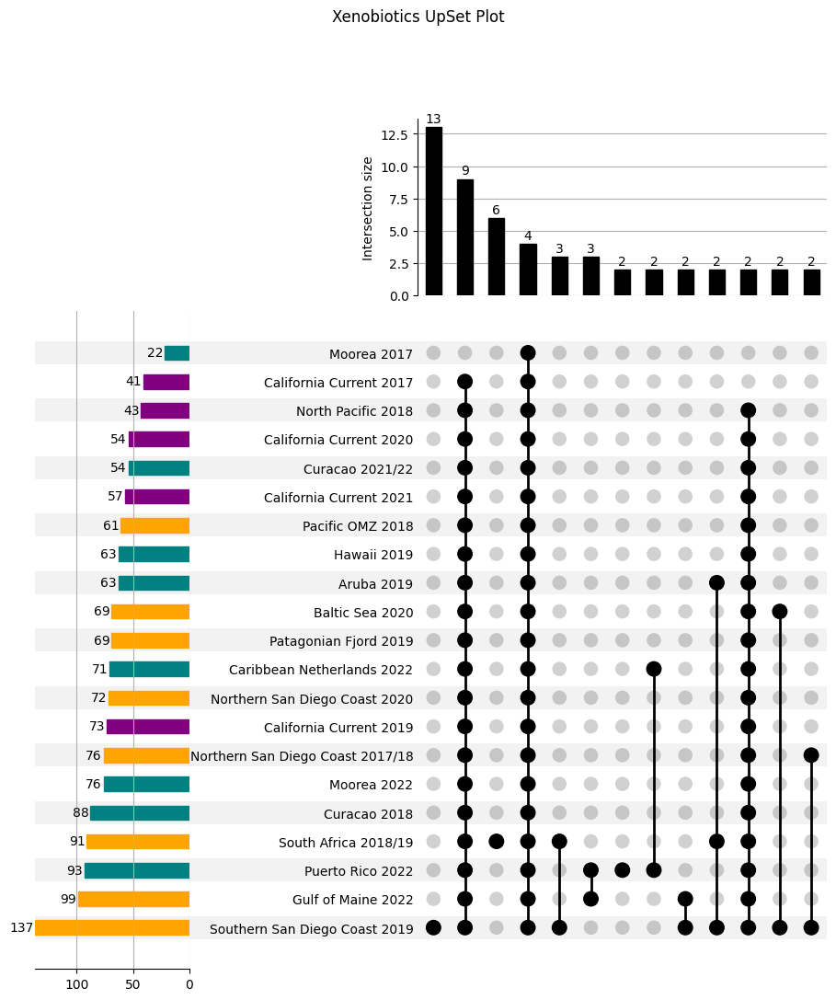

In [12]:
import matplotlib.pyplot as plt
from upsetplot import UpSet

# Assuming multi_index_df is your DataFrame
upset = UpSet(
    multi_index_df,
    show_counts=True,
    sort_by="cardinality",
    min_subset_size=2,
    totals_plot_elements=5
)

upset.style_categories(
    ["Moorea 2017", 'Aruba 2019', "Hawaii 2019", 'Caribbean Netherlands 2022', 'Curacao 2018', 'Curacao 2021/22', 'Moorea 2017','Moorea 2022','Puerto Rico 2022'], bar_facecolor="teal"
)

upset.style_categories(
    ['Baltic Sea 2020', 'Gulf of Maine 2022','Northern San Diego Coast 2017/18','Northern San Diego Coast 2020','Pacific OMZ 2018', 'Patagonian Fjord 2019','South Africa 2018/19','Southern San Diego Coast 2019'], bar_facecolor="orange"
)

upset.style_categories(
    ['California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'North Pacific 2018'], bar_facecolor="purple"
)

# Plot
upset.plot()

# Add a title
plt.suptitle("Xenobiotics UpSet Plot")

# Save the plot as SVG
plt.savefig("xenobiotics_upset_plot.svg", format='svg')

# Show the plot
plt.show()


In [13]:
import pandas as pd

# Load the dataframe from the CSV file
df = pd.read_csv('preabs_Cleaned05_allfeatures_grouped.csv')

# Set the 'name' column as the index
df.set_index('row ID', inplace=True)

# Convert the DataFrame to boolean values
df = df.astype(bool)

# Create a MultiIndex from the DataFrame
multi_index_df2 = df.reset_index().set_index(list(df.columns))

# Print the DataFrame with MultiIndex
print(multi_index_df2)

                                                                                                                                                                                                                                                                                                                                                                                                                                        row ID
Aruba 2019 Baltic Sea 2020 California Current 2017 California Current 2019 California Current 2020 California Current 2021 Caribbean Netherlands 2022 Curacao 2018 Curacao 2021/22 Gulf of Maine 2022 Hawaii 2019 Moorea 2017 Moorea 2022 North Pacific 2018 Northern San Diego Coast 2017/18 Northern San Diego Coast 2020 Pacific OMZ 2018 Patagonian Fjord 2019 Puerto Rico 2022 South Africa 2018/19 Southern San Diego Coast 2019        
False      True            False                   False                   False                   False                   False          

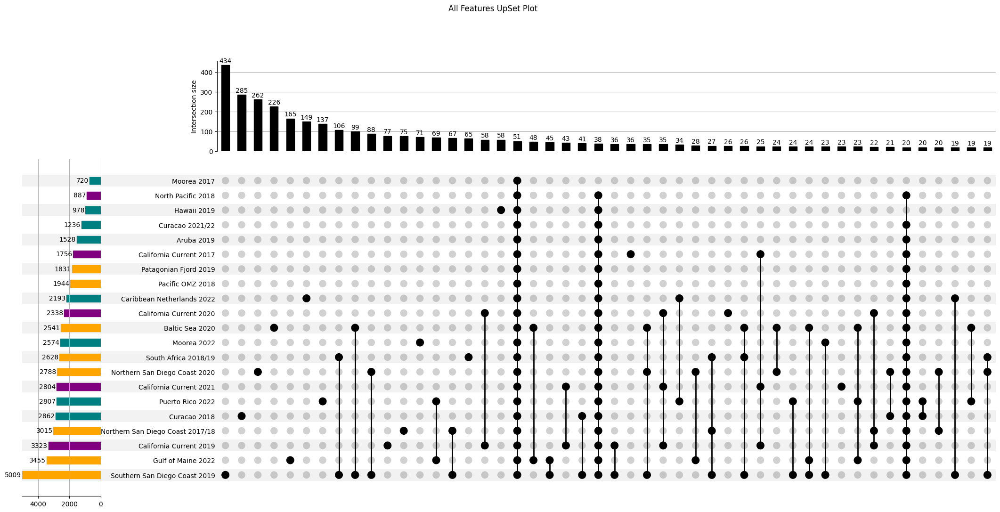

In [14]:
import matplotlib.pyplot as plt
from upsetplot import UpSet

# Assuming multi_index_df is your DataFrame
upset = UpSet(
    multi_index_df2,
    show_counts=True,
    sort_by="cardinality",
    min_subset_size=19,
    totals_plot_elements=5
)

upset.style_categories(
    ["Moorea 2017", 'Aruba 2019', "Hawaii 2019", 'Caribbean Netherlands 2022', 'Curacao 2018', 'Curacao 2021/22', 'Moorea 2017','Moorea 2022','Puerto Rico 2022'], bar_facecolor="teal"
)

upset.style_categories(
    ['Baltic Sea 2020', 'Gulf of Maine 2022','Northern San Diego Coast 2017/18','Northern San Diego Coast 2020','Pacific OMZ 2018', 'Patagonian Fjord 2019','South Africa 2018/19','Southern San Diego Coast 2019'], bar_facecolor="orange"
)

upset.style_categories(
    ['California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'North Pacific 2018'], bar_facecolor="purple"
)

# Plot
upset.plot()

# Add a title
plt.suptitle("All Features UpSet Plot")

# Save the plot as SVG
plt.savefig("AllFeatures_upset_plot.svg", format='svg')

# Show the plot
plt.show()


# 5.Frequency plot

/tmp/ipykernel_1145/4021273589.py:87: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


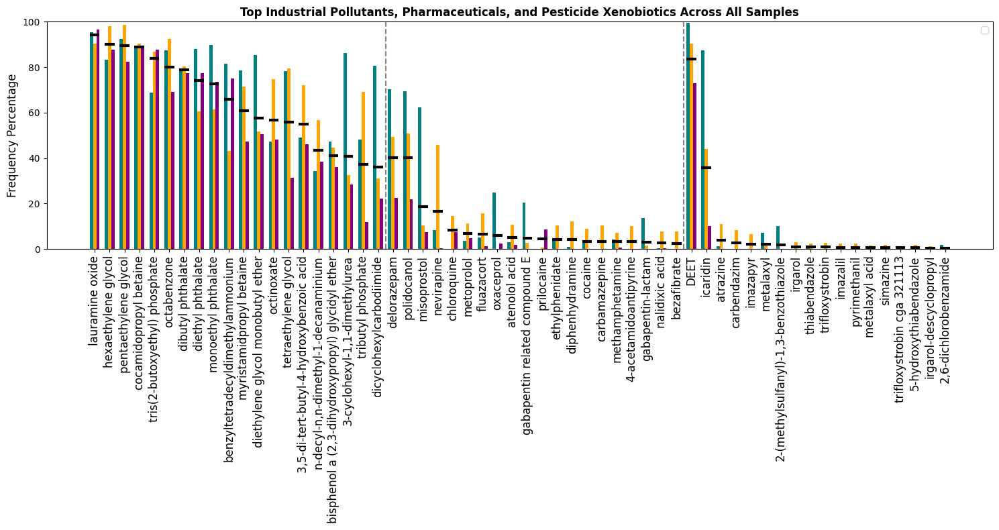

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data into a DataFrame
df = pd.read_csv('preabs_Cleaned05_xenobiotics.csv')

# Load the metadata
metadata = pd.read_csv('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Set the 'name' as the index
df.set_index('name', inplace=True)

# Separate the 'Type' column from the numerical data
types = df['Type']
df = df.drop(columns=['Type'])

# Filter metadata to include only samples present in df
metadata = metadata[metadata['filename'].isin(df.columns)]

# Calculate the frequency of presence (1s) for each feature
frequency = df.sum(axis=1)

# Calculate the total number of samples
total_samples = df.shape[1]

# Convert frequency to percentage
frequency_percentage = (frequency / total_samples) * 100

# Add frequency percentage and 'Type' back to the DataFrame
df['frequency_percentage'] = frequency_percentage
df['Type'] = types

# Filter the DataFrame by 'Type'
urban_df = df[df['Type'] == 'urban']
drug_df = df[df['Type'] == 'drug']
pesticide_df = df[df['Type'] == 'pesticide']

# Sort each type by frequency percentage in descending order and select top features
top_20_urban = urban_df.sort_values(by='frequency_percentage', ascending=False).head(20)
top_20_drug = drug_df.sort_values(by='frequency_percentage', ascending=False).head(20)
top_18_pesticide = pesticide_df.sort_values(by='frequency_percentage', ascending=False).head(18)

# Concatenate the top features into a single DataFrame
top_features = pd.concat([top_20_urban, top_20_drug, top_18_pesticide])

# Initialize a dictionary to store subgroup frequencies
subgroup_frequencies = {'Coral Reef': [], 'Coastal': [], 'Open Ocean': []}

# Calculate subgroup frequencies for each feature
for feature in top_features.index:
    for subgroup in subgroup_frequencies.keys():
        # Get samples belonging to the current subgroup
        subgroup_samples = metadata[metadata['ATTRIBUTE_ecosystem'] == subgroup]['filename']
        # Calculate the frequency of presence for the current subgroup
        subgroup_frequency = df.loc[feature, subgroup_samples].sum()
        # Convert to percentage
        subgroup_frequency_percentage = (subgroup_frequency / len(subgroup_samples)) * 100
        # Store the result
        subgroup_frequencies[subgroup].append(subgroup_frequency_percentage)

# Plot the frequency percentage of the top features with subgroups
plt.figure(figsize=(15, 8))

bar_width = 0.22  # Width of each subgroup bar (reduced by 20%)
master_bar_width = bar_width * 3  # Width of master bar

for i, feature in enumerate(top_features.index):
    # Plot the horizontal line at the maximum value of the master bar in black
    plt.hlines(y=top_features.loc[feature, 'frequency_percentage'], xmin=i - master_bar_width/2, xmax=i + master_bar_width/2, colors='black', linewidth=3)

    # Plot the subgroup bars with reduced width and touching each other within the master bar width
    plt.bar(i - bar_width, subgroup_frequencies['Coral Reef'][i], color='teal', width=bar_width)  # Darker blue
    plt.bar(i, subgroup_frequencies['Coastal'][i], color='orange', width=bar_width)
    plt.bar(i + bar_width, subgroup_frequencies['Open Ocean'][i], color='purple', width=bar_width)  # Brighter green

# Add vertical dashed lines between groups 'urban', 'drug', and 'pesticide'
urban_end_index = len(top_20_urban) - 0.5
drug_end_index = len(top_20_urban) + len(top_20_drug) - 0.5

plt.axvline(x=urban_end_index, color='gray', linestyle='--')
plt.axvline(x=drug_end_index, color='gray', linestyle='--')

plt.ylabel('Frequency Percentage', fontsize=12)
plt.title('Top Industrial Pollutants, Pharmaceuticals, and Pesticide Xenobiotics Across All Samples', fontsize=12, fontweight='bold')
plt.xticks(range(len(top_features.index)), top_features.index, rotation=90, fontsize=12)  # Manually set font size here
plt.ylim(0, 100)
plt.legend()

# Reduce space between y-axis and leftmost bar graph as well as between right panel boundary and rightmost bar graph
plt.subplots_adjust(left=0.05, right=0.95)

# Ensure the plot is fully rendered before saving
plt.tight_layout()

# Save the plot as an SVG file
plt.savefig('FrequencyPlot_FBMNblnkrem1_samplepresencevsID_xeno_top_features_with_subgroups.svg', format='svg')

# Show the plot
plt.show()

# 6.Violin plots (scaled) for xenobiotics and types

In [16]:
import pandas as pd

# Load xenobiotic table
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Keep only the 'row ID' and 'Type' columns
df = df[['row ID', 'Type']]

# Split the 'row ID' column
df_split = df['row ID'].str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Add the 'Type' column back to the split DataFrame
df_split['Type'] = df['Type'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

print(df_split)


    row ID   Type
4    28717   drug
8    10211  urban
9    30192  urban
10     836  urban
10    6256  urban
..     ...    ...
215  39611  urban
216  22850  urban
217  31530  urban
218   7112  urban
219  31157   drug

[227 rows x 2 columns]


In [17]:
import pandas as pd

# Load the FT
ft_df = pd.read_csv('featuretable_reformated.csv')

#remove Peak area suffix
ft_df.columns = ft_df.columns.str.replace(' Peak area', '')

# Remove columns that don't have '.mz' or 'ID' in their header 
ft_filtered = ft_df.filter(regex='(.mz|row ID)')

# Convert 'row ID' columns to the same type
ft_filtered['row ID'] = ft_filtered['row ID'].astype(str)
df_split['row ID'] = df_split['row ID'].astype(str)

# Merge DataFrames on 'row ID'
merged_df = pd.merge(ft_filtered, df_split, on='row ID', how='right')

# Save the filtered result to a new CSV file
merged_df.to_csv('xenobiotics_withblanks.csv', index=False)

print("The filtered feature table has been saved to 'filtered_featuretable.csv'.")


The filtered feature table has been saved to 'filtered_featuretable.csv'.


/tmp/ipykernel_1145/3007386588.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ft_filtered['row ID'] = ft_filtered['row ID'].astype(str)


In [18]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Separate the 'row ID' and 'Type' columns 
id_type_df = merged_df[['row ID', 'Type']]

# Filter columns containing ".mz"
df = merged_df.filter(regex=".mz")

# Scale the features (rows)
scaled_features = scaler.fit_transform(df.T).T

# Create a new DataFrame with the scaled features
scaled_df = pd.DataFrame(scaled_features, index=df.index, columns=df.columns)

# Add the 'row ID' and 'Type' columns back to the scaled DataFrame 
final_df = pd.concat([id_type_df, scaled_df], axis=1)

# Save the final DataFrame to a new file with suffix '_Scaled'
final_df.to_csv('xenobiotics_withblanks_scaled.csv', index=False)


/tmp/ipykernel_1145/3791854992.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/3791854992.py:59: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


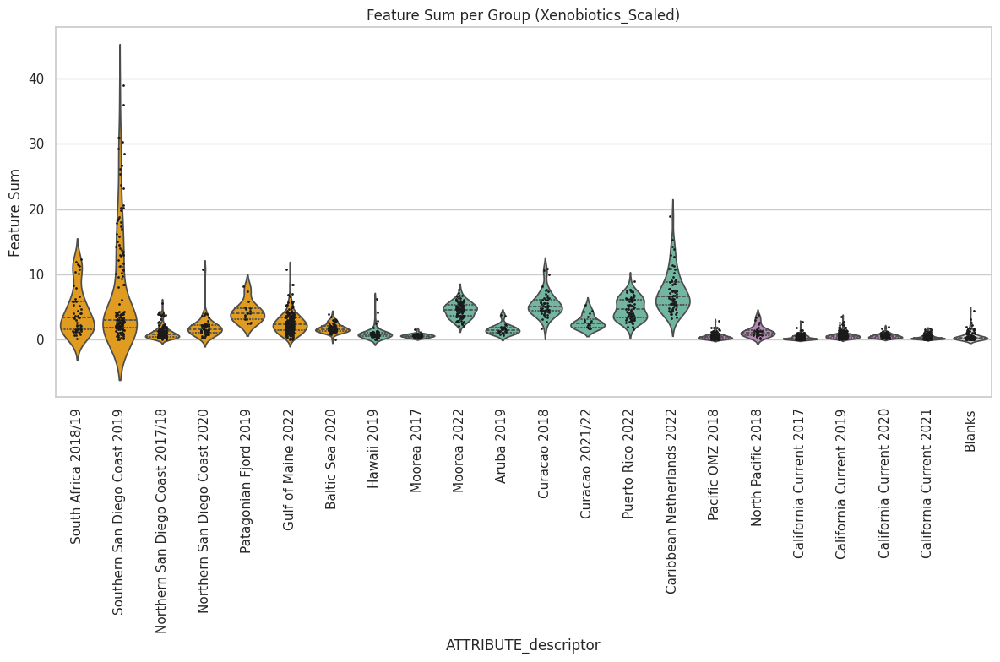

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to descriptor
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Feature Sum per Group (Xenobiotics_Scaled)')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Xenobiotics_Scaled_violinplot.svg')
plt.show()

/tmp/ipykernel_1145/2832067200.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2832067200.py:61: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


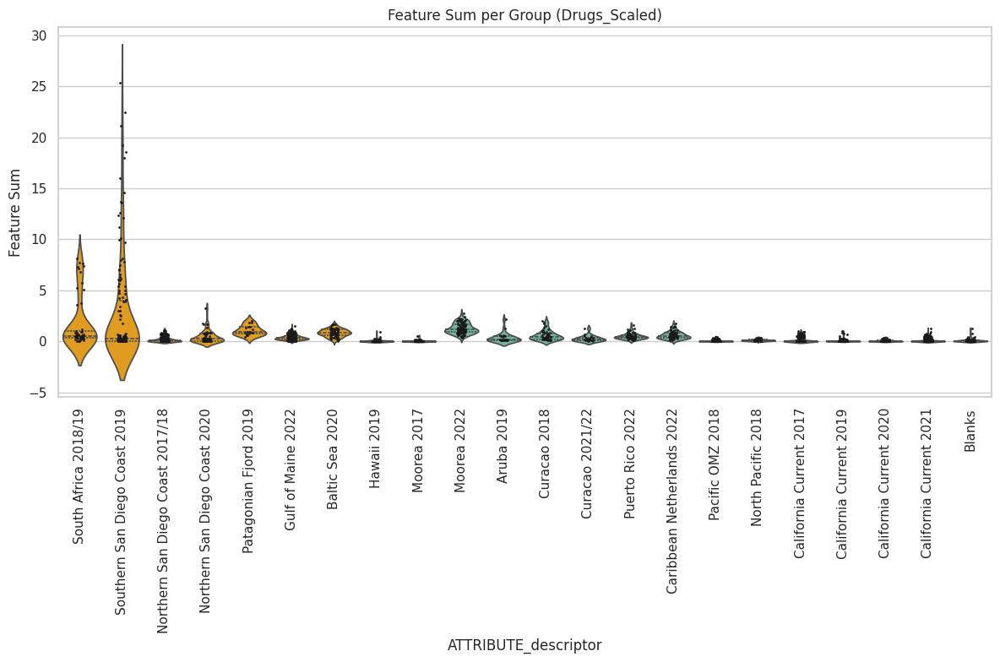

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

df = df[df['Type'] == 'drug']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to descriptor
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Feature Sum per Group (Drugs_Scaled)')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Drugs_Scaled_violinplot.svg')
plt.show()

/tmp/ipykernel_1145/178507272.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/178507272.py:61: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


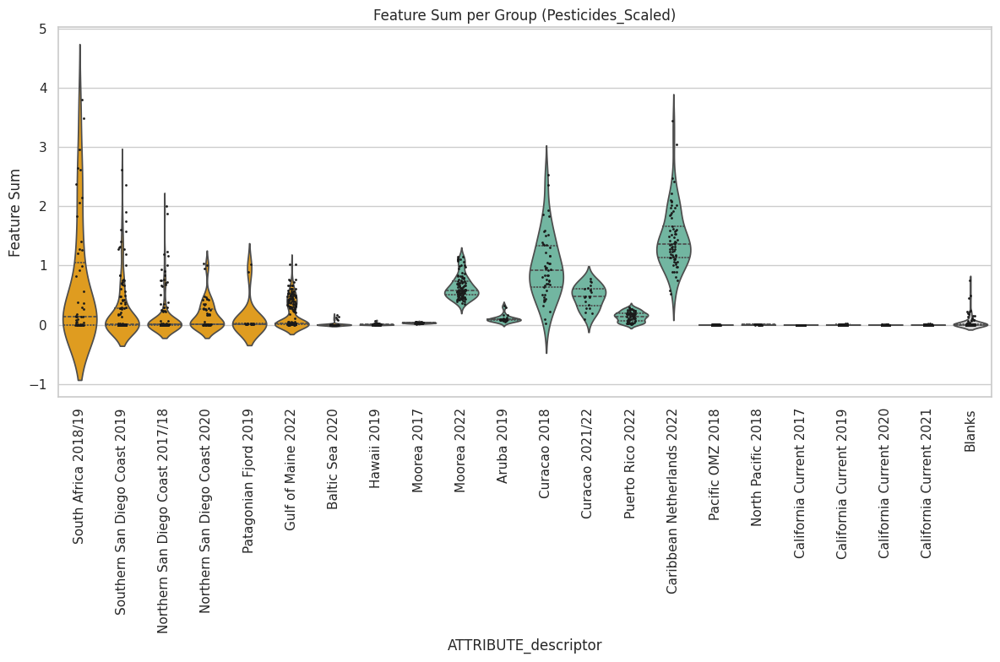

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

df = df[df['Type'] == 'pesticide']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to descriptor
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Feature Sum per Group (Pesticides_Scaled)')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Pesticides_Scaled_violinplot.svg')
plt.show()

/tmp/ipykernel_1145/2056816223.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2056816223.py:61: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


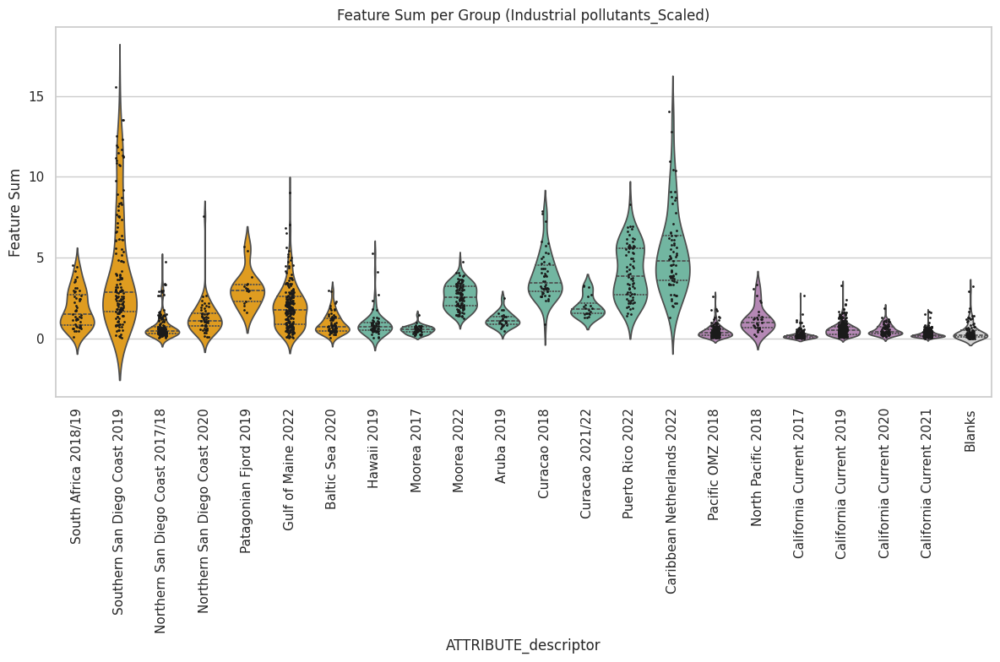

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks_scaled.csv', index_col='row ID')

df = df[df['Type'] == 'urban']

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows
df['feature sum'] = df.sum(axis=1)

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Merge with metadata according to descriptor
df_merged = df.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Sort the DataFrame based on the desired order
df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_merged,
    x='ATTRIBUTE_descriptor',
    y='feature sum',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Feature Sum per Group (Industrial pollutants_Scaled)')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Feature Sum')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('IndustrialPollutants_Scaled_violinplot.svg')
plt.show()

# 7.Violin plots (scaled) for classes (for MN figure)

In [23]:
import pandas as pd

# Load xenobiotic table
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Keep only the 'row ID' and 'Type' columns
df = df[['row ID', 'Class']]

# Split the 'row ID' column
df_split = df['row ID'].str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Add the 'Type' and 'Class' columns back to the split DataFrame
df_split['Class'] = df['Class'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

print(df_split)


    row ID            Class
4    28717     chlorophenyl
8    10211        guanidino
9    30192        guanidino
10     836        guanidino
10    6256        guanidino
..     ...              ...
215  39611  organophosphate
216  22850  organophosphate
217  31530  organophosphate
218   7112           glycol
219  31157         tetrazol

[227 rows x 2 columns]


In [24]:
import pandas as pd

# Load the FT
ft_df = pd.read_csv('featuretable_reformated.csv')

#remove Peak area suffix
ft_df.columns = ft_df.columns.str.replace(' Peak area', '')

# Remove columns that don't have '.mz' or 'ID' in their header 
ft_filtered = ft_df.filter(regex='(.mz|row ID)')

# Convert 'row ID' columns to the same type
ft_filtered['row ID'] = ft_filtered['row ID'].astype(str)
df_split['row ID'] = df_split['row ID'].astype(str)

# Merge DataFrames on 'row ID'
merged_df = pd.merge(ft_filtered, df_split, on='row ID', how='right')

# Save the filtered result to a new CSV file
merged_df.to_csv('xenobiotics_withblanks(class).csv', index=False)

print("The filtered feature table has been saved to 'filtered_featuretable.csv'.")


/tmp/ipykernel_1145/2022180328.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ft_filtered['row ID'] = ft_filtered['row ID'].astype(str)


The filtered feature table has been saved to 'filtered_featuretable.csv'.


In [25]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Separate the 'row ID' and 'Type' columns 
id_type_df = merged_df[['row ID', 'Class']]

# Filter columns containing ".mz"
df = merged_df.filter(regex=".mz")

# Scale the features (rows)
scaled_features = scaler.fit_transform(df.T).T

# Create a new DataFrame with the scaled features
scaled_df = pd.DataFrame(scaled_features, index=df.index, columns=df.columns)

# Add the 'row ID' and 'Type' columns back to the scaled DataFrame 
final_df = pd.concat([id_type_df, scaled_df], axis=1)

# Save the final DataFrame to a new file with suffix '_Scaled'
final_df.to_csv('xenobiotics_withblanks(class)_scaled.csv', index=False)


/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


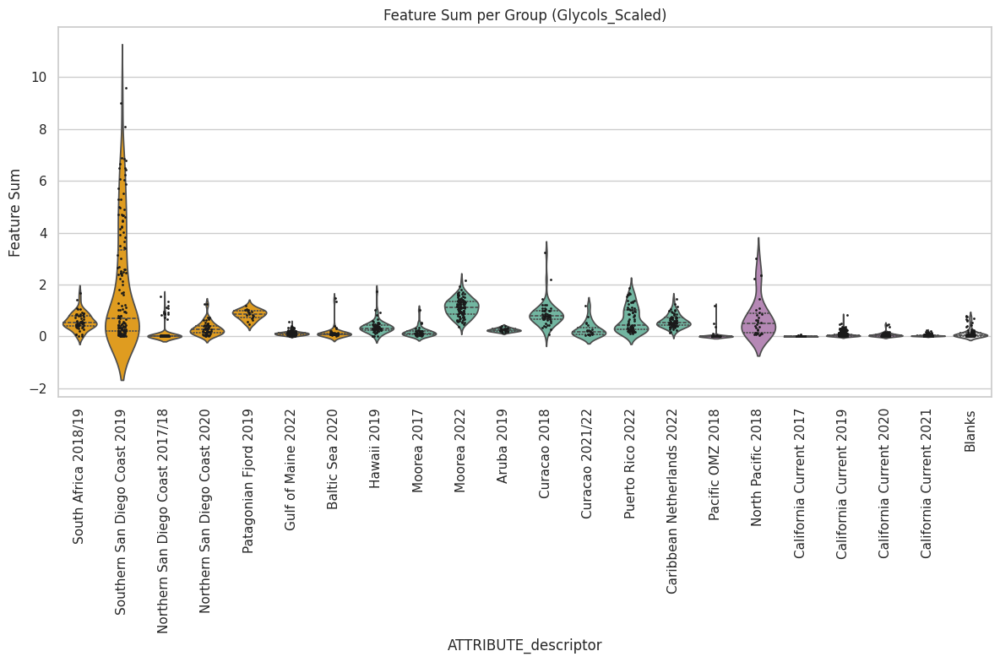

/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


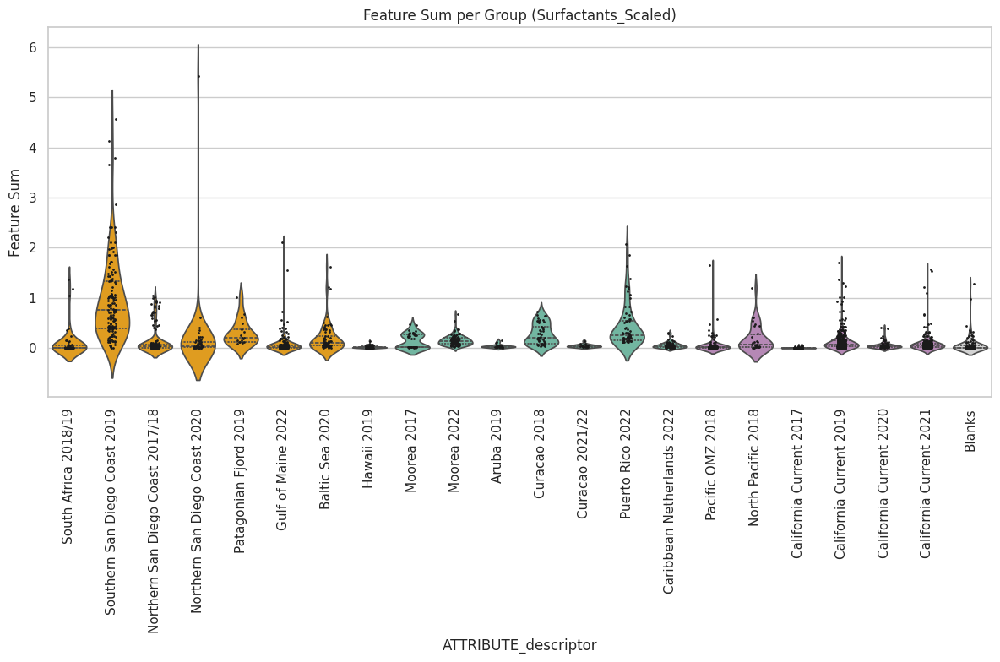

/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


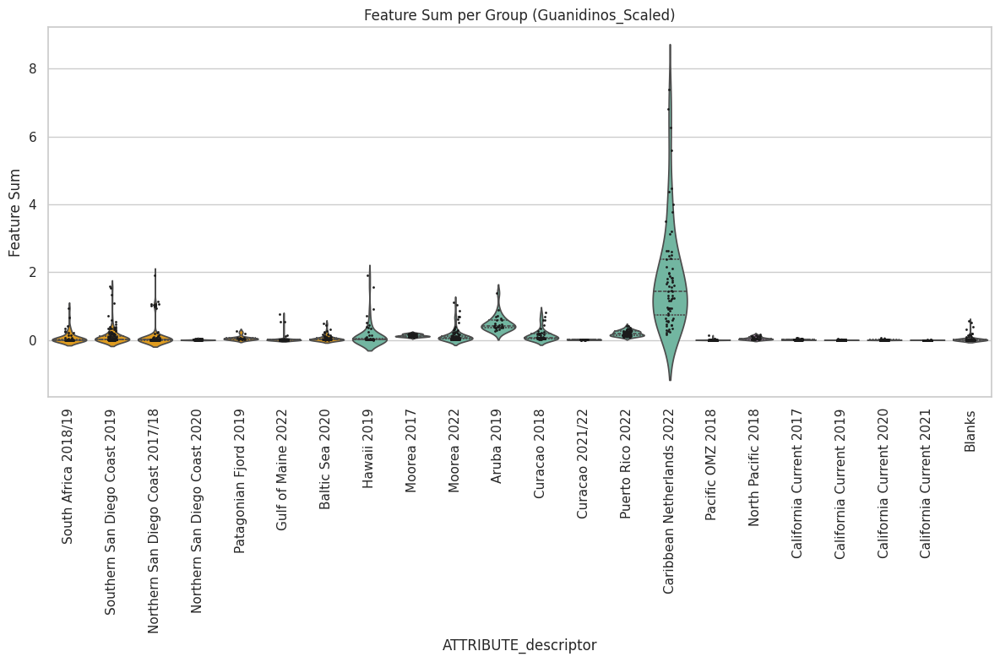

/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


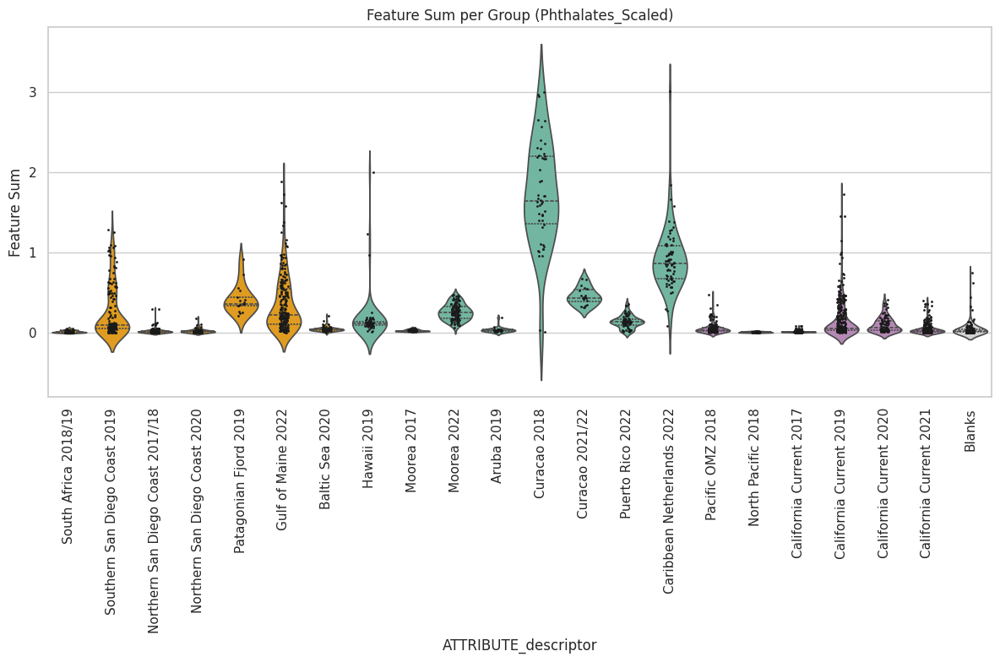

/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


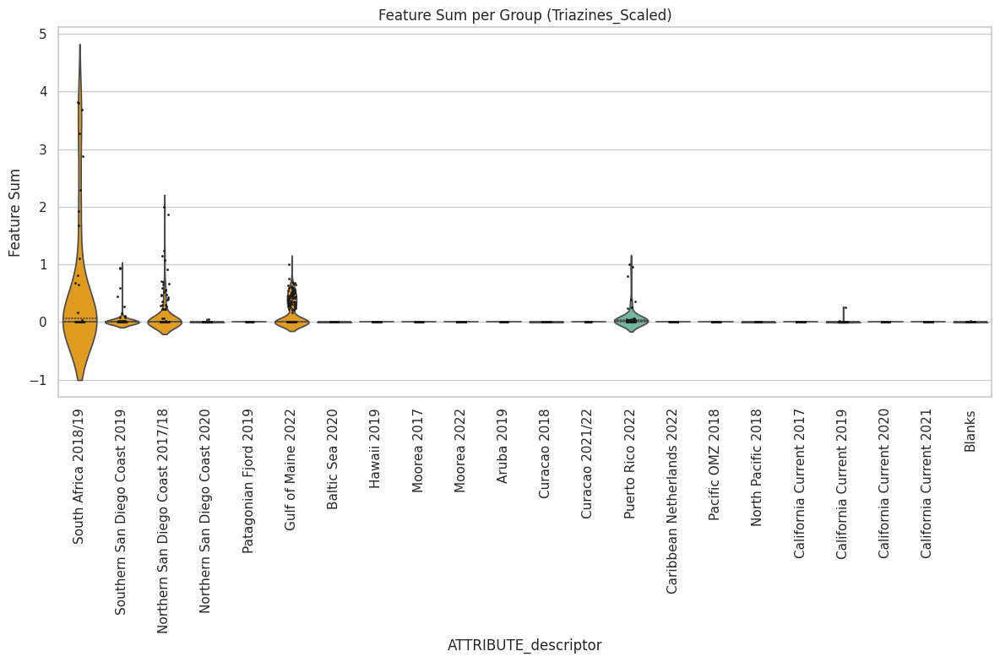

/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


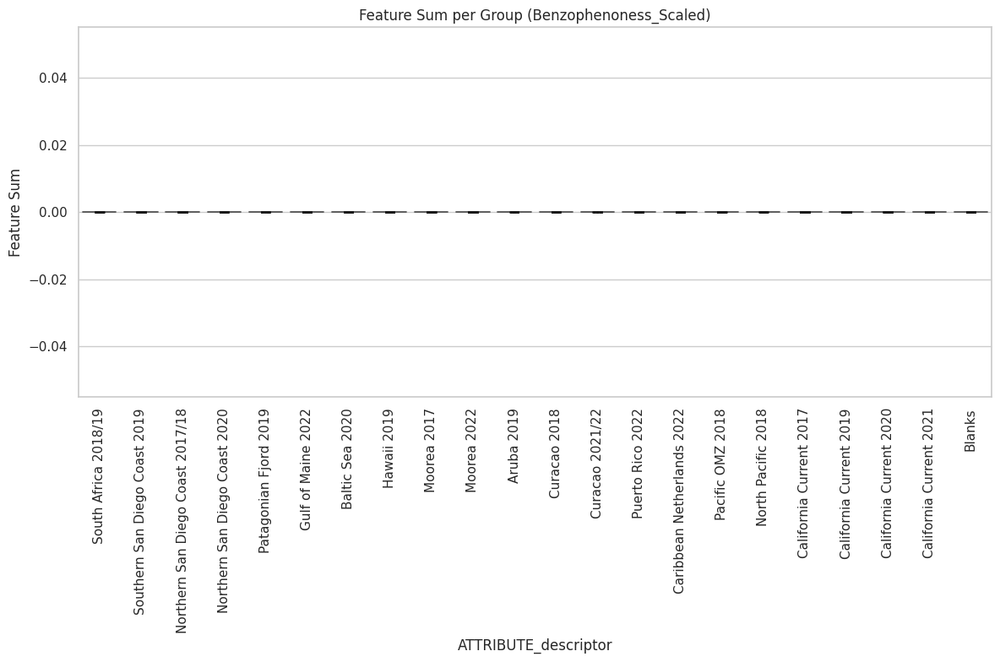

/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


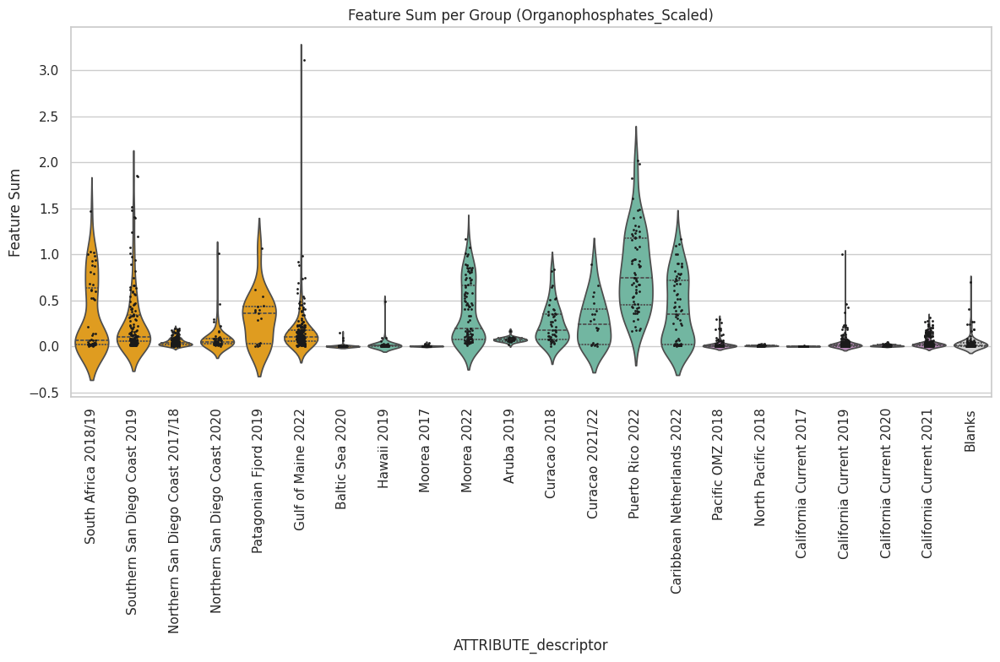

/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/2132579152.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


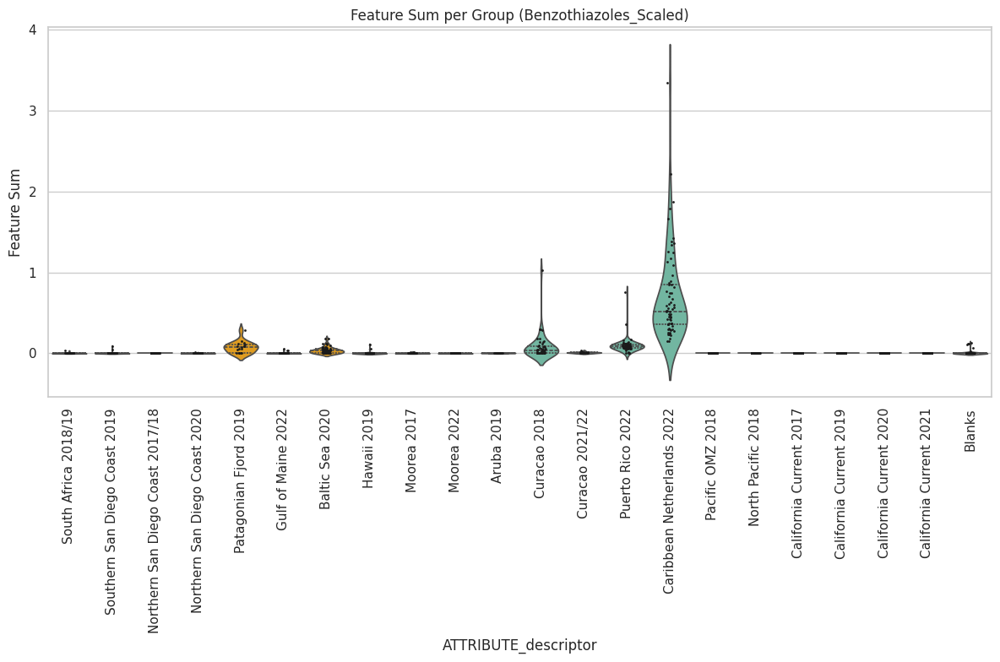

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics_withblanks(class)_scaled.csv', index_col='row ID')

# List of classes to iterate over
classes = ['glycol', 'surfactant', 'guanidino', 'phthalate', 'triazine', 'benzophenones', 'organophosphate', 'benzothiazole']

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

for class_name in classes:
    # Filter the DataFrame for the current class
    df_class = df[df['Class'] == class_name]

    # Filter columns containing ".mz"
    df_class = df_class.filter(regex=".mz")

    # Transpose the DataFrame so that sample names are the index
    df_class = df_class.transpose()

    # Sum all rows
    df_class['feature sum'] = df_class.sum(axis=1)

    # Merge with metadata according to descriptor
    df_merged = df_class.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

    # Sort the DataFrame based on the desired order
    df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
    df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

    # Plot violin plot
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    ax = sns.violinplot(
        data=df_merged,
        x='ATTRIBUTE_descriptor',
        y='feature sum',
        inner='quartile',  # Show quartiles inside the violin
        palette=custom_palette,
        scale='width'  # Normalize the width of the violins
    )
    sns.stripplot(
        data=df_merged,
        x='ATTRIBUTE_descriptor',
        y='feature sum',
        color='k',
        size=2,  # Adjust size if needed
        jitter=True,  # Add jitter to prevent overlapping
        ax=ax
    )

    # Capitalize the first letter of the class name and add trailing "s" for plot title and file name
    class_name_capitalized = class_name.capitalize() + "s"

    plt.title(f'Feature Sum per Group ({class_name_capitalized}_Scaled)')
    plt.xlabel('ATTRIBUTE_descriptor')
    plt.ylabel('Feature Sum')
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Save the plot as SVG file
    plt.savefig(f'{class_name_capitalized}_Scaled_violinplot.svg')
    
    # Show the plot
    plt.show()


# 8.Percentage violins

In [27]:
import pandas as pd

# Load xenobiotic table
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Keep only the 'row ID' and 'Type' columns
df = df[['row ID', 'Type', 'Class']]

# Split the 'row ID' column
df_split = df['row ID'].str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Add the 'Type' column back to the split DataFrame
df_split['Type'] = df['Type'].values.repeat(df_split.groupby(level=0).size())
df_split['Class'] = df['Class'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

print(df_split)
df_split.to_csv('unique_xenobiotic_features.csv', index=False)


    row ID   Type            Class
4    28717   drug     chlorophenyl
8    10211  urban        guanidino
9    30192  urban        guanidino
10     836  urban        guanidino
10    6256  urban        guanidino
..     ...    ...              ...
215  39611  urban  organophosphate
216  22850  urban  organophosphate
217  31530  urban  organophosphate
218   7112  urban           glycol
219  31157   drug         tetrazol

[227 rows x 3 columns]


In [28]:
import pandas as pd

# Load xenobiotic table
df = pd.read_csv('gnpsmergedtable05_tagged_filtered_merged.csv')

# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Drop unknown classifications
df = df[df['name'] != 'DEET']

# Keep only the 'row ID' and 'Type' columns
df = df[['row ID', 'Type', 'Class']]

# Split the 'row ID' column
df_split = df['row ID'].str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Add the 'Type' column back to the split DataFrame
df_split['Type'] = df['Type'].values.repeat(df_split.groupby(level=0).size())
df_split['Class'] = df['Class'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

print(df_split)
df_split.to_csv('unique_xenobiotic_features_noDEET.csv', index=False)


    row ID   Type            Class
4    28717   drug     chlorophenyl
8    10211  urban        guanidino
9    30192  urban        guanidino
10     836  urban        guanidino
10    6256  urban        guanidino
..     ...    ...              ...
215  39611  urban  organophosphate
216  22850  urban  organophosphate
217  31530  urban  organophosphate
218   7112  urban           glycol
219  31157   drug         tetrazol

[224 rows x 3 columns]


/tmp/ipykernel_1145/3550419126.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/3550419126.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/3550419126.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

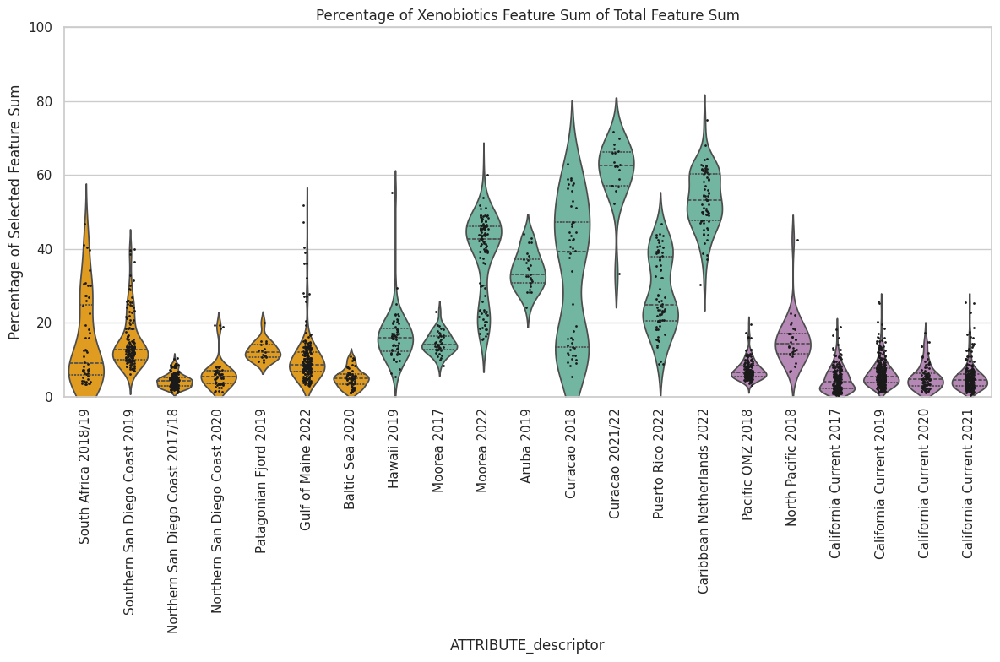

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_xenobiotic_features.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics.csv', index=False)

/tmp/ipykernel_1145/268697611.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/268697611.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/268697611.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

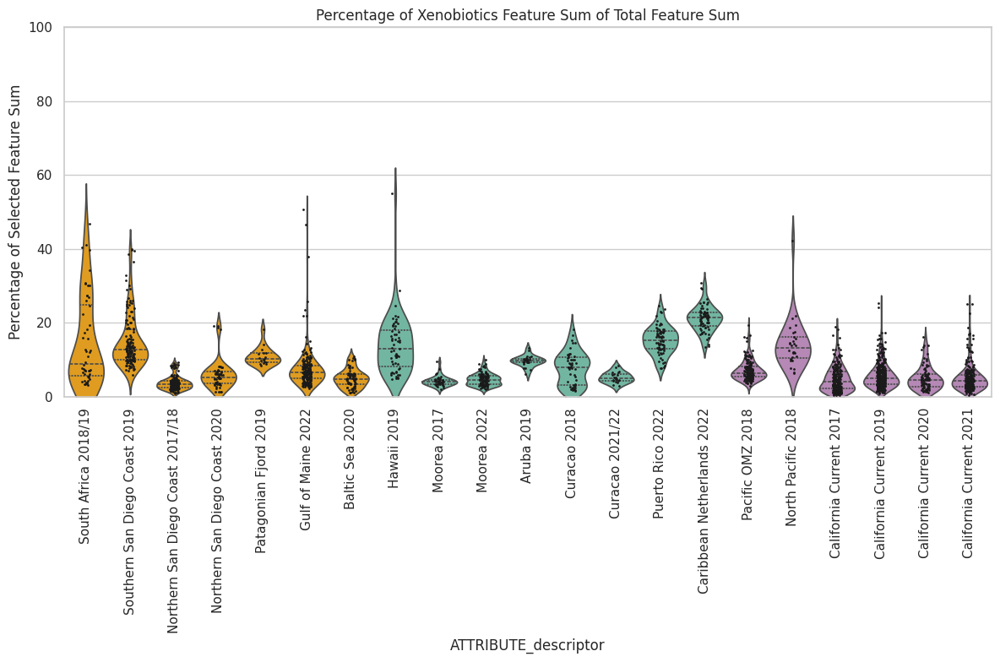

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics_noDEET.csv', index=False)

/tmp/ipykernel_1145/769859810.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/769859810.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/769859810.py:84: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

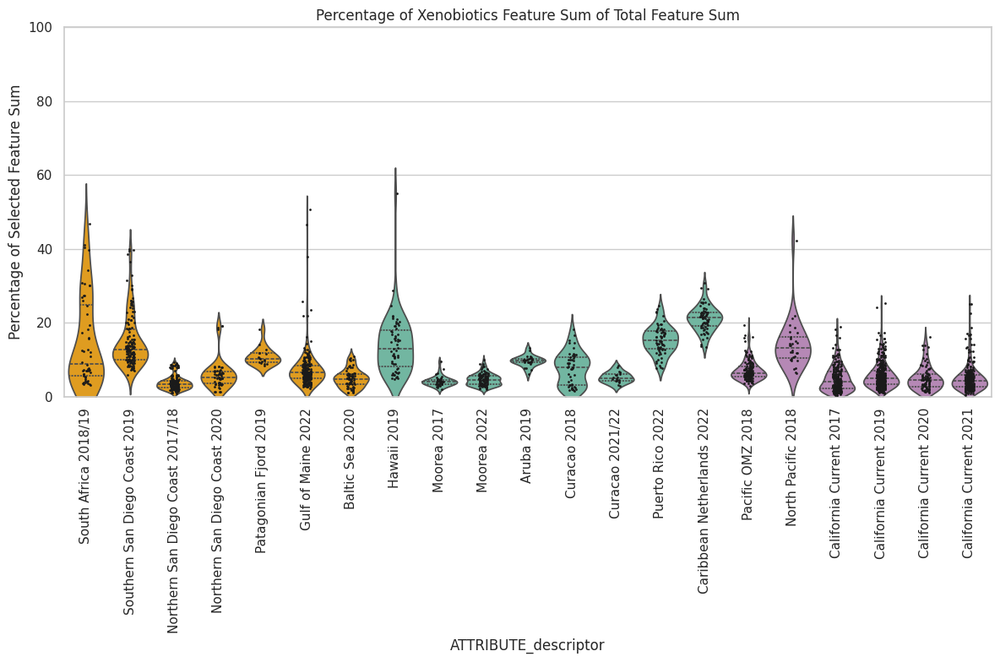

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Calculate the median and mean for each ATTRIBUTE_descriptor
median_values = df_final.groupby('ATTRIBUTE_descriptor')['percentage'].median().reset_index()
median_values.rename(columns={'percentage': 'median_percentage'}, inplace=True)

mean_values = df_final.groupby('ATTRIBUTE_descriptor')['percentage'].mean().reset_index()
mean_values.rename(columns={'percentage': 'mean_percentage'}, inplace=True)

# Merge the median and mean values with the final DataFrame
df_final = df_final.merge(median_values, on='ATTRIBUTE_descriptor')
df_final = df_final.merge(mean_values, on='ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics_noDEETmedian.csv', index=False)


/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

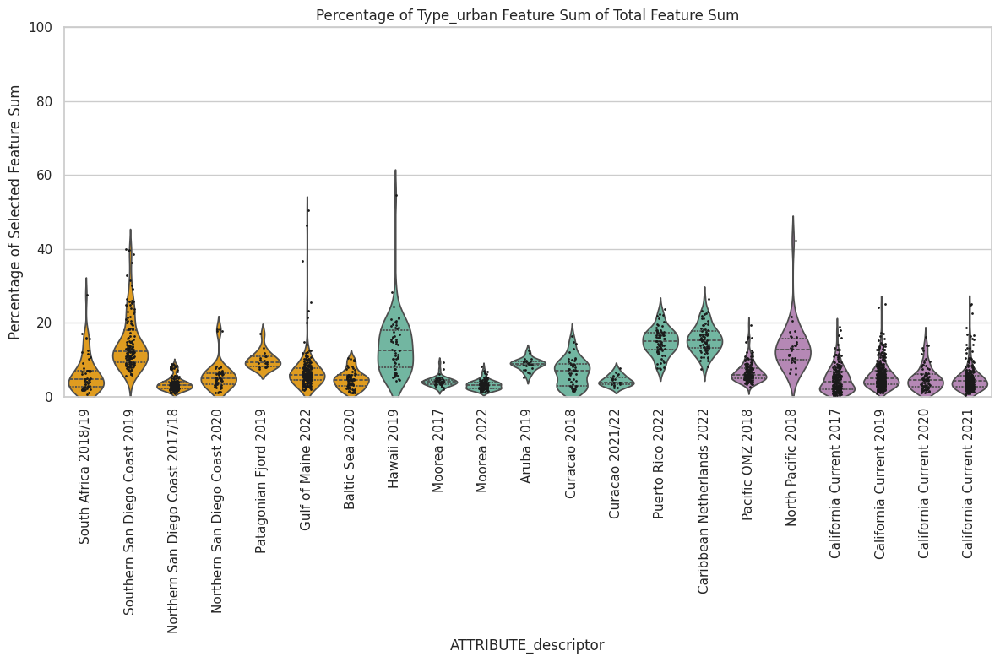

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

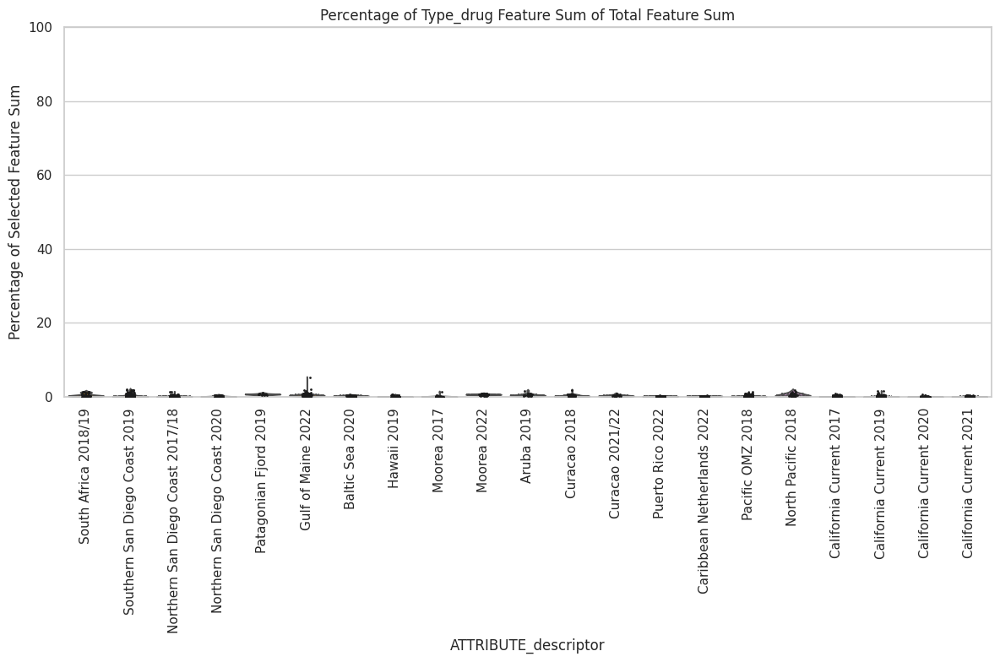

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

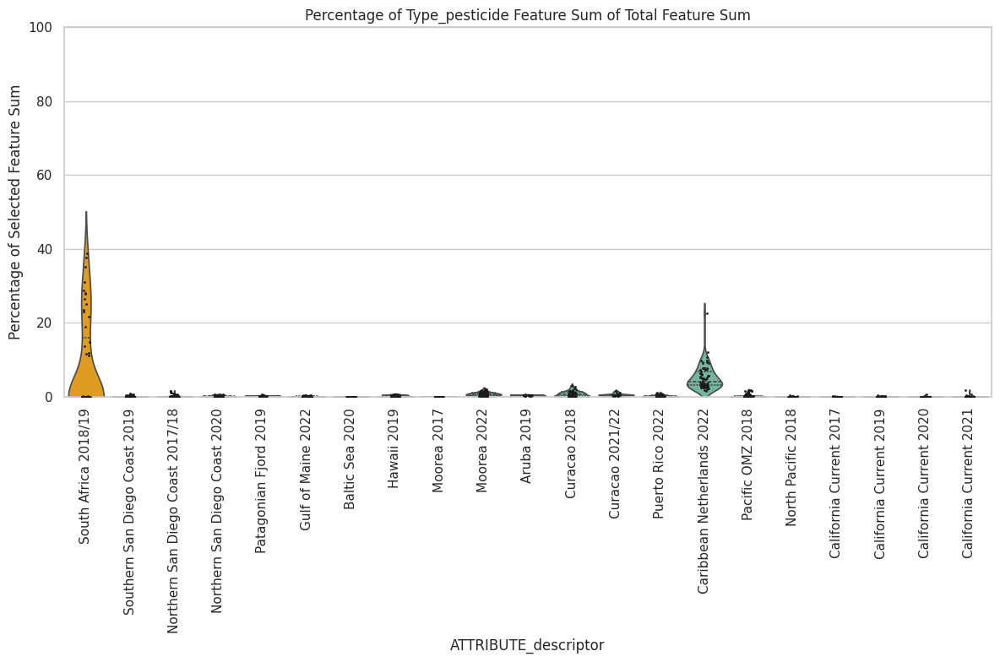

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

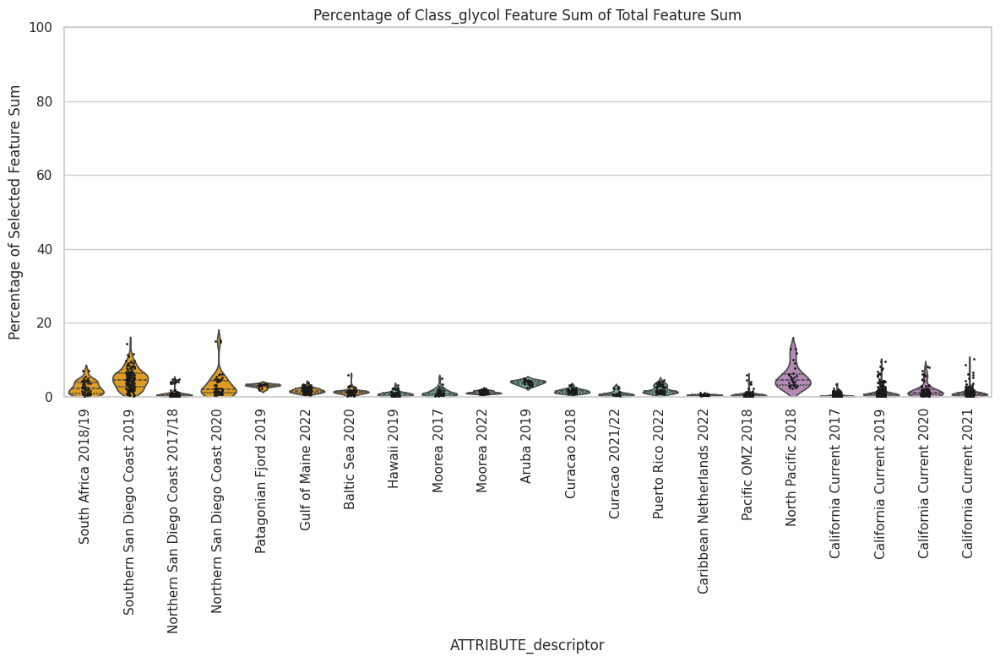

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

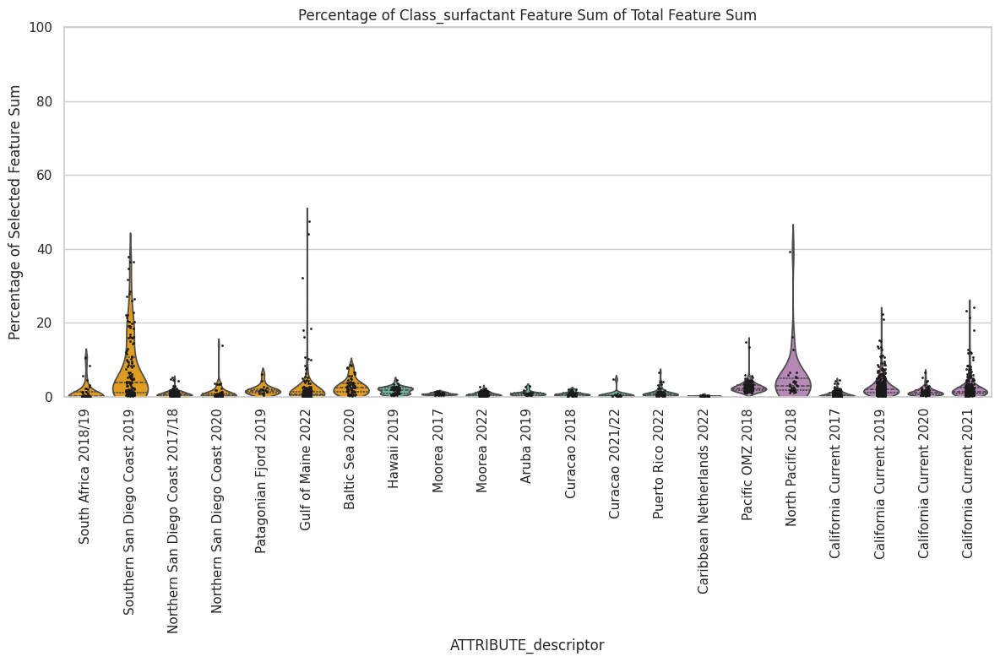

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

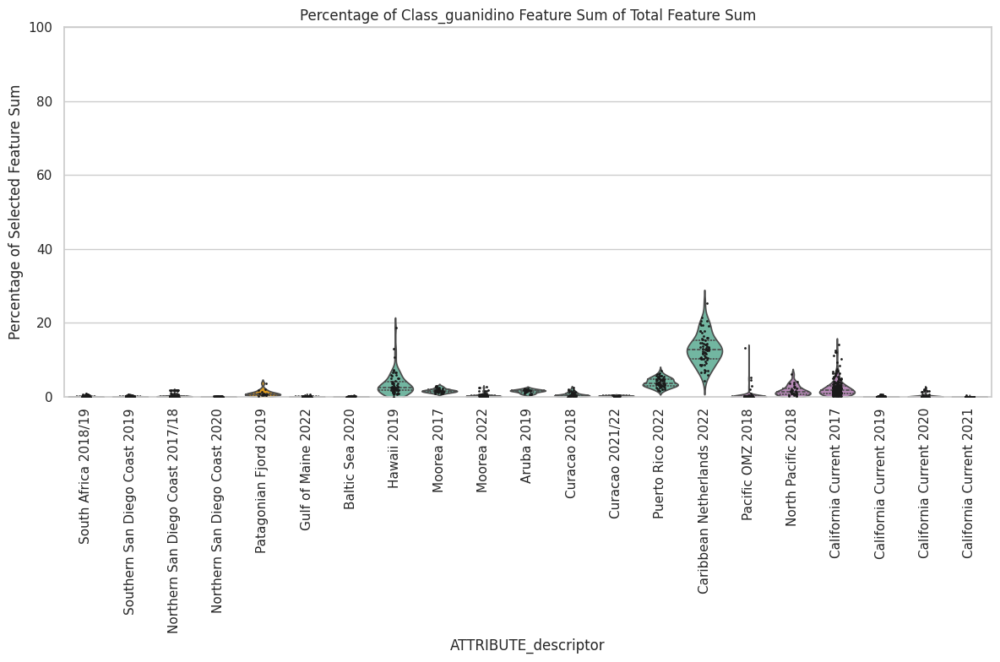

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

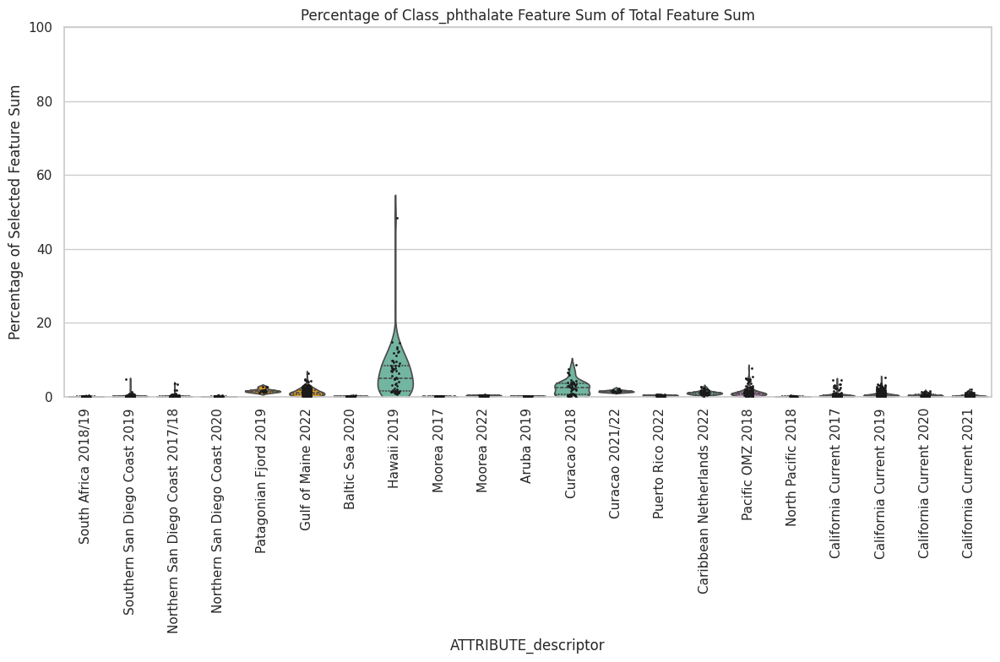

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

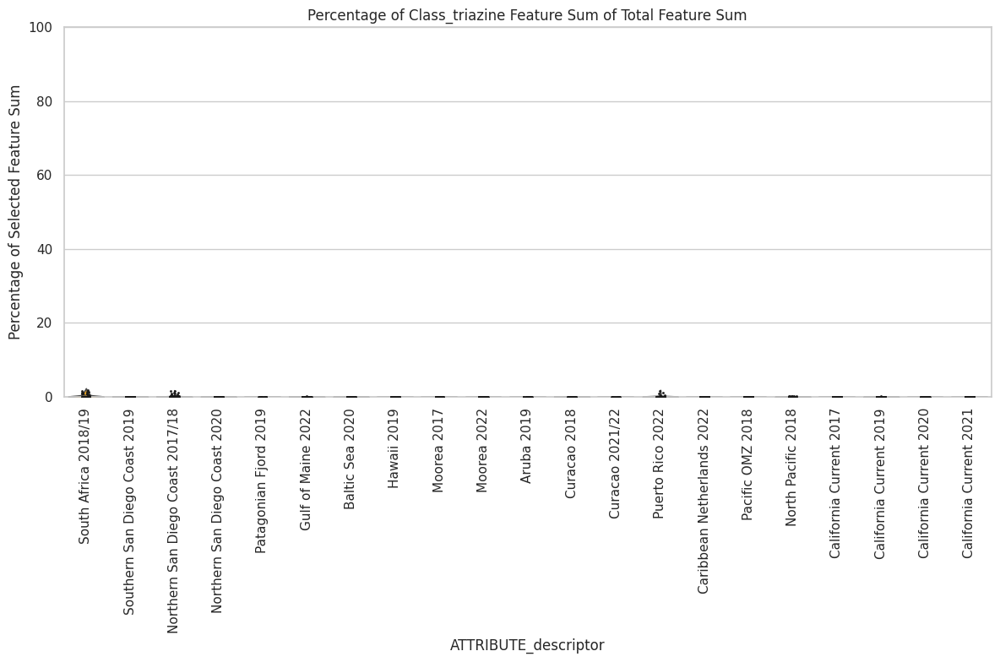

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

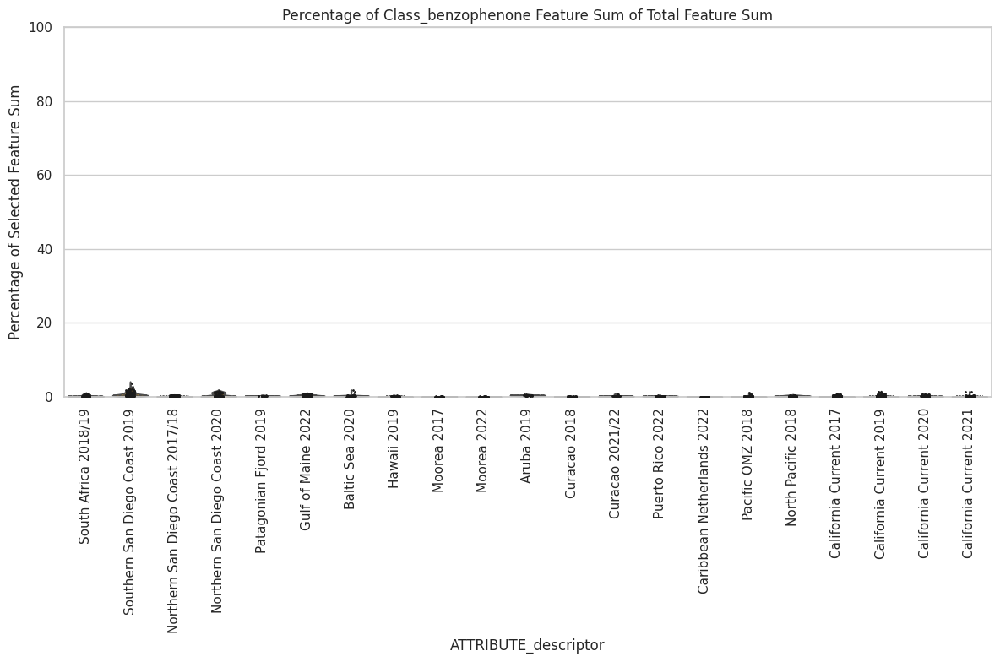

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

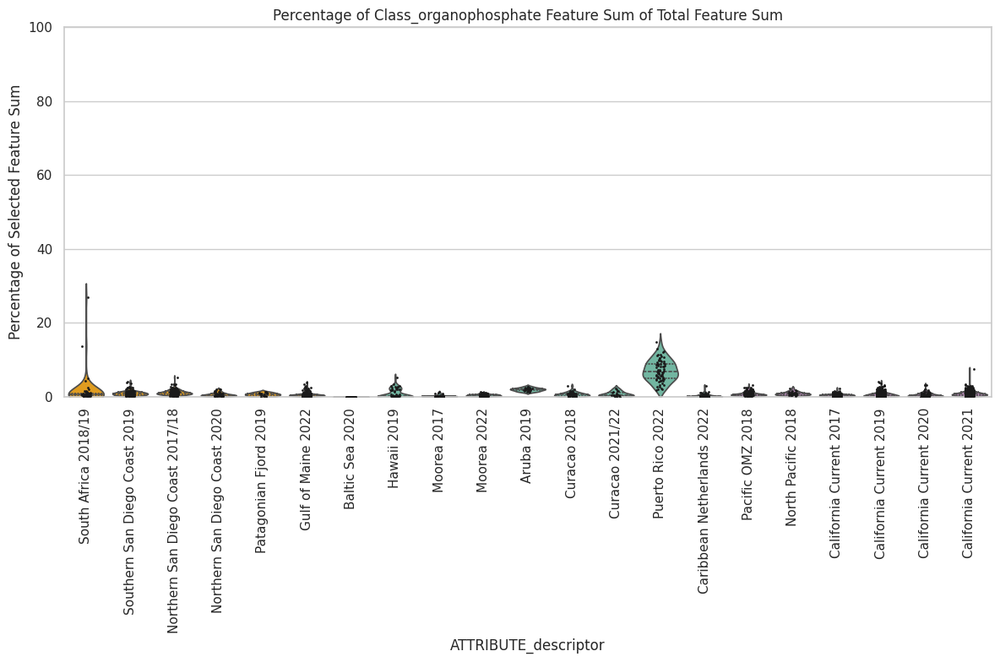

/tmp/ipykernel_1145/567087660.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/567087660.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/567087660.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

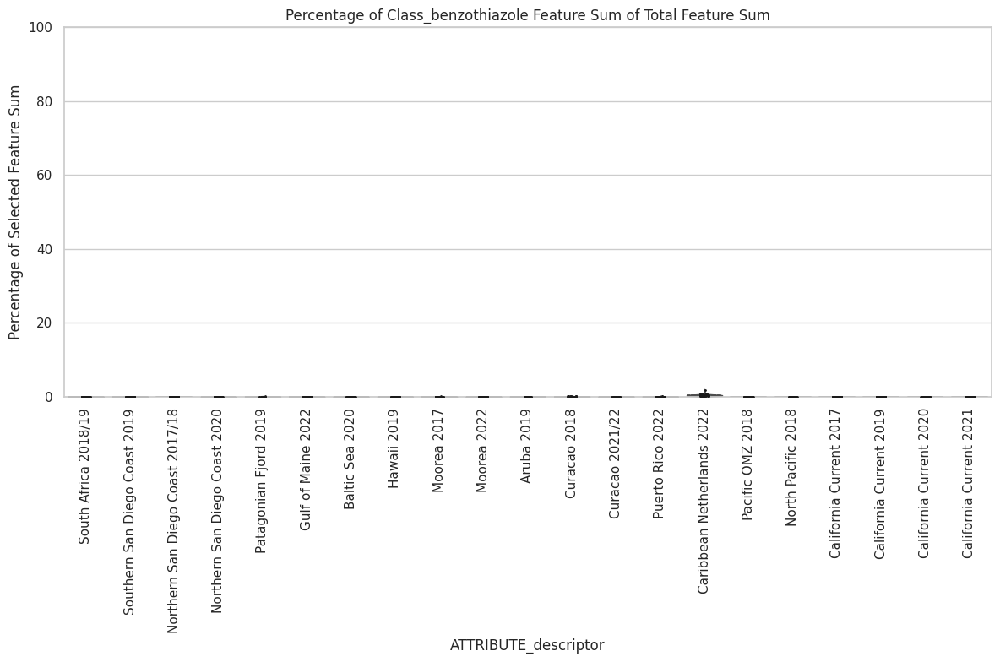

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load features of interest
df_featuresofinterest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Define subsets for Type and Class
subsets = {
    "Type_urban": df_featuresofinterest[df_featuresofinterest['Type'] == "urban"],
    "Type_drug": df_featuresofinterest[df_featuresofinterest['Type'] == "drug"],
    "Type_pesticide": df_featuresofinterest[df_featuresofinterest['Type'] == "pesticide"],
    "Class_glycol": df_featuresofinterest[df_featuresofinterest['Class'] == "glycol"],
    "Class_surfactant": df_featuresofinterest[df_featuresofinterest['Class'] == "surfactant"],
    "Class_guanidino": df_featuresofinterest[df_featuresofinterest['Class'] == "guanidino"],
    "Class_phthalate": df_featuresofinterest[df_featuresofinterest['Class'] == "phthalate"],
    "Class_triazine": df_featuresofinterest[df_featuresofinterest['Class'] == "triazine"],
    "Class_benzophenone": df_featuresofinterest[df_featuresofinterest['Class'] == "benzophenone"],
    "Class_organophosphate": df_featuresofinterest[df_featuresofinterest['Class'] == "organophosphate"],
    "Class_benzothiazole": df_featuresofinterest[df_featuresofinterest['Class'] == "benzothiazole"]
}

for subset_name, subset_df in subsets.items():
    
    # Filter the DataFrame to keep only the features of interest
    df_selected_features = df[subset_df['row ID']]
    
    # Sum the selected features per sample
    df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
    
    # Calculate the percentage of selected feature sum compared to total feature sum
    df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
    
    # Merge with metadata according to descriptor
    df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')
    
    # Sort the DataFrame based on the desired order
    df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
    df_final = df_final.sort_values('ATTRIBUTE_descriptor')
    
    # Plot violin plot
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    
    ax = sns.violinplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        inner='quartile',  
        palette=custom_palette,
        scale='width'  
    )
    
    sns.stripplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        color='k',
        size=2,  
        jitter=True,  
        ax=ax
    )
    
    plt.title(f'Percentage of {subset_name} Feature Sum of Total Feature Sum')
    plt.xlabel('ATTRIBUTE_descriptor')
    plt.ylabel('Percentage of Selected Feature Sum')
    plt.ylim(0, 100)
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Save plot and DataFrame to files
    plt.savefig(f'percentageplot_{subset_name}.svg')
    plt.show()
    
    df_final.to_csv(f'final_results_{subset_name}.csv', index=False)

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

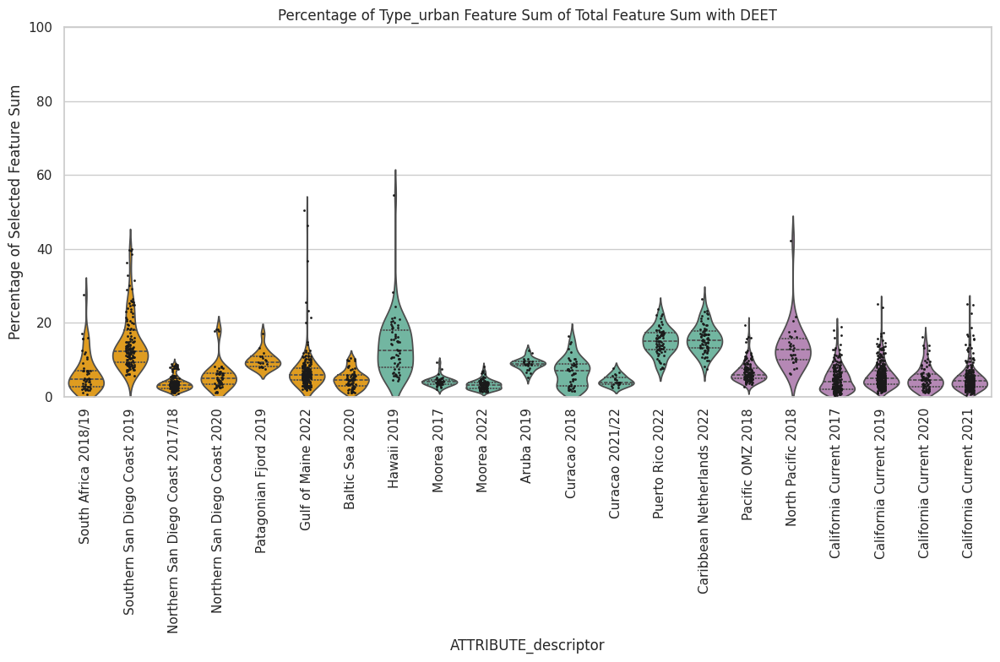

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

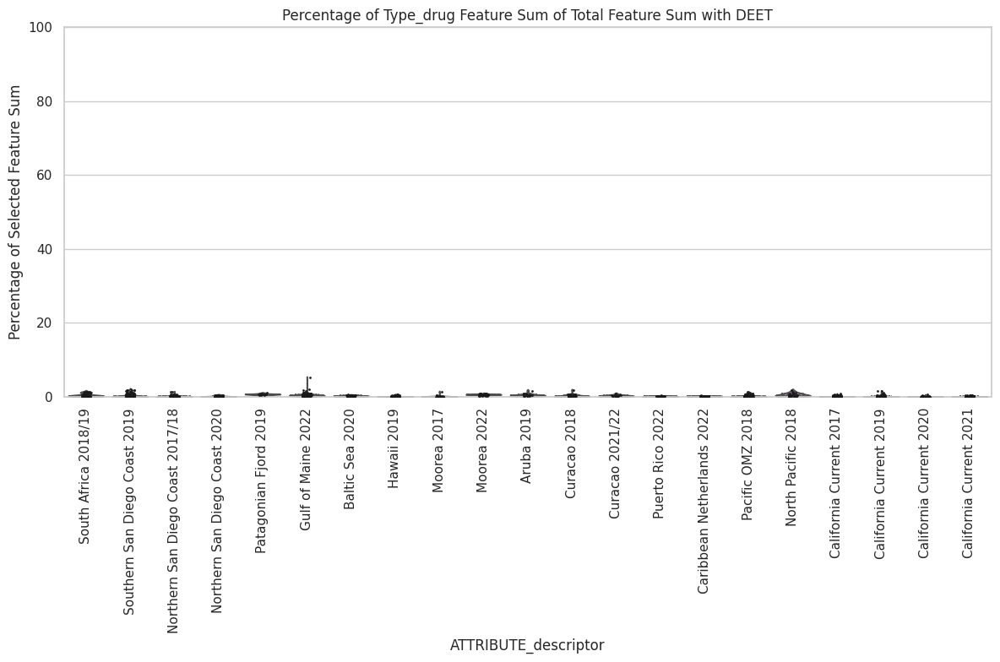

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

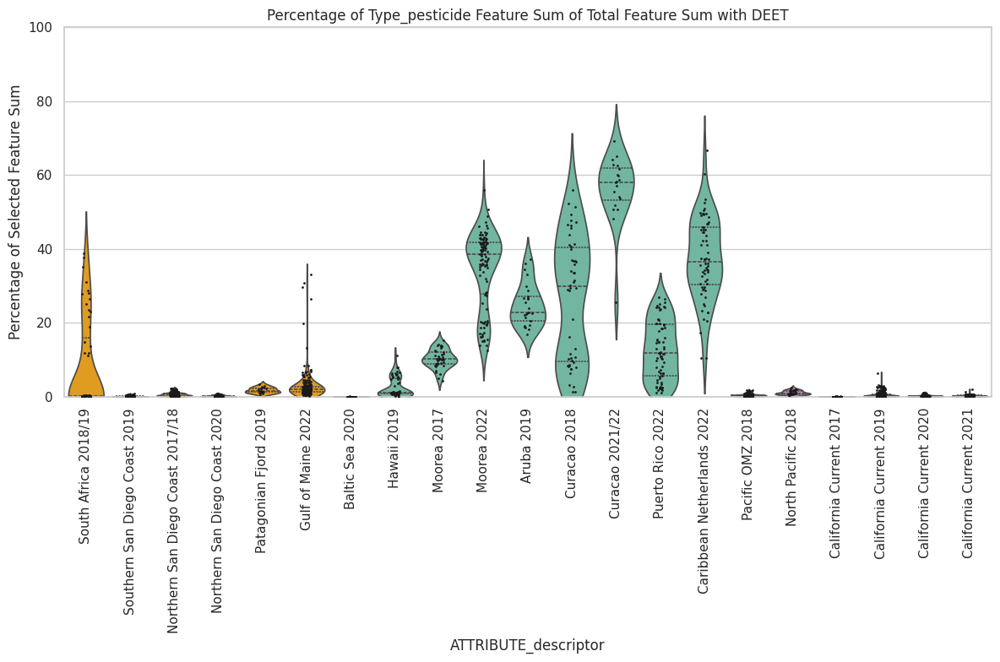

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

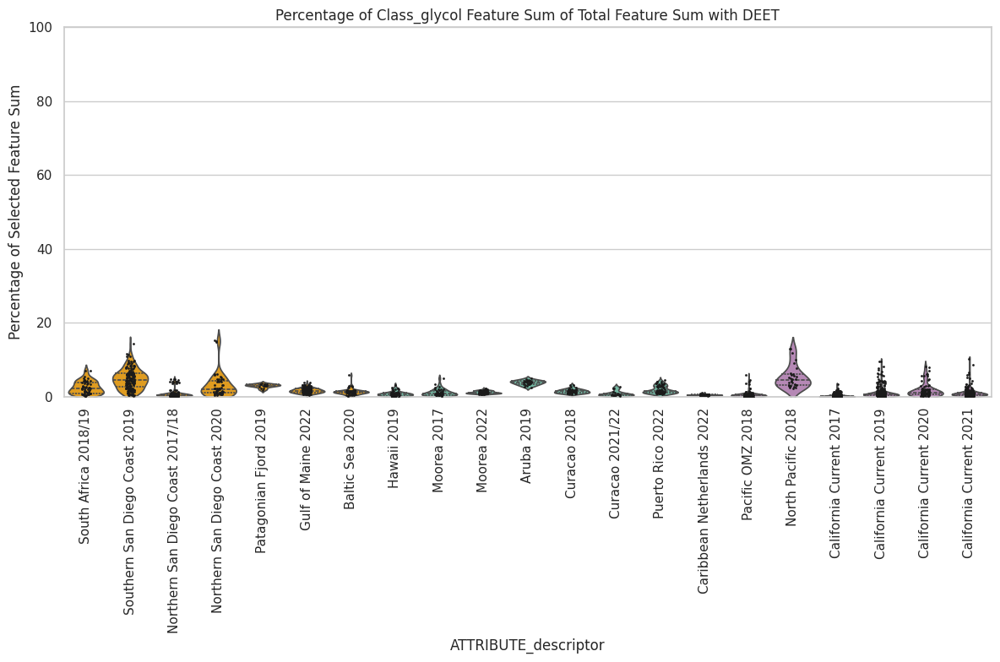

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

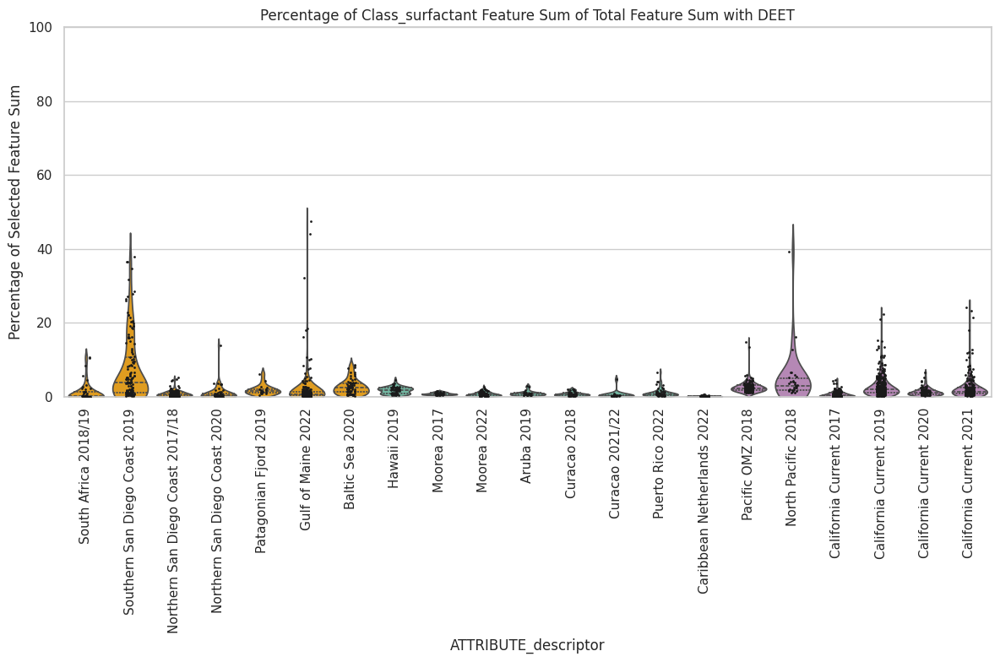

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

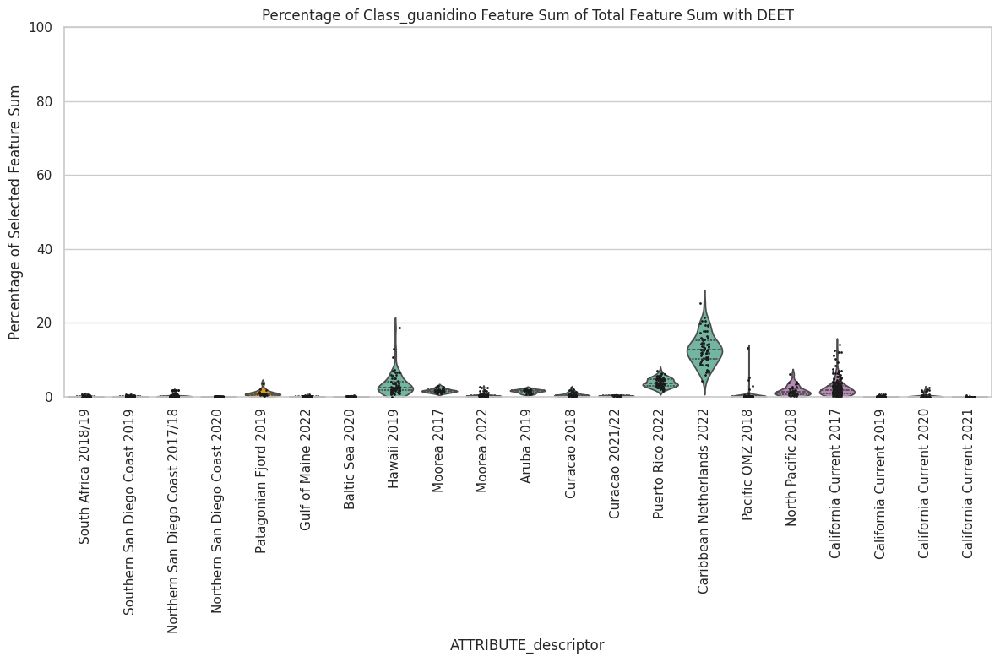

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

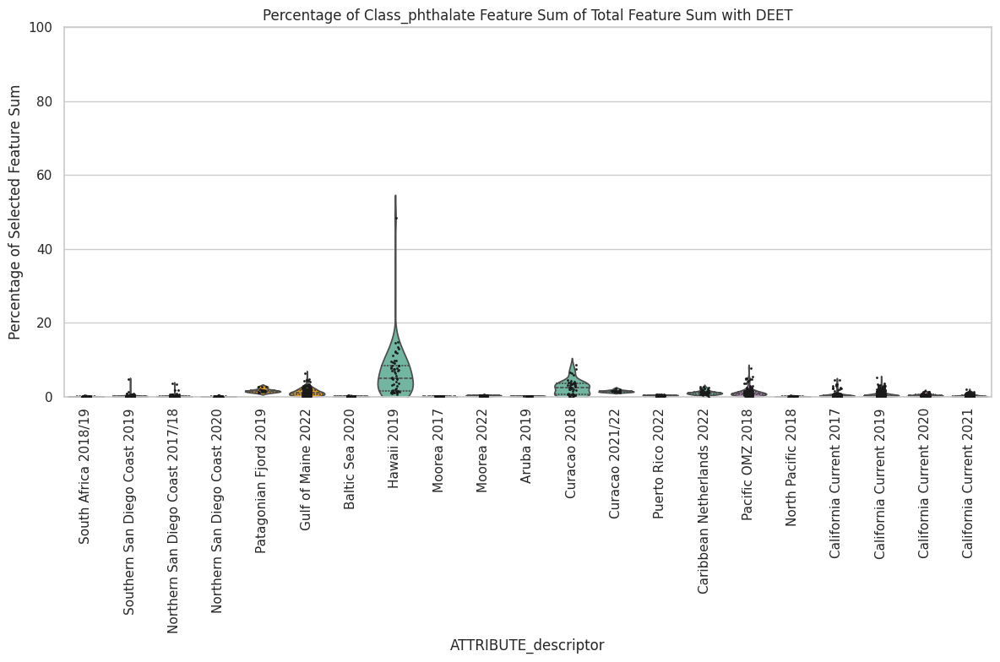

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

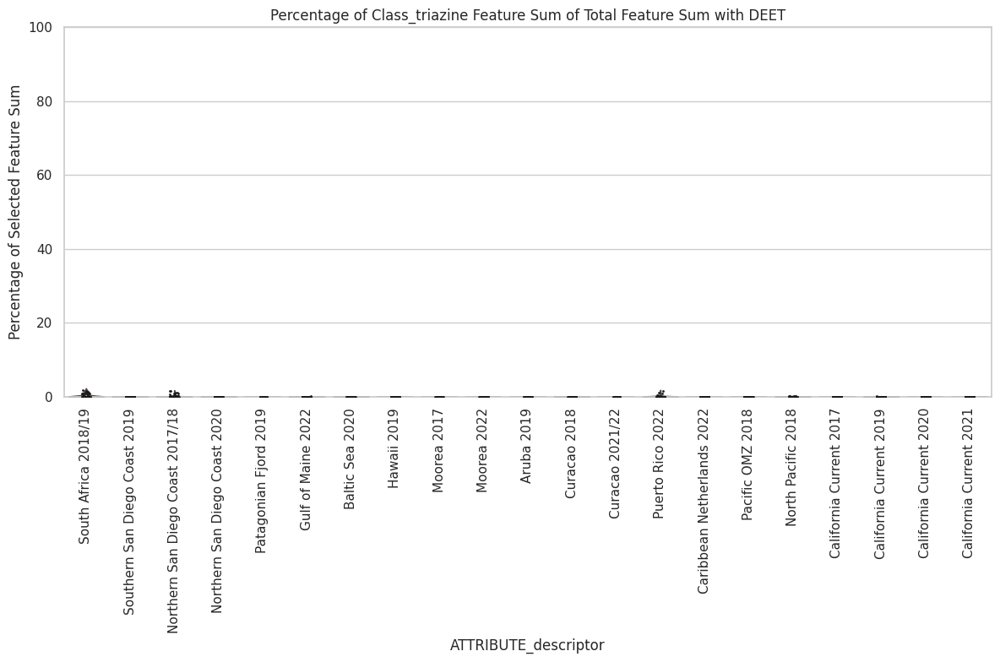

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

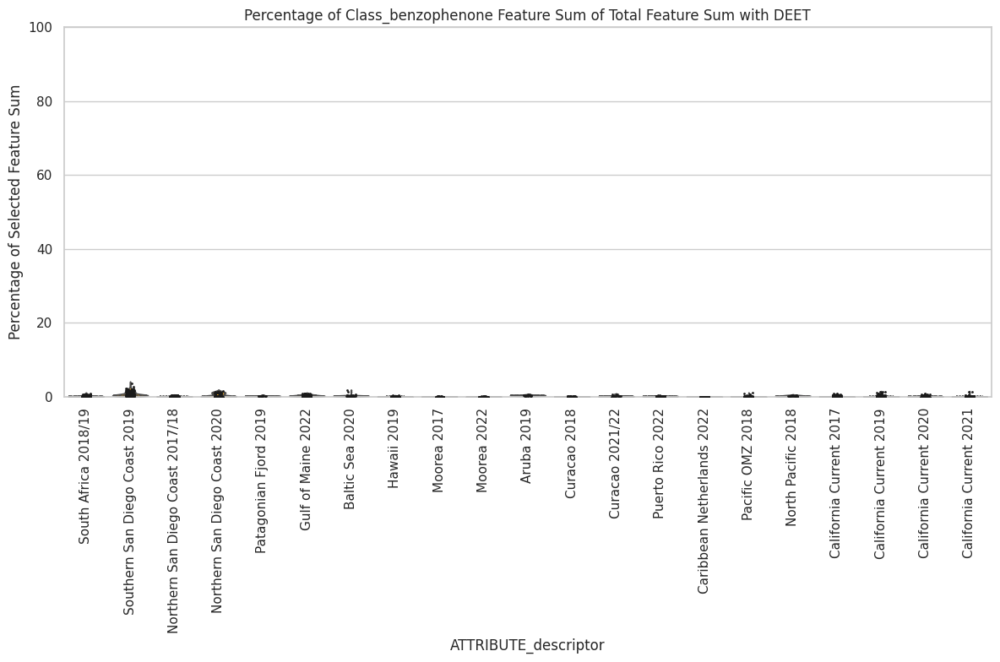

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

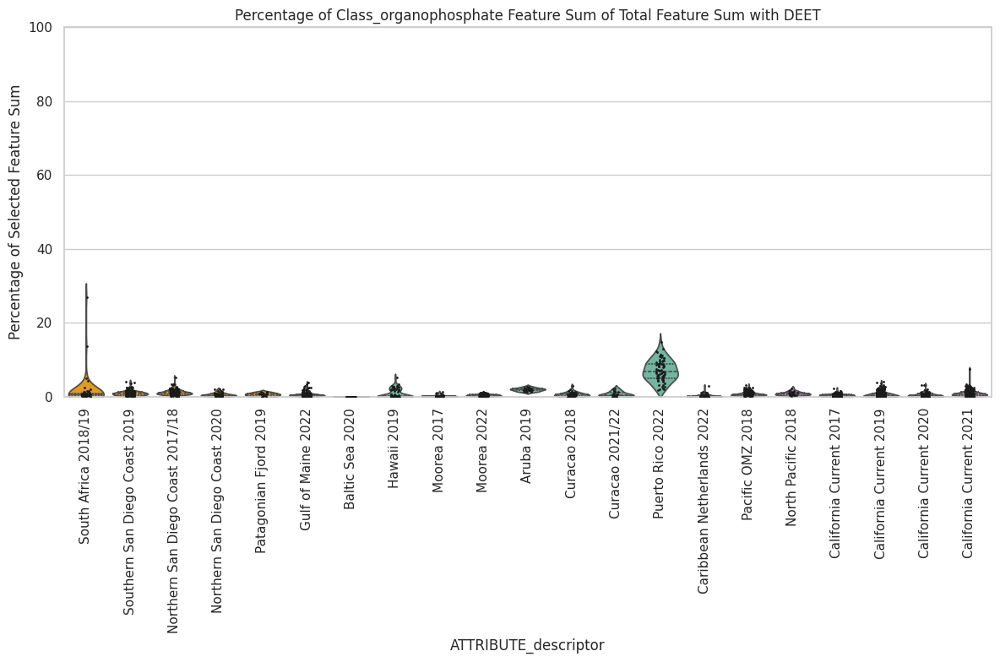

/tmp/ipykernel_1032/980555703.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1032/980555703.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1032/980555703.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

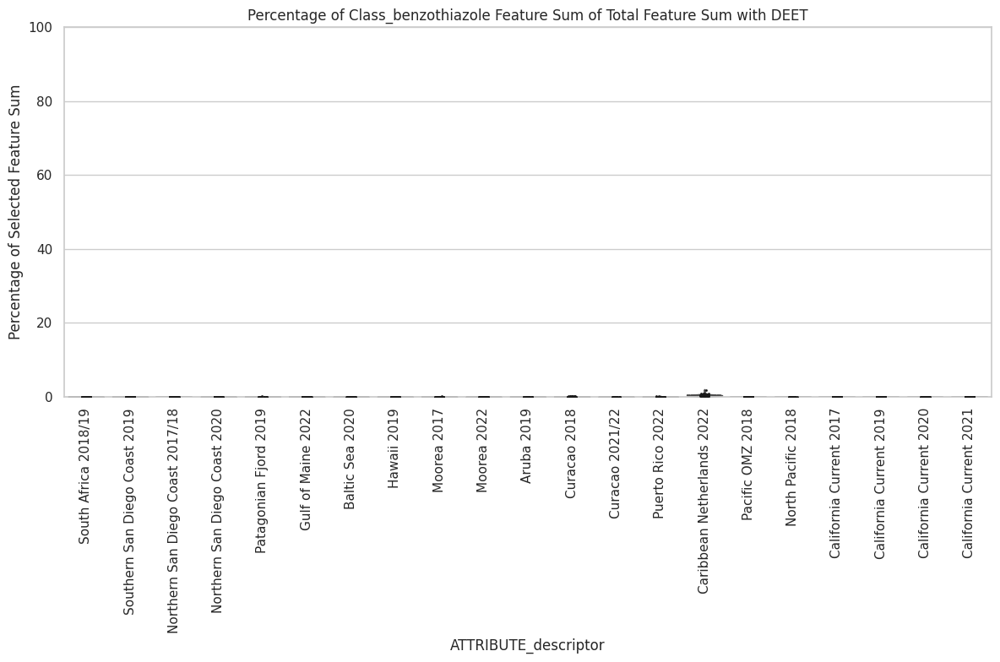

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load features of interest
df_featuresofinterest = pd.read_csv('unique_xenobiotic_features.csv')

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd'
}

# Define subsets for Type and Class
subsets = {
    "Type_urban": df_featuresofinterest[df_featuresofinterest['Type'] == "urban"],
    "Type_drug": df_featuresofinterest[df_featuresofinterest['Type'] == "drug"],
    "Type_pesticide": df_featuresofinterest[df_featuresofinterest['Type'] == "pesticide"],
    "Class_glycol": df_featuresofinterest[df_featuresofinterest['Class'] == "glycol"],
    "Class_surfactant": df_featuresofinterest[df_featuresofinterest['Class'] == "surfactant"],
    "Class_guanidino": df_featuresofinterest[df_featuresofinterest['Class'] == "guanidino"],
    "Class_phthalate": df_featuresofinterest[df_featuresofinterest['Class'] == "phthalate"],
    "Class_triazine": df_featuresofinterest[df_featuresofinterest['Class'] == "triazine"],
    "Class_benzophenone": df_featuresofinterest[df_featuresofinterest['Class'] == "benzophenone"],
    "Class_organophosphate": df_featuresofinterest[df_featuresofinterest['Class'] == "organophosphate"],
    "Class_benzothiazole": df_featuresofinterest[df_featuresofinterest['Class'] == "benzothiazole"]
}

for subset_name, subset_df in subsets.items():
    
    # Filter the DataFrame to keep only the features of interest
    df_selected_features = df[subset_df['row ID']]
    
    # Sum the selected features per sample
    df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
    
    # Calculate the percentage of selected feature sum compared to total feature sum
    df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
    
    # Merge with metadata according to descriptor
    df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')
    
    # Sort the DataFrame based on the desired order
    df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
    df_final = df_final.sort_values('ATTRIBUTE_descriptor')
    
    # Plot violin plot
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    
    ax = sns.violinplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        inner='quartile',  
        palette=custom_palette,
        scale='width'  
    )
    
    sns.stripplot(
        data=df_final,
        x='ATTRIBUTE_descriptor',
        y='percentage',
        color='k',
        size=2,  
        jitter=True,  
        ax=ax
    )
    
    plt.title(f'Percentage of {subset_name} Feature Sum of Total Feature Sum with DEET')
    plt.xlabel('ATTRIBUTE_descriptor')
    plt.ylabel('Percentage of Selected Feature Sum')
    plt.ylim(0, 100)
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Save plot and DataFrame to files
    plt.savefig(f'percentageplot_{subset_name}_withDEET.svg')
    plt.show()
    
    df_final.to_csv(f'final_results_{subset_name}_withDEET.csv', index=False)

# 9.Depth and Distance violins

/tmp/ipykernel_1145/3288884288.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/3288884288.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/3288884288.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

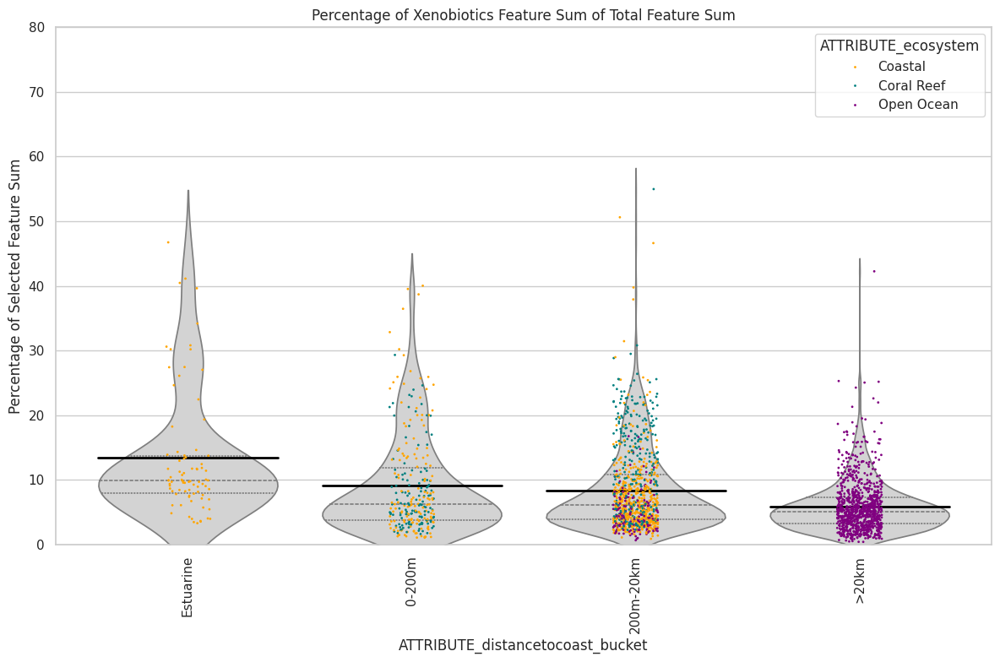

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load the list of features of interest
features_of_interest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[features_of_interest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_distancetocoast_bucket', 'ATTRIBUTE_ecosystem']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['Estuarine', '0-200m', '200m-20km', '>20km']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_distancetocoast_bucket'] = pd.Categorical(df_final['ATTRIBUTE_distancetocoast_bucket'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_distancetocoast_bucket')

# Define colors for ecosystems
ecosystem_colors = {'Coastal': 'orange', 'Coral Reef': 'teal', 'Open Ocean': 'purple'}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_distancetocoast_bucket',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=['lightgrey'],
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_distancetocoast_bucket',
    y='percentage',
    hue='ATTRIBUTE_ecosystem',
    palette=ecosystem_colors,
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax,
    dodge=False  # Separate points by hue
)

# Calculate means and plot them as solid lines
means = df_final.groupby('ATTRIBUTE_distancetocoast_bucket')['percentage'].mean().values
for i, mean in enumerate(means):
    plt.plot([i - 0.4, i + 0.4], [mean, mean], color='black', linestyle='-', linewidth=2)

plt.title('Percentage of Xenobiotics Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_distancetocoast_bucket')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 80)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Violins_Percentageoftotalintensity_distancetocoast.svg')
plt.show()


/tmp/ipykernel_1145/570425133.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/570425133.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/570425133.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

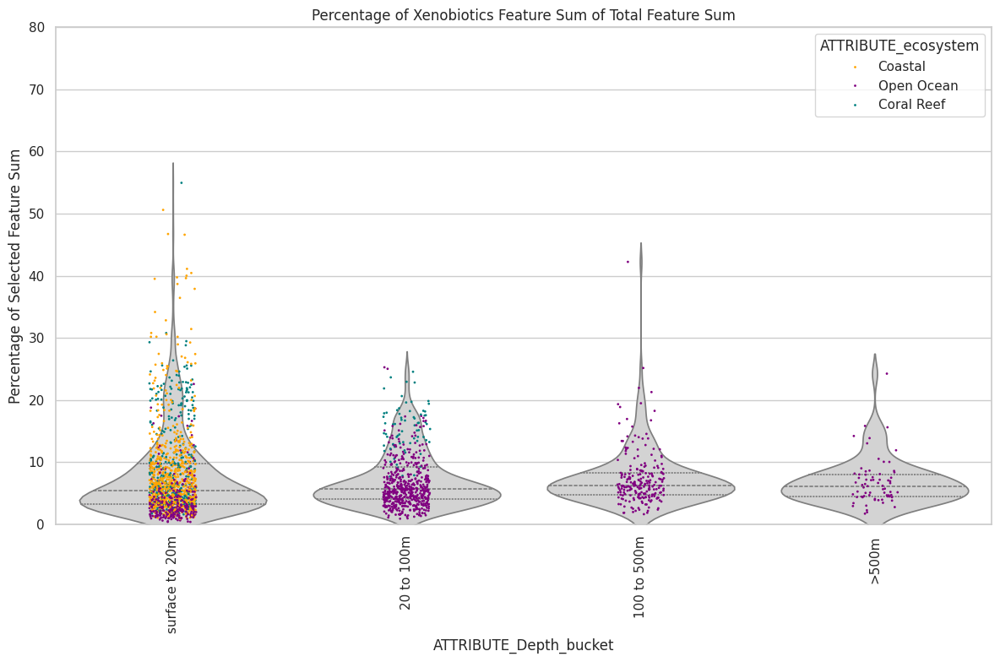

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

# Load the list of features of interest
features_of_interest = pd.read_csv('unique_xenobiotic_features_noDEET.csv')

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[features_of_interest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_Depth_bucket', 'ATTRIBUTE_ecosystem']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['surface to 20m', '20 to 100m', '100 to 500m', '>500m']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_Depth_bucket'] = pd.Categorical(df_final['ATTRIBUTE_Depth_bucket'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_Depth_bucket')

# Define colors for ecosystems
ecosystem_colors = {'Coastal': 'orange', 'Coral Reef': 'teal', 'Open Ocean': 'purple'}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_Depth_bucket',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=['lightgrey'],
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_Depth_bucket',
    y='percentage',
    hue='ATTRIBUTE_ecosystem',
    palette=ecosystem_colors,
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax,
    dodge=False  # Separate points by hue
)

plt.title('Percentage of Xenobiotics Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_Depth_bucket')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 80)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Violins_Percentageoftotalintensity_depth2b.svg')
plt.show()

# 10. 1st neighbors Percentage plots

In [35]:
import pandas as pd

# Read the CSV files
df1 = pd.read_csv('unique_xenobiotic_features_noDEET.csv')  # File 1
df2 = pd.read_csv('filtered_pairs.tsv', sep="\t")     # File 2

df1_prefixed1 = df1.add_prefix('1_')

# Merge on 'row ID' in df1 and 'CLUSTERID1' in df2 with an outer merge
merged_df1 = pd.merge(df1_prefixed1, df2, left_on='1_row ID', right_on='CLUSTERID1', how='outer')

df1_prefixed = df1.add_prefix('2_')

# Merge on 'row ID' in df1 and 'CLUSTERID1' in df2 with an outer merge
merged_df2 = pd.merge(df1_prefixed, merged_df1, left_on='2_row ID', right_on='CLUSTERID2', how='outer')

# Merge columns with 'Class' in their names
merged_df2['Class'] = merged_df2.filter(like='Class').apply(lambda x: '_'.join(x.fillna('').astype(str)), axis=1)

# Merge columns with 'Type' in their names
merged_df2['Type'] = merged_df2.filter(like='Type').apply(lambda x: '_'.join(x.fillna('').astype(str)), axis=1)

# Drop columns with 'row ID' in their names
merged_df2 = merged_df2.drop(columns=merged_df2.filter(like='row ID').columns)
# Drop columns with 'row ID' in their names
merged_df2 = merged_df2.drop(columns=merged_df2.filter(like='1_').columns)
# Drop columns with 'row ID' in their names
merged_df2 = merged_df2.drop(columns=merged_df2.filter(like='2_').columns)

# Drop rows that are empty in CLUSTERID1
merged_df2 = merged_df2.dropna(subset=['CLUSTERID1'])

# Strip underscores from both the front and the end of strings
merged_df2['Class'] = merged_df2['Class'].str.strip('_')
merged_df2['Type'] = merged_df2['Type'].str.strip('_')

# Function to merge replicates
def merge_replicates(s):
    parts = s.split('_')
    unique_parts = []
    for part in parts:
        if not unique_parts or unique_parts[-1] != part:
            unique_parts.append(part)
    return '_'.join(unique_parts)

# Apply the function to 'Class' and 'Type' columns
merged_df2['Class'] = merged_df2['Class'].apply(merge_replicates)
merged_df2['Type'] = merged_df2['Type'].apply(merge_replicates)

# Drop rows that are empty or contain only empty strings in 'Class'
merged_df2 = merged_df2[merged_df2['Class'].str.strip() != '']
merged_df2 = merged_df2.dropna(subset=['Class'])

# Save the filtered DataFrame to a new CSV file (e.g., 'amended_filtered_pairs.csv')
merged_df2.to_csv('amended_filtered_pairs.csv', index=False)

In [36]:
import pandas as pd

# Load the amended_filtered_pairs.csv file
df = pd.read_csv('amended_filtered_pairs.csv')

# Extract unique values from CLUSTERID1 and CLUSTERID2 and put them into a column 'row ID'
unique_ids = pd.unique(df[['CLUSTERID1', 'CLUSTERID2']].values.ravel('K'))
unique_df = pd.DataFrame(unique_ids, columns=['row ID'])

# Function to merge replicates and remove duplicates
def merge_replicates(s):
    parts = s.split('_')
    unique_parts = []
    for part in parts:
        if part not in unique_parts:
            unique_parts.append(part)
    return '_'.join(unique_parts)

# Initialize 'Class' and 'Type' columns in unique_df
unique_df['Class'] = ''
unique_df['Type'] = ''

# Populate 'Class' and 'Type' columns with corresponding values
for idx, row_id in enumerate(unique_df['row ID']):
    class_values = df[(df['CLUSTERID1'] == row_id) | (df['CLUSTERID2'] == row_id)]['Class'].dropna().unique()
    type_values = df[(df['CLUSTERID1'] == row_id) | (df['CLUSTERID2'] == row_id)]['Type'].dropna().unique()
    
    # Merge and separate 'Class' and 'Type' values, remove duplicates
    merged_class = '_'.join(class_values).replace('__', '_').strip('_')
    merged_type = '_'.join(type_values).replace('__', '_').strip('_')
    
    unique_df.at[idx, 'Class'] = merge_replicates(merged_class)
    unique_df.at[idx, 'Type'] = merge_replicates(merged_type)

# Drop rows that are empty or contain only empty strings in 'Class'
unique_df = unique_df[unique_df['Class'].str.strip() != '']
unique_df = unique_df.dropna(subset=['Class'])

# Save the resulting DataFrame to a new CSV file (e.g., 'unique_combined_pairs.csv')
unique_df.to_csv('unique_combined_filtered_pairs.csv', index=False)

print("The unique values have been extracted and saved to 'unique_combined_pairs.csv'.")



The unique values have been extracted and saved to 'unique_combined_pairs.csv'.


In [37]:
import pandas as pd

# Read the CSV files
df1 = pd.read_csv('unique_xenobiotic_features_noDEET.csv')  # File 1
df2 = pd.read_csv('merged_pairs.tsv', sep="\t")     # File 2

df1_prefixed1 = df1.add_prefix('1_')

# Merge on 'row ID' in df1 and 'CLUSTERID1' in df2 with an outer merge
merged_df1 = pd.merge(df1_prefixed1, df2, left_on='1_row ID', right_on='CLUSTERID1', how='outer')

df1_prefixed = df1.add_prefix('2_')

# Merge on 'row ID' in df1 and 'CLUSTERID1' in df2 with an outer merge
merged_df2 = pd.merge(df1_prefixed, merged_df1, left_on='2_row ID', right_on='CLUSTERID2', how='outer')

# Merge columns with 'Class' in their names
merged_df2['Class'] = merged_df2.filter(like='Class').apply(lambda x: '_'.join(x.fillna('').astype(str)), axis=1)

# Merge columns with 'Type' in their names
merged_df2['Type'] = merged_df2.filter(like='Type').apply(lambda x: '_'.join(x.fillna('').astype(str)), axis=1)

# Drop columns with 'row ID' in their names
merged_df2 = merged_df2.drop(columns=merged_df2.filter(like='row ID').columns)
# Drop columns with 'row ID' in their names
merged_df2 = merged_df2.drop(columns=merged_df2.filter(like='1_').columns)
# Drop columns with 'row ID' in their names
merged_df2 = merged_df2.drop(columns=merged_df2.filter(like='2_').columns)

# Drop rows that are empty in CLUSTERID1
merged_df2 = merged_df2.dropna(subset=['CLUSTERID1'])

# Strip underscores from both the front and the end of strings
merged_df2['Class'] = merged_df2['Class'].str.strip('_')
merged_df2['Type'] = merged_df2['Type'].str.strip('_')

# Function to merge replicates
def merge_replicates(s):
    parts = s.split('_')
    unique_parts = []
    for part in parts:
        if not unique_parts or unique_parts[-1] != part:
            unique_parts.append(part)
    return '_'.join(unique_parts)

# Apply the function to 'Class' and 'Type' columns
merged_df2['Class'] = merged_df2['Class'].apply(merge_replicates)
merged_df2['Type'] = merged_df2['Type'].apply(merge_replicates)

# Drop rows that are empty or contain only empty strings in 'Class'
merged_df2 = merged_df2[merged_df2['Class'].str.strip() != '']
merged_df2 = merged_df2.dropna(subset=['Class'])

# Save the filtered DataFrame to a new CSV file (e.g., 'amended_filtered_pairs.csv')
merged_df2.to_csv('amended_merged_pairs.csv', index=False)

In [38]:
import pandas as pd

# Load the amended_filtered_pairs.csv file
df = pd.read_csv('amended_merged_pairs.csv')

# Extract unique values from CLUSTERID1 and CLUSTERID2 and put them into a column 'row ID'
unique_ids = pd.unique(df[['CLUSTERID1', 'CLUSTERID2']].values.ravel('K'))
unique_df = pd.DataFrame(unique_ids, columns=['row ID'])

# Function to merge replicates and remove duplicates
def merge_replicates(s):
    parts = s.split('_')
    unique_parts = []
    for part in parts:
        if part not in unique_parts:
            unique_parts.append(part)
    return '_'.join(unique_parts)

# Initialize 'Class' and 'Type' columns in unique_df
unique_df['Class'] = ''
unique_df['Type'] = ''

# Populate 'Class' and 'Type' columns with corresponding values
for idx, row_id in enumerate(unique_df['row ID']):
    class_values = df[(df['CLUSTERID1'] == row_id) | (df['CLUSTERID2'] == row_id)]['Class'].dropna().unique()
    type_values = df[(df['CLUSTERID1'] == row_id) | (df['CLUSTERID2'] == row_id)]['Type'].dropna().unique()
    
    # Merge and separate 'Class' and 'Type' values, remove duplicates
    merged_class = '_'.join(class_values).replace('__', '_').strip('_')
    merged_type = '_'.join(type_values).replace('__', '_').strip('_')
    
    unique_df.at[idx, 'Class'] = merge_replicates(merged_class)
    unique_df.at[idx, 'Type'] = merge_replicates(merged_type)

# Drop rows that are empty or contain only empty strings in 'Class'
unique_df = unique_df[unique_df['Class'].str.strip() != '']
unique_df = unique_df.dropna(subset=['Class'])

# Save the resulting DataFrame to a new CSV file (e.g., 'unique_combined_pairs.csv')
unique_df.to_csv('unique_combined_merged_pairs.csv', index=False)

print("The unique values have been extracted and saved to 'unique_combined_pairs.csv'.")


The unique values have been extracted and saved to 'unique_combined_pairs.csv'.


/tmp/ipykernel_1145/703906443.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/703906443.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/703906443.py:86: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

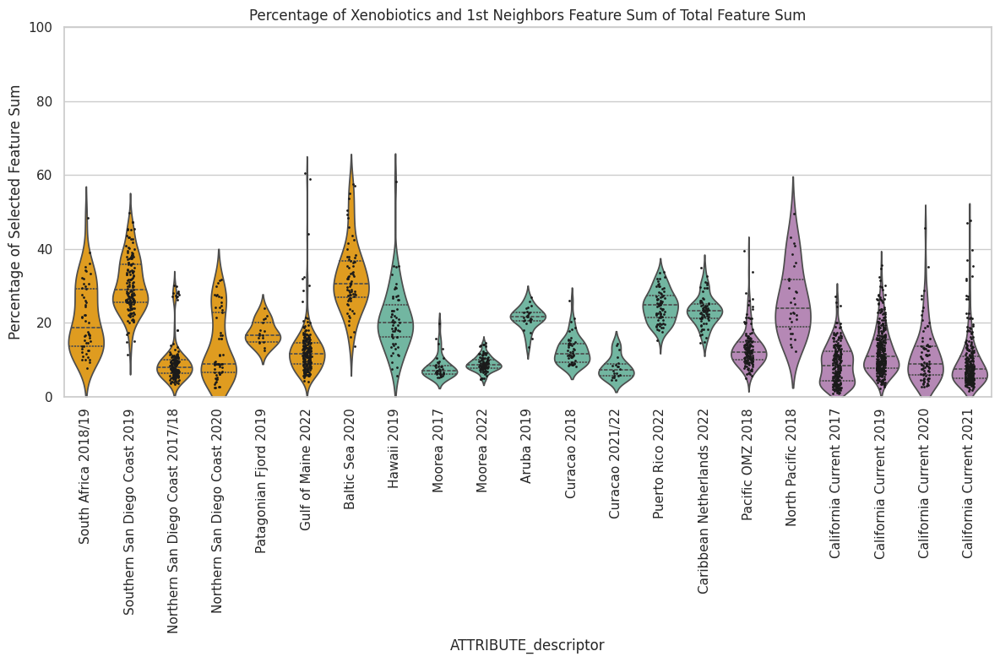

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_filtered_pairs.csv', dtype={'row ID': int})

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Calculate the median and mean for each ATTRIBUTE_descriptor
median_values = df_final.groupby('ATTRIBUTE_descriptor')['percentage'].median().reset_index()
median_values.rename(columns={'percentage': 'median_percentage'}, inplace=True)

mean_values = df_final.groupby('ATTRIBUTE_descriptor')['percentage'].mean().reset_index()
mean_values.rename(columns={'percentage': 'mean_percentage'}, inplace=True)

# Merge the median and mean values with the final DataFrame
df_final = df_final.merge(median_values, on='ATTRIBUTE_descriptor')
df_final = df_final.merge(mean_values, on='ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics and 1st Neighbors Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics1stneighbors_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics1stneighbors_noDEET.csv', index=False)


/tmp/ipykernel_1145/4278519757.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/4278519757.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/4278519757.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

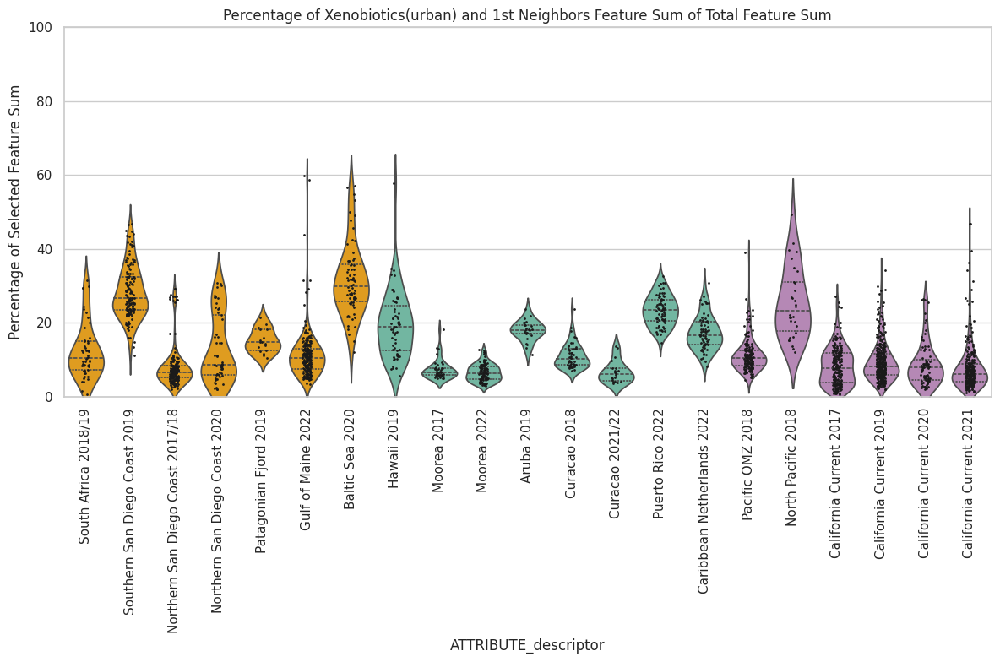

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_filtered_pairs.csv', dtype={'row ID': int})

# Drop rows that do not have the string 'urban' in the 'Type' column
df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['Type'].str.contains('urban', na=False)]

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(urban) and 1st Neighbors Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics1stneighborsurban_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics1stneighborsurban_noDEET.csv', index=False)

/tmp/ipykernel_1145/3285815827.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/3285815827.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/3285815827.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

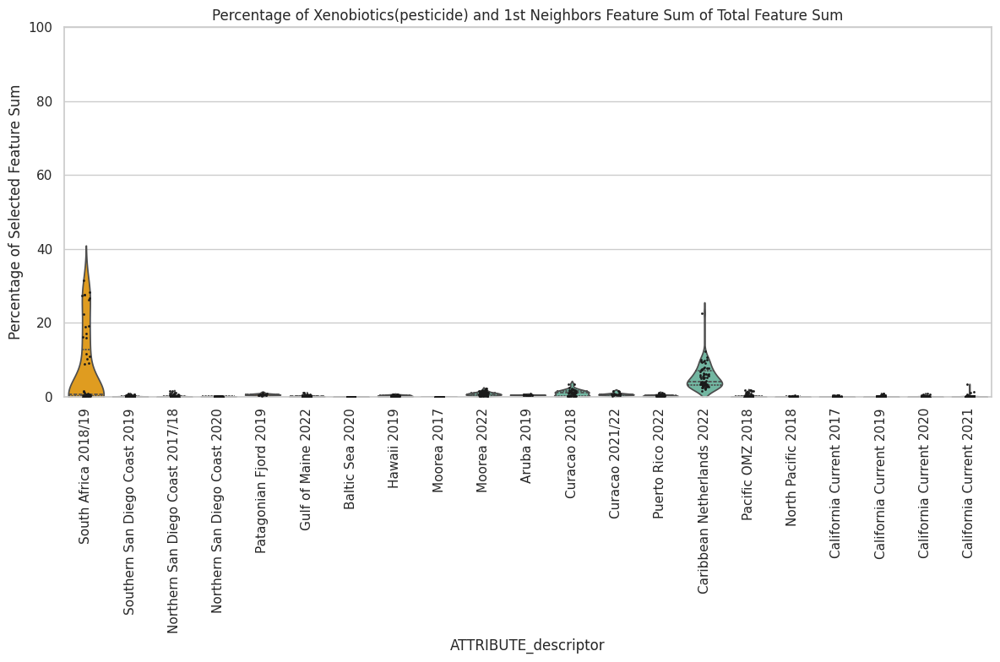

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_filtered_pairs.csv', dtype={'row ID': int})

# Drop rows that do not have the string 'urban' in the 'Type' column
df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['Type'].str.contains('pesticide', na=False)]

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(pesticide) and 1st Neighbors Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics1stneighborspesticide_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics1stneighborspesticide_noDEET.csv', index=False)

/tmp/ipykernel_1145/4033236725.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/4033236725.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/4033236725.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

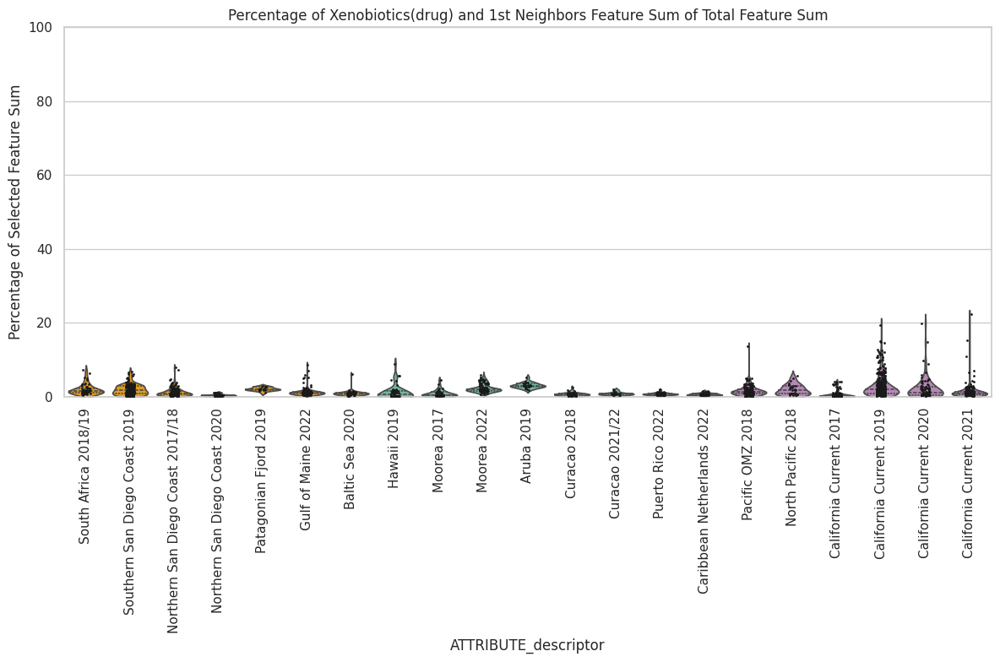

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_filtered_pairs.csv', dtype={'row ID': int})

# Drop rows that do not have the string 'urban' in the 'Type' column
df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['Type'].str.contains('drug', na=False)]

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(drug) and 1st Neighbors Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics1stneighborsdrug_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics1stneighborsdrug_noDEET.csv', index=False)

/tmp/ipykernel_1145/4229519716.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/4229519716.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/4229519716.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

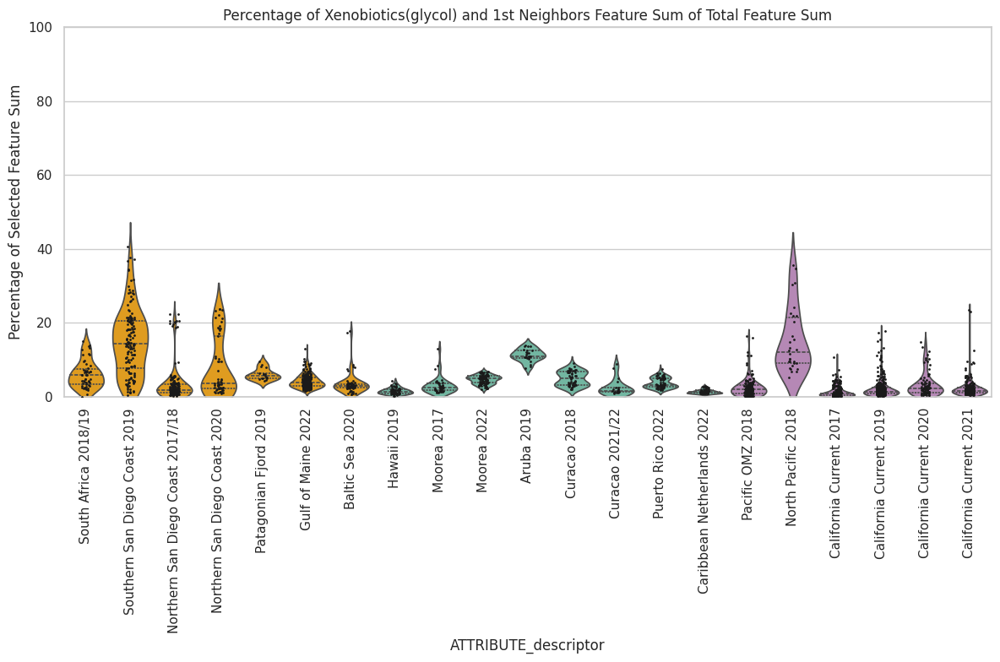

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_filtered_pairs.csv', dtype={'row ID': int})

# Drop rows that do not have the string 'urban' in the 'Type' column
df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['Class'].str.contains('glycol', na=False)]

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(glycol) and 1st Neighbors Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics1stneighborsglycol_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics1stneighborsglycol_noDEET.csv', index=False)

/tmp/ipykernel_1145/2454073908.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/2454073908.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/2454073908.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

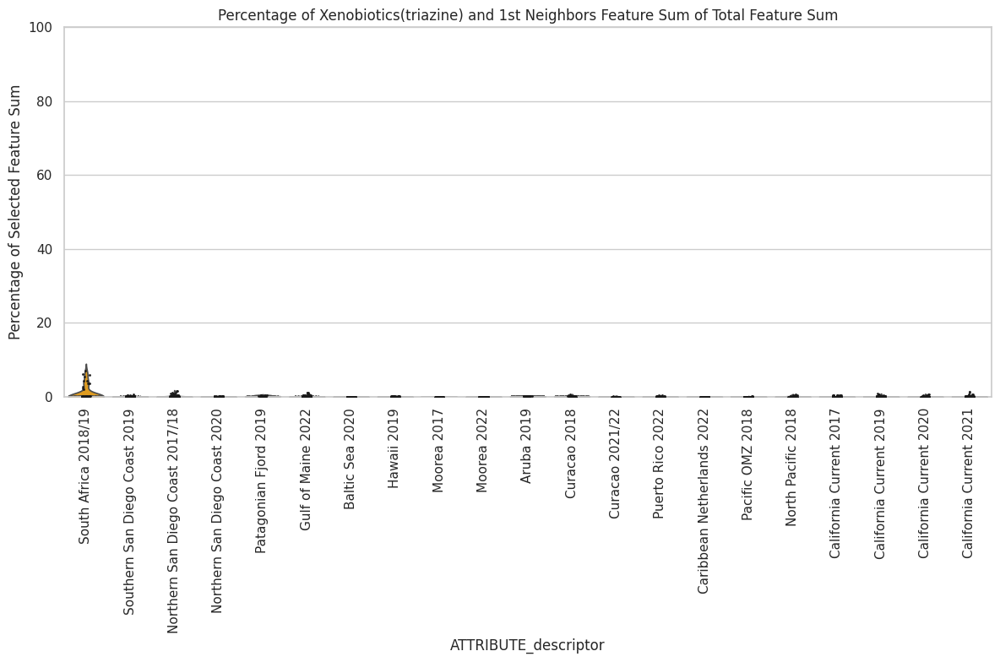

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_filtered_pairs.csv', dtype={'row ID': int})

# Drop rows that do not have the string 'urban' in the 'Type' column
df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['Class'].str.contains('triazine', na=False)]

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(triazine) and 1st Neighbors Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics1stneighborstriazine_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics1stneighborstriazine_noDEET.csv', index=False)

/tmp/ipykernel_1145/663274963.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/663274963.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/663274963.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

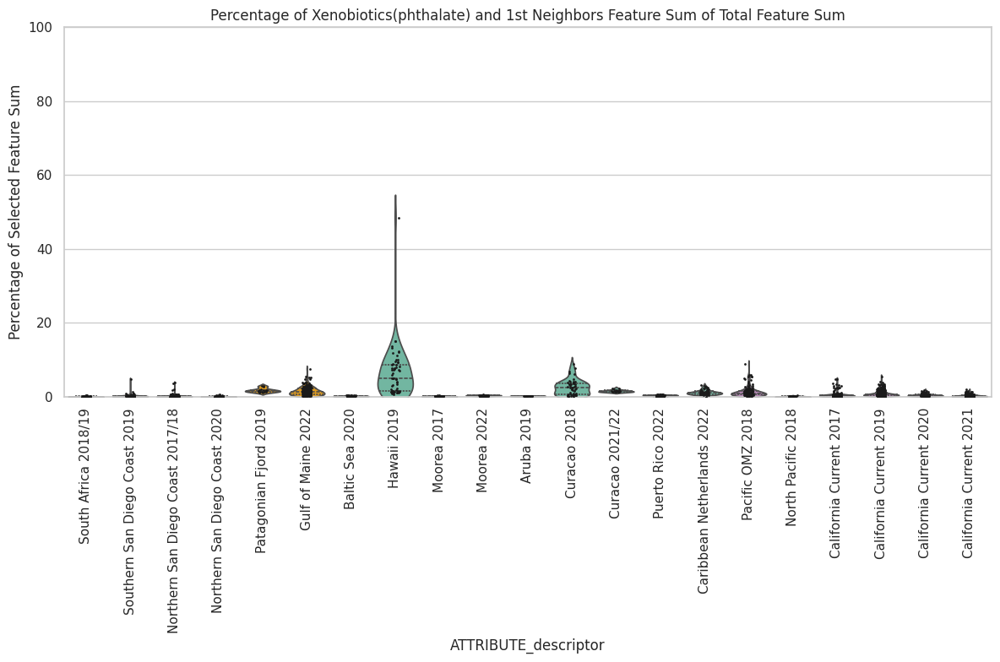

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_filtered_pairs.csv', dtype={'row ID': int})

# Drop rows that do not have the string 'urban' in the 'Type' column
df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['Class'].str.contains('phthalate', na=False)]

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(phthalate) and 1st Neighbors Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics1stneighborsphthalate_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics1stneighborsphthalate_noDEET.csv', index=False)

/tmp/ipykernel_1145/269129562.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/269129562.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/269129562.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

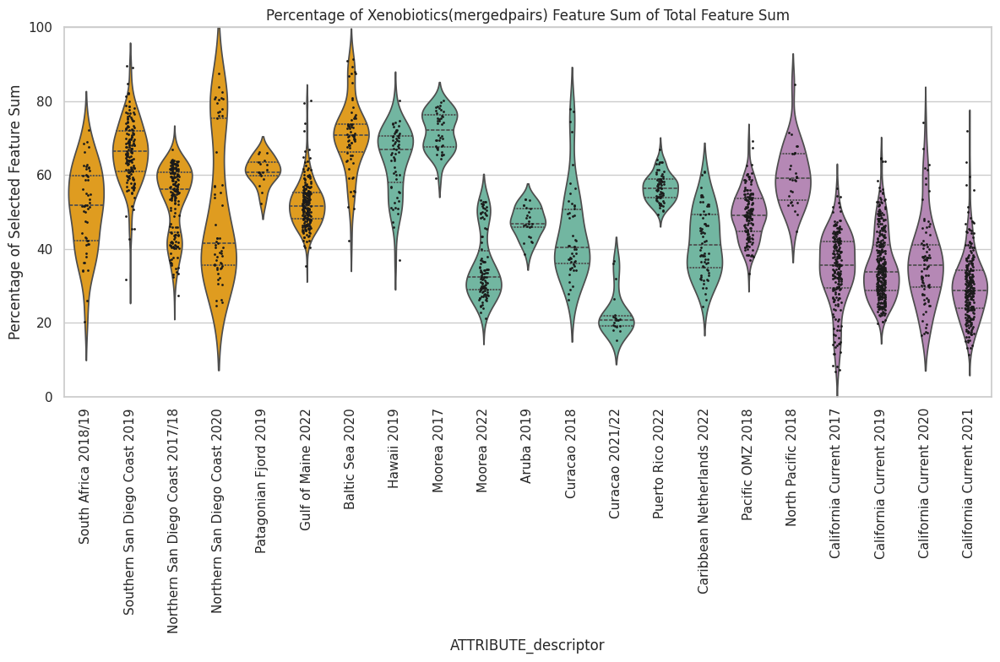

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_merged_pairs.csv', dtype={'row ID': int})

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(mergedpairs) Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics(mergedpairs)_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics(mergedpairs)_noDEET.csv', index=False)

/tmp/ipykernel_1145/1807604113.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/1807604113.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/1807604113.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

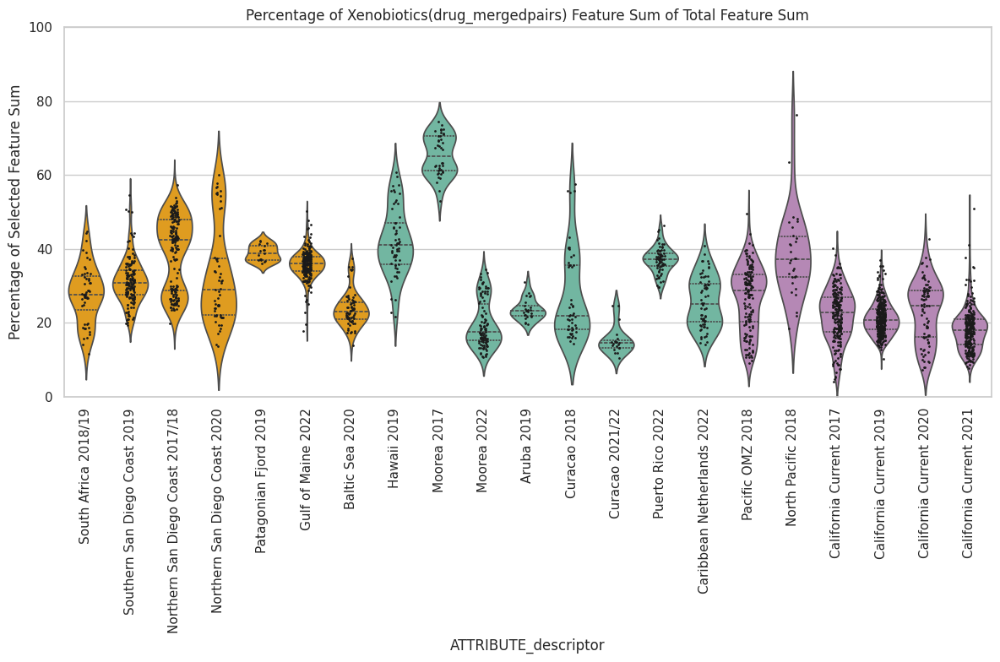

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_merged_pairs.csv', dtype={'row ID': int})

# Drop rows that do not have the string 'urban' in the 'Type' column
df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['Type'].str.contains('drug', na=False)]

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(drug_mergedpairs) Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics(drug_mergedpairs)_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics(drug_mergedpairs)_noDEET.csv', index=False)

/tmp/ipykernel_1145/2611255636.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/2611255636.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/2611255636.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

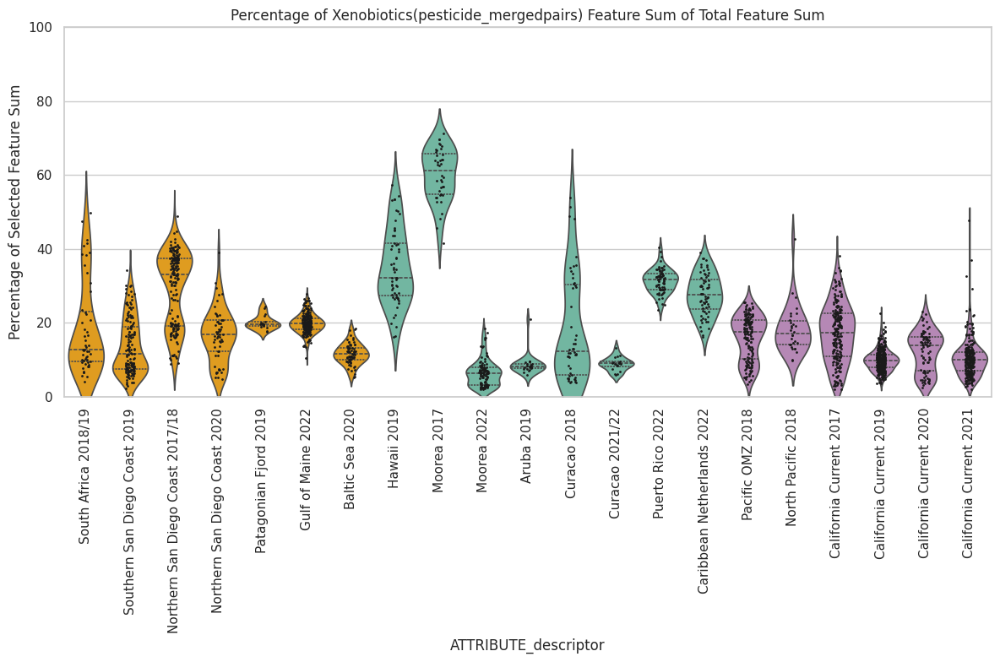

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_merged_pairs.csv', dtype={'row ID': int})

# Drop rows that do not have the string 'urban' in the 'Type' column
df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['Type'].str.contains('pesticide', na=False)]

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(pesticide_mergedpairs) Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics(pesticide_mergedpairs)_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics(pesticide_mergedpairs)_noDEET.csv', index=False)

/tmp/ipykernel_1145/960182498.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)
/tmp/ipykernel_1145/960182498.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100
/tmp/ipykernel_1145/960182498.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

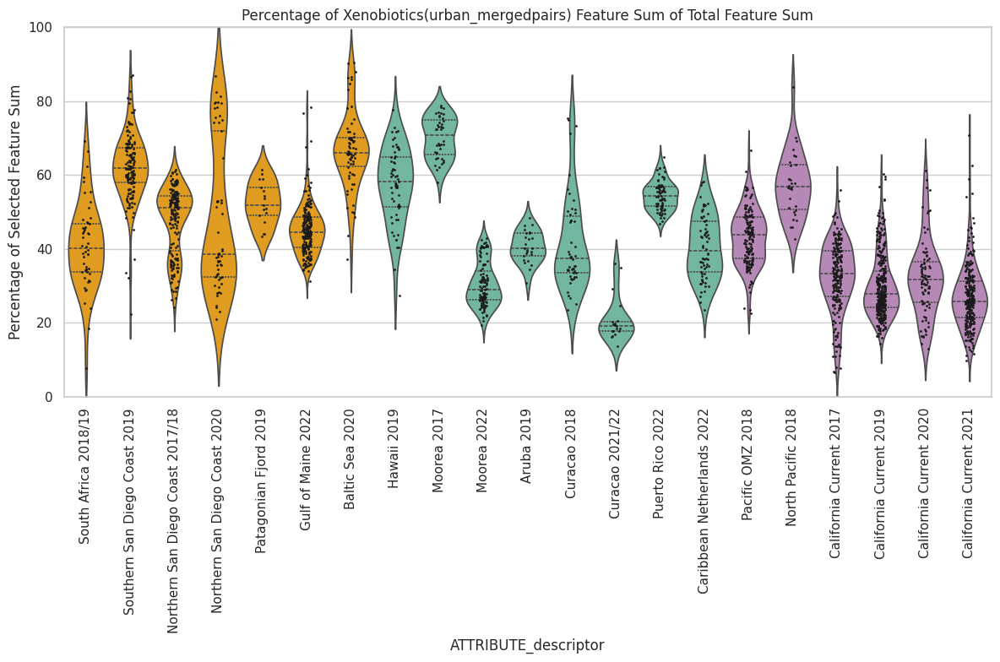

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('Transposed_Cleaned05_go.csv', index_col='row ID')

# Filter columns containing ".mz"
df = df.filter(regex=".mz")

# Remove " Peak area" from any strings in the df
df.columns = df.columns.str.replace(" Peak area", "")

# Transpose the DataFrame so that sample names are the index
df = df.transpose()

# Sum all rows to get total feature sum per sample
df['total_feature_sum'] = df.sum(axis=1)

df_featuresofinterest = pd.read_csv('unique_combined_merged_pairs.csv', dtype={'row ID': int})

# Drop rows that do not have the string 'urban' in the 'Type' column
df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['Type'].str.contains('urban', na=False)]

df_featuresofinterest = df_featuresofinterest[df_featuresofinterest['row ID'].isin(pd.read_csv('Transposed_Cleaned05_go.csv')['row ID'])]

# Filter the DataFrame to keep only the features of interest
df_selected_features = df[df_featuresofinterest['row ID']]

# Sum the selected features per sample
df_selected_features['selected_feature_sum'] = df_selected_features.sum(axis=1)

# Calculate the percentage of selected feature sum compared to total feature sum
df_selected_features['percentage'] = (df_selected_features['selected_feature_sum'] / df['total_feature_sum']) * 100

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_blnkrem4depthdistance.txt', sep='\t')

# Merge with metadata according to descriptor
df_final = df_selected_features.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021']

# Sort the DataFrame based on the desired order
df_final['ATTRIBUTE_descriptor'] = pd.Categorical(df_final['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
df_final = df_final.sort_values('ATTRIBUTE_descriptor')

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    #'Blanks': 'lightgrey'
}

# Plot violin plot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.violinplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    inner='quartile',  # Show quartiles inside the violin
    palette=custom_palette,
    scale='width'  # Normalize the width of the violins
)
sns.stripplot(
    data=df_final,
    x='ATTRIBUTE_descriptor',
    y='percentage',
    color='k',
    size=2,  # Adjust size if needed
    jitter=True,  # Add jitter to prevent overlapping
    ax=ax
)

plt.title('Percentage of Xenobiotics(urban_mergedpairs) Feature Sum of Total Feature Sum')
plt.xlabel('ATTRIBUTE_descriptor')
plt.ylabel('Percentage of Selected Feature Sum')
plt.ylim(0, 100)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('percentageplot_xenobiotics(urban_mergedpairs)_noDEET.svg')
plt.show()

# Save the final DataFrame to a CSV file
df_final.to_csv('final_results_xenobiotics(urban_mergedpairs)_noDEET.csv', index=False)

# 11. 1st neighbor violin plots xenobiotic class scaled (for MN)

In [50]:
import pandas as pd

# Load xenobiotic table
df = pd.read_csv('unique_combined_filtered_pairs.csv')
df['row ID'] = df['row ID'].astype(str)
df['Class'] = df['Class'].astype(str)
# Drop unknown classifications
df = df[df['Type'] != 'unknown']

# Keep only the 'row ID' and 'Class' columns
df = df[['row ID', 'Class']]

# Convert 'row ID' to floats and then to integers
df['row ID'] = df['row ID'].astype(float).astype(int)

# Split the 'row ID' column
df_split = df['row ID'].astype(str).str.split('_', expand=True)

# Flatten the DataFrame and drop NaN values
df_split = df_split.stack().reset_index(level=1, drop=True).to_frame(name='row ID')

# Convert 'row ID' back to integers
df_split['row ID'] = df_split['row ID'].astype(int)

# Add the 'Class' column back to the split DataFrame
df_split['Class'] = df['Class'].values.repeat(df_split.groupby(level=0).size())

# Remove duplicate entries
df_split = df_split.drop_duplicates()

print(df_split)

     row ID                                    Class
0     25255                                guanidino
1       836                                guanidino
2      5344                                guanidino
3      6256                                guanidino
4     24824  fluorinated prostaglandin_benzopyranone
..      ...                                      ...
521   38661                                 alkaloid
522   21082                                  citrate
523   11212                                   glycol
524   34164                                   glycol
525   40178                          organophosphate

[526 rows x 2 columns]


In [51]:
import pandas as pd

# Load the FT
ft_df = pd.read_csv('featuretable_reformated.csv')

#remove Peak area suffix
ft_df.columns = ft_df.columns.str.replace(' Peak area', '')

# Remove columns that don't have '.mz' or 'ID' in their header 
ft_filtered = ft_df.filter(regex='(.mz|row ID)')

# Convert 'row ID' columns to the same type
ft_filtered['row ID'] = ft_filtered['row ID'].astype(str)
df_split['row ID'] = df_split['row ID'].astype(str)

# Merge DataFrames on 'row ID'
merged_df = pd.merge(ft_filtered, df_split, on='row ID', how='right')

# Save the filtered result to a new CSV file
merged_df.to_csv('xenobiotics1stneighbors_withblanks(class).csv', index=False)

print("The filtered feature table has been saved to 'filtered_featuretable.csv'.")


/tmp/ipykernel_1145/539519053.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ft_filtered['row ID'] = ft_filtered['row ID'].astype(str)


The filtered feature table has been saved to 'filtered_featuretable.csv'.


In [52]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Separate the 'row ID' and 'Type' columns 
id_type_df = merged_df[['row ID', 'Class']]

# Filter columns containing ".mz"
df = merged_df.filter(regex=".mz")

# Scale the features (rows)
scaled_features = scaler.fit_transform(df.T).T

# Create a new DataFrame with the scaled features
scaled_df = pd.DataFrame(scaled_features, index=df.index, columns=df.columns)

# Add the 'row ID' and 'Type' columns back to the scaled DataFrame 
final_df = pd.concat([id_type_df, scaled_df], axis=1)

# Save the final DataFrame to a new file with suffix '_Scaled'
final_df.to_csv('xenobiotics1stneighbors_withblanks(class)_scaled.csv', index=False)


/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


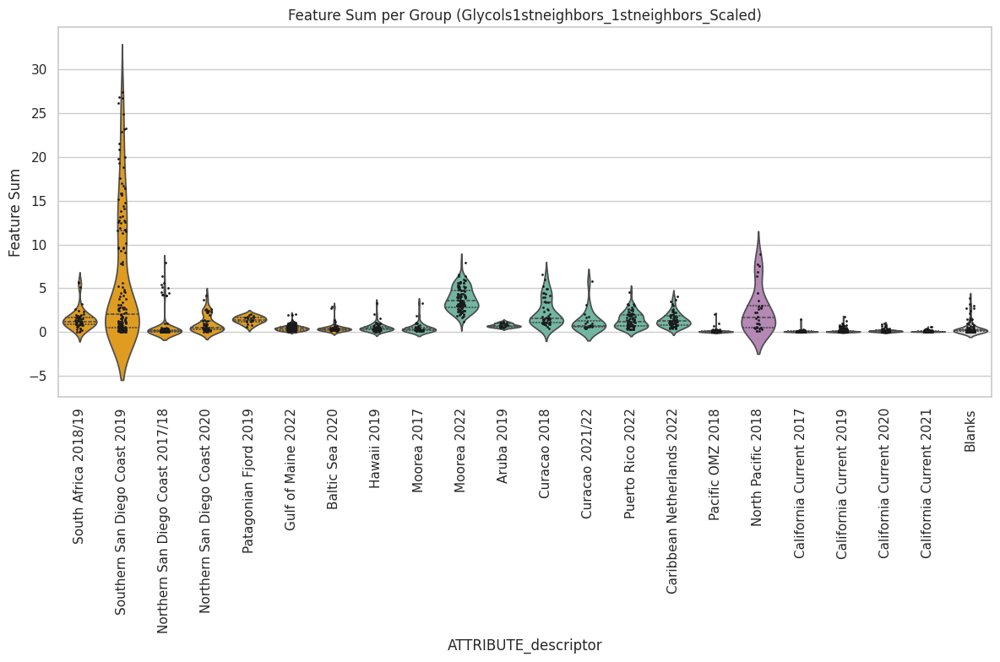

/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


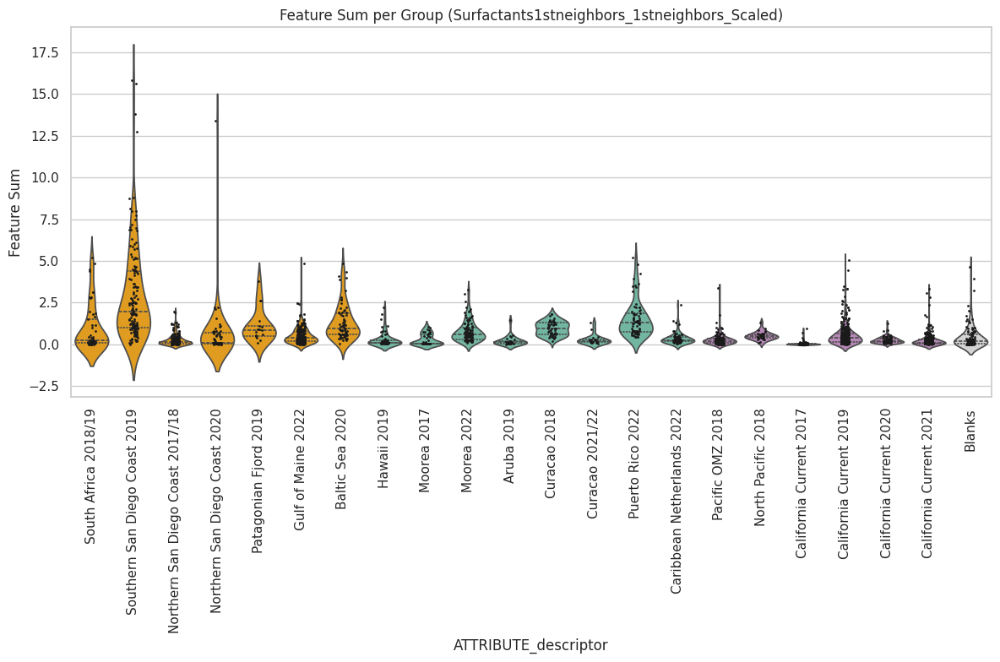

/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


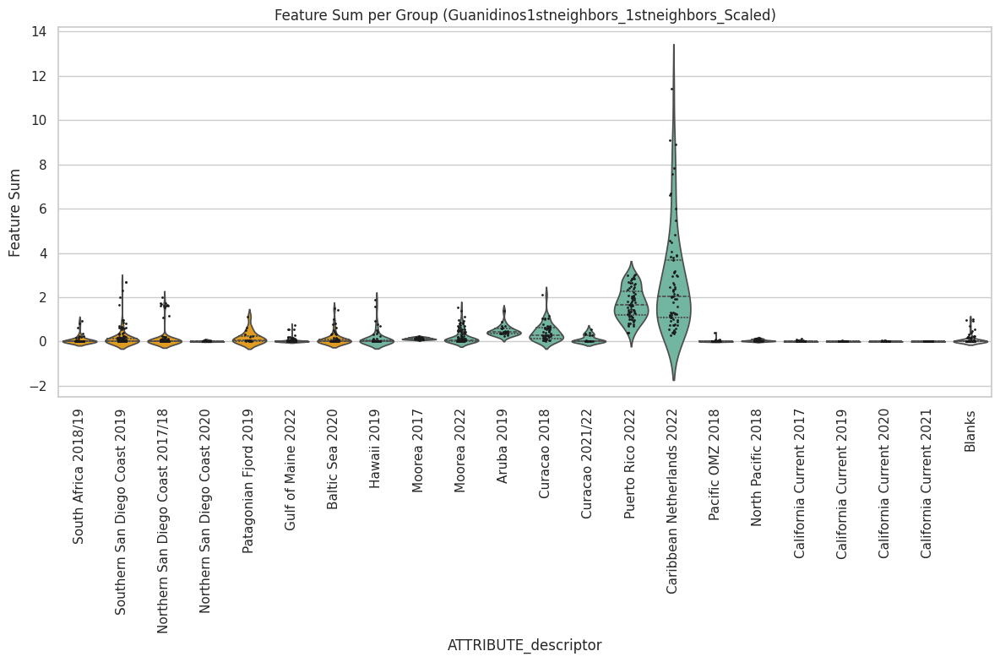

/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


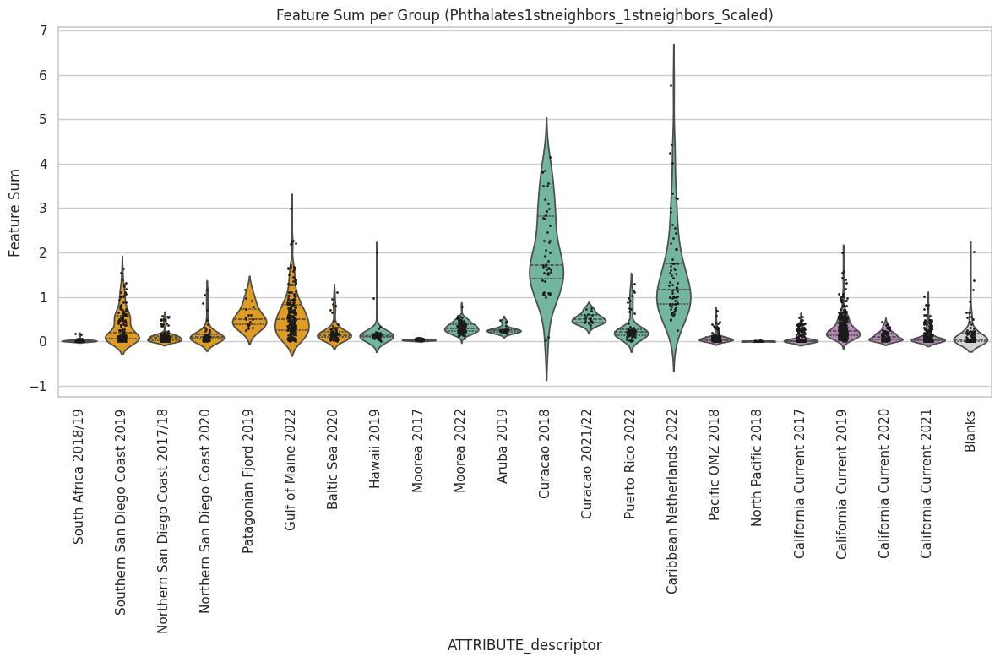

/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


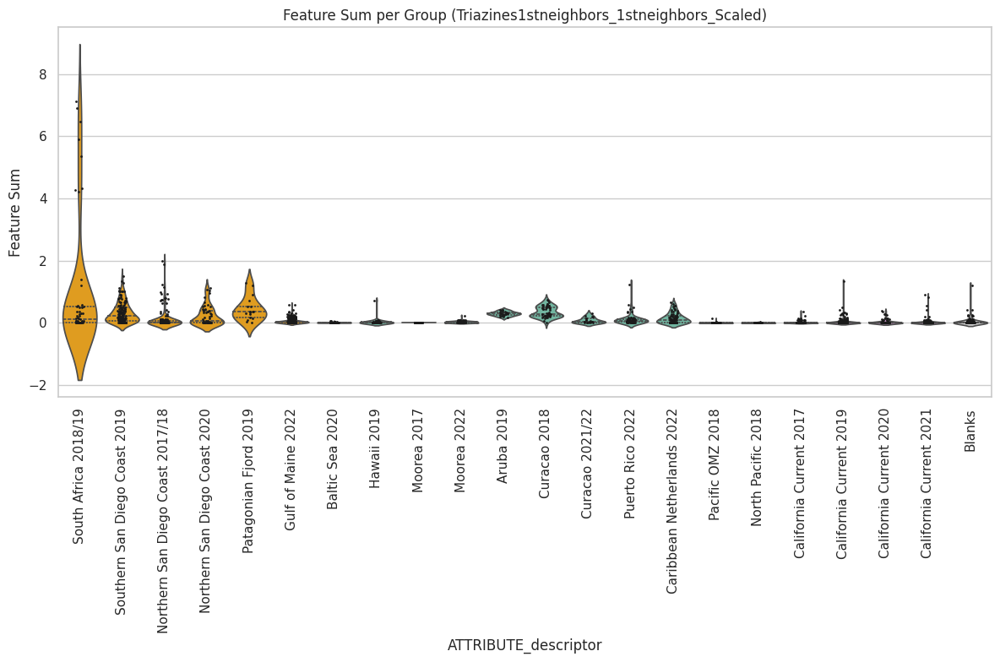

/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


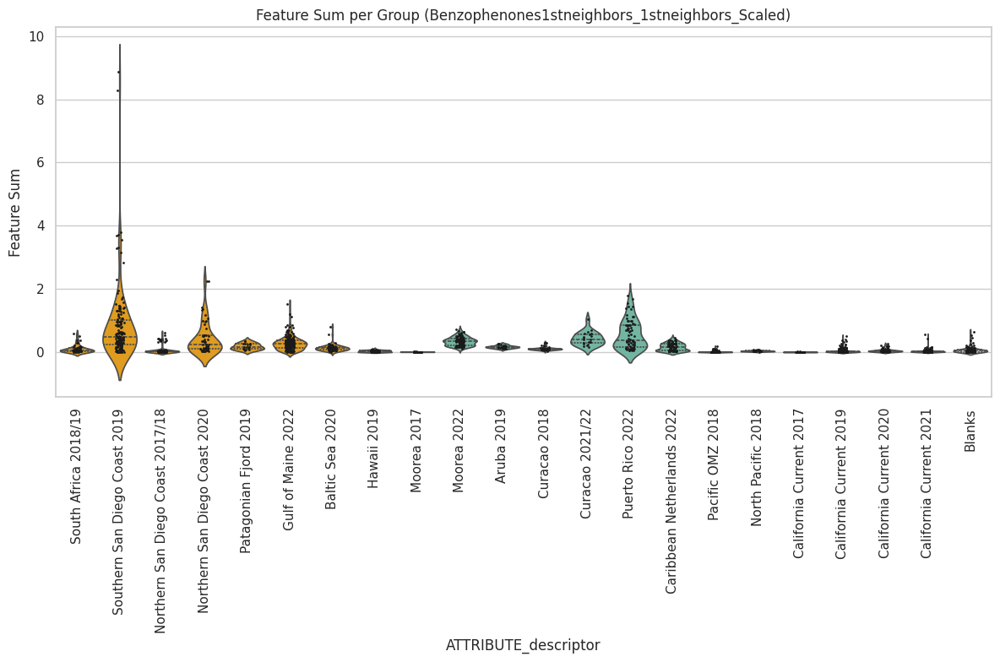

/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


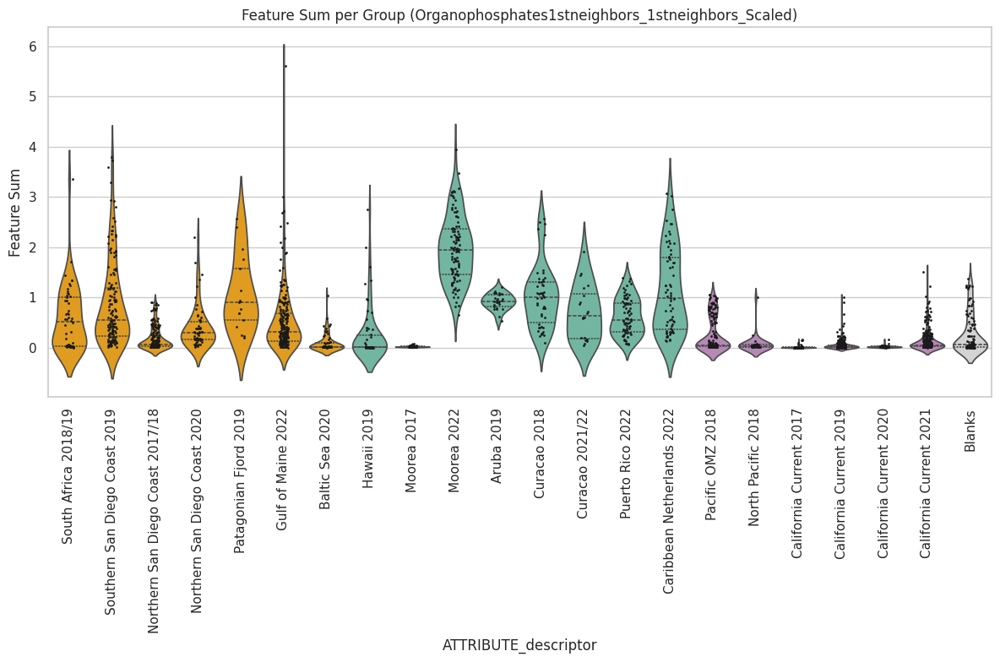

/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_1145/654595738.py:66: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


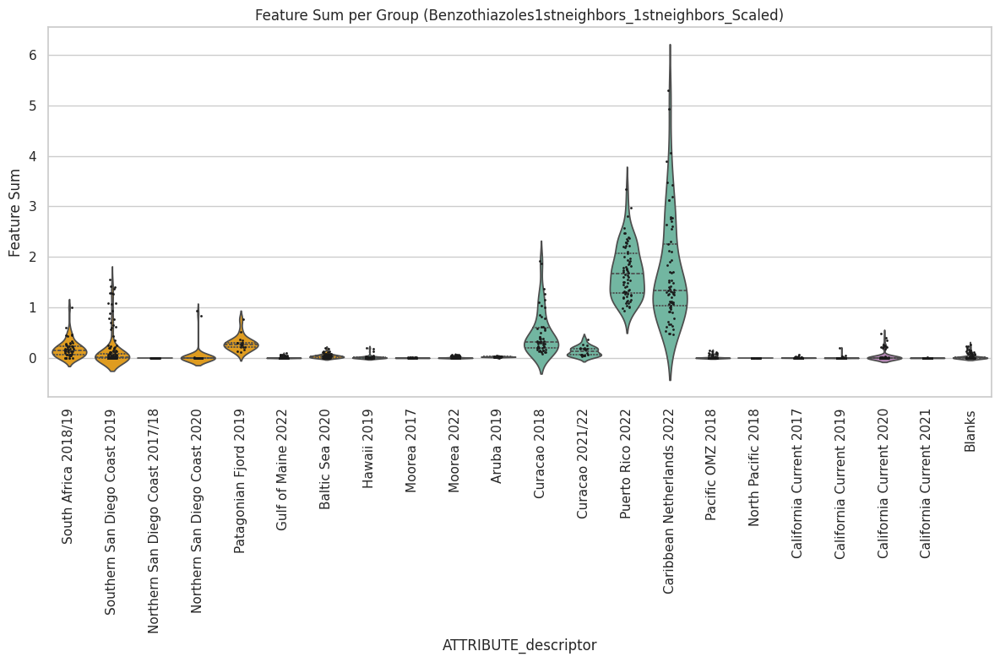

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('xenobiotics1stneighbors_withblanks(class)_scaled.csv', index_col='row ID')

# List of classes to iterate over
classes = ['glycol', 'surfactant', 'guanidino', 'phthalate', 'triazine', 'benzophenone', 'organophosphate', 'benzothiazole']

# Load metadata
metadata = pd.read_table('merged_metadata_AbsolutelyFinal_FBMN_20241110.txt', sep='\t')

# Define the desired order for ATTRIBUTE_descriptor
descriptor_order = ['South Africa 2018/19', 'Southern San Diego Coast 2019', 'Northern San Diego Coast 2017/18', 'Northern San Diego Coast 2020', 'Patagonian Fjord 2019', 'Gulf of Maine 2022', 'Baltic Sea 2020', 'Hawaii 2019', 'Moorea 2017', 'Moorea 2022', 'Aruba 2019', 'Curacao 2018', 'Curacao 2021/22', 'Puerto Rico 2022', 'Caribbean Netherlands 2022', 'Pacific OMZ 2018', 'North Pacific 2018', 'California Current 2017', 'California Current 2019', 'California Current 2020', 'California Current 2021', 'Blanks']

# Define custom colors
custom_palette = {
    'South Africa 2018/19': 'orange',
    'Southern San Diego Coast 2019': 'orange',
    'Northern San Diego Coast 2017/18': 'orange',
    'Northern San Diego Coast 2020': 'orange',
    'Patagonian Fjord 2019': 'orange',
    'Gulf of Maine 2022': 'orange',
    'Baltic Sea 2020': 'orange',
    'Hawaii 2019': '#66c2a5',
    'Moorea 2017': '#66c2a5',
    'Moorea 2022': '#66c2a5',
    'Aruba 2019': '#66c2a5',
    'Curacao 2018': '#66c2a5',
    'Curacao 2021/22': '#66c2a5',
    'Puerto Rico 2022': '#66c2a5',
    'Caribbean Netherlands 2022': '#66c2a5',
    'Pacific OMZ 2018': '#bc80bd',
    'North Pacific 2018': '#bc80bd',
    'California Current 2017': '#bc80bd',
    'California Current 2019': '#bc80bd',
    'California Current 2020': '#bc80bd',
    'California Current 2021': '#bc80bd',
    'Blanks': 'lightgrey'
}

for class_name in classes:
    # Filter the DataFrame for the current class using str.contains
    df_class = df[df['Class'].str.contains(class_name, case=False, na=False)]

    # Filter columns containing ".mz"
    df_class = df_class.filter(regex=".mz")

    # Transpose the DataFrame so that sample names are the index
    df_class = df_class.transpose()

    # Sum all rows
    df_class['feature sum'] = df_class.sum(axis=1)

    # Merge with metadata according to descriptor
    df_merged = df_class.merge(metadata[['filename', 'ATTRIBUTE_descriptor']], left_index=True, right_on='filename')

    # Sort the DataFrame based on the desired order
    df_merged['ATTRIBUTE_descriptor'] = pd.Categorical(df_merged['ATTRIBUTE_descriptor'], categories=descriptor_order, ordered=True)
    df_merged = df_merged.sort_values('ATTRIBUTE_descriptor')

    # Plot violin plot
    plt.figure(figsize=(12, 8))
    sns.set_theme(style="whitegrid")
    ax = sns.violinplot(
        data=df_merged,
        x='ATTRIBUTE_descriptor',
        y='feature sum',
        inner='quartile',  # Show quartiles inside the violin
        palette=custom_palette,
        scale='width'  # Normalize the width of the violins
    )
    sns.stripplot(
        data=df_merged,
        x='ATTRIBUTE_descriptor',
        y='feature sum',
        color='k',
        size=2,  # Adjust size if needed
        jitter=True,  # Add jitter to prevent overlapping
        ax=ax
    )

    # Capitalize the first letter of the class name and add trailing "s" for plot title and file name
    class_name_capitalized = class_name.capitalize() + "s1stneighbors"

    plt.title(f'Feature Sum per Group ({class_name_capitalized}_1stneighbors_Scaled)')
    plt.xlabel('ATTRIBUTE_descriptor')
    plt.ylabel('Feature Sum')
    plt.xticks(rotation=90)
    plt.tight_layout()
    
    # Save the plot as SVG file
    plt.savefig(f'{class_name_capitalized}_1stneighbors_Scaled_violinplot.svg')
    
    # Show the plot
    plt.show()